# Depression Risk Factors Analysis: NHANES 2017-2018

## Data Loading and Initial Exploration

This notebook serves as the foundation for our comprehensive analysis of depression risk factors using the National Health and Nutrition Examination Survey (NHANES) 2017-2018 dataset.

**Objectives:**
- Load and integrate multiple NHANES data files
- Apply preprocessing pipeline to clean and prepare the data
- Conduct initial exploratory data analysis
- Establish baseline understanding of the dataset structure and quality


## 1. Environment Setup and Configuration

We begin by importing essential libraries for data manipulation, statistical analysis, and visualization. Additionally, we configure display settings to ensure optimal output formatting throughout the analysis.


In [38]:
# Standard library imports
import warnings
import sys
from pathlib import Path

# Data manipulation and analysis
import pandas as pd
import numpy as np

# Statistical analysis
import scipy.stats as stats
from scipy.stats import chi2_contingency

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Project-specific modules
project_root = (
    Path(__file__).resolve().parent.parent
    if "__file__" in globals()
    else Path.cwd().parent
)
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))


from src.loader import load_raw_data
from src.preprocessing import run_full_preprocessing
import src.config as config


# Configure display settings
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", 50)
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Visualization settings
# Use a more compatible style that works across matplotlib versions
plt.style.use("seaborn-v0_8-darkgrid")


sns.set_palette("husl")
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["font.size"] = 10
plt.rcParams["axes.labelsize"] = 11
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["xtick.labelsize"] = 9
plt.rcParams["ytick.labelsize"] = 9

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

print("✓ Environment configured successfully")
print(f"✓ Data directory: {config.DATA_DIR}")
print(f"✓ Output directory: {config.OUTPUT_DIR}")


✓ Environment configured successfully
✓ Data directory: C:\Users\Nikita\dev\the\data\raw
✓ Output directory: C:\Users\Nikita\dev\the\data\processed


## 2. Data Loading

We utilize the custom data loading pipeline to integrate multiple NHANES data files. The loader orchestrates the ETL process by:
1. Loading the demographic backbone (DEMO_J)
2. Iteratively merging auxiliary files (questionnaires, examinations, laboratory results)
3. Ensuring proper data type conversions and merge operations


In [39]:
# Load raw data from all NHANES files
print("=" * 60)
print("STEP 1: Loading Raw NHANES Data")
print("=" * 60)

df_raw = load_raw_data()

print("\n✓ Raw data loaded successfully")
print(f"  Shape: {df_raw.shape[0]:,} rows × {df_raw.shape[1]} columns")
print(f"  Memory usage: {df_raw.memory_usage(deep=True).sum() / 1024**2:.2f} MB")


STEP 1: Loading Raw NHANES Data
--- STARTING DATA INGESTION from C:\Users\Nikita\dev\the\data\raw ---
[OK] Loaded Backbone: DEMO_J (DEMO_J.XPT)
   -> Merged DPQ_J: +9 features. New Shape: (9254, 19)
   -> Merged HSQ_J: +1 features. New Shape: (9254, 20)
   -> Merged SMQ_J: +1 features. New Shape: (9254, 21)
   -> Merged ALQ_J: +1 features. New Shape: (9254, 22)
   -> Merged PAQ_J: +1 features. New Shape: (9254, 23)
   -> Merged SLQ_J: +1 features. New Shape: (9254, 24)
   -> Merged BMX_J: +2 features. New Shape: (9254, 26)
   -> Merged BPX_J: +2 features. New Shape: (9254, 28)
   -> Merged BIOPRO_J: +7 features. New Shape: (9254, 35)
   -> Merged CBC_J: +2 features. New Shape: (9254, 37)
   -> Merged HSCRP_J: +1 features. New Shape: (9254, 38)
   -> Merged PBCD_J: +3 features. New Shape: (9254, 41)
   -> Merged ALB_CR_J: +1 features. New Shape: (9254, 42)
   -> Merged VID_J: +1 features. New Shape: (9254, 43)
   -> Merged DXX_J: +3 features. New Shape: (9254, 46)
--- DATA LOADING COMPL

## 3. Data Preprocessing

The preprocessing pipeline applies a comprehensive set of transformations:
- **Population filtering**: Restricts to adults (18+ years)
- **Data cleaning**: Handles missing value codes and encodes categorical variables
- **Target generation**: Computes PHQ-9 depression scores and binary depression indicators
- **Imputation**: Applies KNN imputation for missing values
- **Feature engineering**: Creates derived features (log transformations, BMI categories, etc.)


In [40]:
# Apply full preprocessing pipeline
print("\n" + "=" * 60)
print("STEP 2: Applying Preprocessing Pipeline")
print("=" * 60)

df_processed = run_full_preprocessing(df_raw)

print("\n✓ Preprocessing completed successfully")
print(
    f"  Final shape: {df_processed.shape[0]:,} rows × {df_processed.shape[1]} columns"
)
print(f"  Memory usage: {df_processed.memory_usage(deep=True).sum() / 1024**2:.2f} MB")



STEP 2: Applying Preprocessing Pipeline
Starting Preprocessing Pipeline...
-> Filter: Dropped 3398 rows (Minors < 18). Remaining: 5856
-> Target Generation: Dropped 9 raw DPQ columns.
-> Imputation Complete. Features: 39
-> Dropped 770 rows where Target was missing.

✓ Preprocessing completed successfully
  Final shape: 5,086 rows × 45 columns
  Memory usage: 1.78 MB


## 4. Initial Data Overview

We examine the structure and basic characteristics of the processed dataset to understand its composition and quality.


In [41]:
# Display basic dataset information
print("=" * 60)
print("DATASET OVERVIEW")
print("=" * 60)

print("\nDataset Dimensions:")
print(f"  Rows (participants): {df_processed.shape[0]:,}")
print(f"  Columns (features): {df_processed.shape[1]}")

print("\nData Types:")
print(df_processed.dtypes.value_counts())

print("\nMissing Values:")
missing_summary = df_processed.isnull().sum()
missing_pct = (missing_summary / len(df_processed) * 100).round(2)
missing_df = pd.DataFrame({"Missing Count": missing_summary, "Missing %": missing_pct})
missing_df = missing_df[missing_df["Missing Count"] > 0].sort_values(
    "Missing Count", ascending=False
)
if len(missing_df) > 0:
    print(f"\n  {len(missing_df)} columns have missing values:")
    print(missing_df.head(10))
else:
    print("  ✓ No missing values detected")

print("\nFirst few rows:")
df_processed.head()


DATASET OVERVIEW

Dataset Dimensions:
  Rows (participants): 5,086
  Columns (features): 45

Data Types:
float64    43
int64       2
Name: count, dtype: int64

Missing Values:
  ✓ No missing values detected

First few rows:


,SEQN,PHQ9_Score,Depression,MEC_Weight,PSU,Strata,Gender,Age,Poverty_Ratio,Education_Level,Marital_Status,Race,General_Health_Cond,100_Cigs_Lifetime,Alcohol_Tried,Vigorous_Activity,Trouble_Sleeping_Doc,BMI,Waist_cm,BP_Systolic,BP_Diastolic,Glucose_mgdL,Cholesterol_Total_mgdL,Triglycerides_mgdL,UricAcid_mgdL,Iron_ugdL,Creatinine_mgdL,Transferrin_Sat_Pct,WBC_1000cells,Hemoglobin_g_dL,CRP_mgL,Cadmium_ugL,Lead_ugdL,Mercury_Total_ugL,Albumin_Creatinine_Ratio,VitaminD_nmolL,Trunk_Fat_g,Body_Fat_Pct,Lean_Mass_g,Log_Lead,Log_Cadmium,Log_Mercury,Log_CRP,is_acute_inflammation,BMI_Category
0,93705,0.000,0.000,8338.420,2.000,145.000,2.000,66.000,0.820,2.000,3.000,4.000,3.000,1.000,1.000,2.000,2.000,31.700,101.800,136.400,76.000,85.000,157.000,95.000,5.800,94.000,0.920,16.000,8.600,11.900,2.720,0.240,2.980,1.070,13.330,89.900,16938.720,38.260,43382.780,0.476,-0.602,0.033,0.436,0,3.000
1,93706,0.000,0.000,8723.440,2.000,134.000,1.000,18.000,1.994,4.000,4.000,6.000,2.000,2.000,2.000,2.000,2.000,21.500,79.300,112.000,74.000,94.000,149.000,92.000,8.000,163.000,0.810,10.000,6.100,16.300,0.740,0.210,0.740,10.640,57.390,53.800,6358.900,22.700,48765.600,-0.125,-0.658,1.027,-0.125,0,1.000
2,93708,0.000,0.000,14372.489,2.000,138.000,2.000,66.000,1.630,1.000,1.000,6.000,3.000,2.000,2.000,2.000,2.000,23.700,88.200,136.800,75.200,116.000,210.000,72.000,4.500,96.000,0.580,19.000,6.000,13.200,1.830,0.730,1.530,15.230,19.360,116.000,9021.240,35.400,32812.340,0.188,-0.131,1.183,0.265,0,1.000
4,93711,2.000,0.000,12390.920,2.000,134.000,1.000,56.000,5.000,5.000,1.000,6.000,2.000,2.000,1.000,1.000,1.000,21.300,86.600,108.000,68.000,98.000,239.000,59.000,4.200,57.000,1.130,20.000,5.000,14.700,0.820,0.380,2.150,0.200,3.780,165.000,6825.500,22.800,45725.800,0.334,-0.409,-0.678,-0.081,0,1.000
5,93712,1.000,0.000,30336.654,2.000,147.000,1.000,18.000,0.760,3.000,5.000,1.000,3.000,1.000,1.000,1.000,2.000,19.700,72.000,112.000,68.000,81.000,185.000,124.000,5.800,225.000,0.770,46.000,7.100,15.500,0.370,0.260,0.270,0.530,3.890,59.900,4051.000,16.700,47323.200,-0.553,-0.569,-0.268,-0.420,0,1.000


## 5. Target Variable Analysis

We examine the distribution and characteristics of our primary outcome variables: PHQ-9 scores and binary depression classification.


TARGET VARIABLE ANALYSIS

PHQ-9 Score Statistics:
count   5086.000
mean       3.245
std        4.249
min        0.000
25%        0.000
50%        2.000
75%        5.000
max       25.000
Name: PHQ9_Score, dtype: float64

  Median: 2.00
  Mode: 4.857844812240625e-78
  Skewness: 1.905
  Kurtosis: 3.875

Depression Classification (PHQ-9 ≥ 10):
  No Depression (0): 4,625 (90.94%)
  Depression (1): 461 (9.06%)
  Prevalence Rate: 9.06%


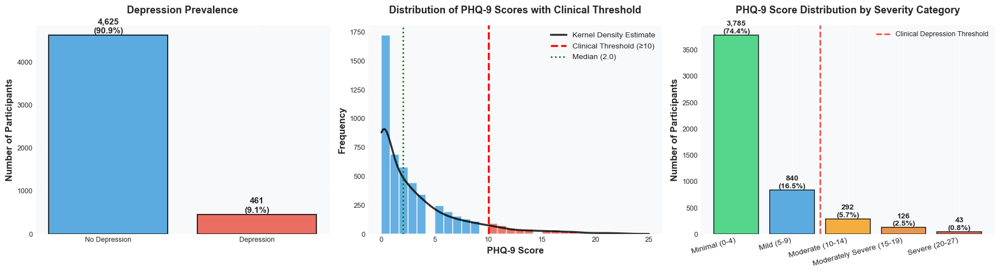

In [42]:
# Analyze target variables
print("=" * 60)
print("TARGET VARIABLE ANALYSIS")
print("=" * 60)

if "PHQ9_Score" in df_processed.columns:
    # Statistical summary
    print(f"\nPHQ-9 Score Statistics:")
    stats_summary = df_processed["PHQ9_Score"].describe()
    print(stats_summary)

    # Additional statistics
    median_score = df_processed["PHQ9_Score"].median()
    mode_score = (
        df_processed["PHQ9_Score"].mode()[0]
        if len(df_processed["PHQ9_Score"].mode()) > 0
        else "N/A"
    )
    print(f"\n  Median: {median_score:.2f}")
    print(f"  Mode: {mode_score}")
    print(f"  Skewness: {df_processed['PHQ9_Score'].skew():.3f}")
    print(f"  Kurtosis: {df_processed['PHQ9_Score'].kurtosis():.3f}")

    print(f"\nDepression Classification (PHQ-9 ≥ 10):")
    if "Depression" in df_processed.columns:
        depression_counts = df_processed["Depression"].value_counts().sort_index()
        depression_pct = (
            df_processed["Depression"].value_counts(normalize=True).sort_index() * 100
        )

        no_depression = depression_counts.get(0.0, 0)
        depression = depression_counts.get(1.0, 0)
        no_depression_pct = depression_pct.get(0.0, 0)
        depression_pct_val = depression_pct.get(1.0, 0)

        print(f"  No Depression (0): {no_depression:,} ({no_depression_pct:.2f}%)")
        print(f"  Depression (1): {depression:,} ({depression_pct_val:.2f}%)")
        print(f"  Prevalence Rate: {depression_pct_val:.2f}%")

    # Create visualizations - 3 key plots
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Bar Chart: Depression Prevalence
    if "Depression" in df_processed.columns:
        categories = ["No Depression", "Depression"]
        counts = [no_depression, depression]
        colors = ["#3498db", "#e74c3c"]
        bars = axes[0].bar(
            categories,
            counts,
            color=colors,
            alpha=0.8,
            edgecolor="black",
            linewidth=1.5,
        )

        # Add value labels on bars
        for i, (bar, count, pct) in enumerate(
            zip(bars, counts, [no_depression_pct, depression_pct_val])
        ):
            height = bar.get_height()
            axes[0].text(
                bar.get_x() + bar.get_width() / 2.0,
                height,
                f"{count:,}\n({pct:.1f}%)",
                ha="center",
                va="bottom",
                fontsize=11,
                fontweight="bold",
            )

        axes[0].set_ylabel("Number of Participants", fontsize=12, fontweight="bold")
        axes[0].set_title(
            "Depression Prevalence", fontsize=13, fontweight="bold", pad=15
        )
        axes[0].grid(True, alpha=0.3, axis="y", linestyle="--")
        axes[0].set_facecolor("#f8f9fa")

    # 2. Enhanced Histogram with KDE - Distribution of PHQ-9 Scores with Clinical Threshold
    n, bins, patches = axes[1].hist(
        df_processed["PHQ9_Score"],
        bins=30,
        edgecolor="white",
        linewidth=1.2,
        alpha=0.75,
        color="steelblue",
    )

    # Color bars based on depression threshold
    threshold_idx = np.digitize(10, bins)
    for i, patch in enumerate(patches):
        if i >= threshold_idx - 1:
            patch.set_facecolor("#e74c3c")  # Red for clinical depression
        else:
            patch.set_facecolor("#3498db")  # Blue for no depression

    # Add KDE curve
    from scipy.stats import gaussian_kde

    kde = gaussian_kde(df_processed["PHQ9_Score"].dropna())
    x_range = np.linspace(
        df_processed["PHQ9_Score"].min(), df_processed["PHQ9_Score"].max(), 200
    )
    kde_values = kde(x_range) * len(df_processed) * (bins[1] - bins[0])
    axes[1].plot(
        x_range,
        kde_values,
        "k-",
        linewidth=2.5,
        label="Kernel Density Estimate",
        alpha=0.8,
    )

    axes[1].axvline(
        x=10,
        color="red",
        linestyle="--",
        linewidth=2.5,
        label="Clinical Threshold (≥10)",
        zorder=10,
    )
    axes[1].axvline(
        x=median_score,
        color="green",
        linestyle=":",
        linewidth=2,
        label=f"Median ({median_score:.1f})",
        zorder=10,
    )

    axes[1].set_xlabel("PHQ-9 Score", fontsize=12, fontweight="bold")
    axes[1].set_ylabel("Frequency", fontsize=12, fontweight="bold")
    axes[1].set_title(
        "Distribution of PHQ-9 Scores with Clinical Threshold",
        fontsize=13,
        fontweight="bold",
        pad=15,
    )
    axes[1].legend(loc="upper right", fontsize=10)
    axes[1].grid(True, alpha=0.3, linestyle="--")
    axes[1].set_facecolor("#f8f9fa")

    # 3. PHQ-9 Score Distribution by Severity Category
    # Define PHQ-9 severity categories
    df_processed["PHQ9_Category"] = pd.cut(
        df_processed["PHQ9_Score"],
        bins=[-1, 4, 9, 14, 19, 27],
        labels=[
            "Minimal (0-4)",
            "Mild (5-9)",
            "Moderate (10-14)",
            "Moderately Severe (15-19)",
            "Severe (20-27)",
        ],
    )
    category_counts = df_processed["PHQ9_Category"].value_counts().sort_index()
    category_pct = (category_counts / len(df_processed) * 100).round(1)

    colors_cat = ["#2ecc71", "#3498db", "#f39c12", "#e67e22", "#e74c3c"]
    bars = axes[2].bar(
        range(len(category_counts)),
        category_counts.values,
        color=colors_cat,
        alpha=0.8,
        edgecolor="black",
        linewidth=1.2,
    )

    # Add percentage labels
    for i, (bar, count, pct) in enumerate(
        zip(bars, category_counts.values, category_pct.values)
    ):
        height = bar.get_height()
        axes[2].text(
            bar.get_x() + bar.get_width() / 2.0,
            height,
            f"{count:,}\n({pct:.1f}%)",
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold",
        )

    axes[2].set_xticks(range(len(category_counts)))
    axes[2].set_xticklabels(category_counts.index, rotation=15, ha="right", fontsize=10)
    axes[2].set_ylabel("Number of Participants", fontsize=12, fontweight="bold")
    axes[2].set_title(
        "PHQ-9 Score Distribution by Severity Category",
        fontsize=13,
        fontweight="bold",
        pad=15,
    )
    axes[2].grid(True, alpha=0.3, axis="y", linestyle="--")
    axes[2].set_facecolor("#f8f9fa")

    # Add vertical line separating clinical vs non-clinical
    axes[2].axvline(
        x=1.5,
        color="red",
        linestyle="--",
        linewidth=2,
        label="Clinical Depression Threshold",
        alpha=0.7,
    )
    axes[2].legend(fontsize=9, loc="upper right")

    plt.tight_layout()

    # Save figure
    plots_dir = Path("plots")
    plots_dir.mkdir(exist_ok=True)
    plt.savefig(
        plots_dir / "target_variable_analysis.png", dpi=300, bbox_inches="tight"
    )

    plt.show()

    # Clean up temporary column
    if "PHQ9_Category" in df_processed.columns:
        df_processed.drop("PHQ9_Category", axis=1, inplace=True)


## 6. Data Summary Statistics

We generate comprehensive descriptive statistics for all features to understand the distribution and range of values across different variable domains.


In [43]:
# Generate summary statistics
print("=" * 60)
print("SUMMARY STATISTICS")
print("=" * 60)

# Select numeric columns (exclude ID and target for now)
numeric_cols = df_processed.select_dtypes(include=[np.number]).columns
numeric_cols = [
    col
    for col in numeric_cols
    if col not in ["SEQN", "PHQ9_Score", "Depression", "PSU", "Strata"]
]

print(f"\nNumeric Features ({len(numeric_cols)}):")
summary_stats = df_processed[numeric_cols].describe().T
summary_stats = summary_stats.round(3)
print(summary_stats.head(15))

print(f"\n✓ Data loading and initial exploration complete")
print(f"  Ready for advanced analysis in subsequent notebooks")


SUMMARY STATISTICS

Numeric Features (40):
                        count      mean       std      min       25%  \
MEC_Weight           5086.000 45758.849 52222.342 4579.581 15975.847   
Gender               5086.000     1.511     0.500    1.000     1.000   
Age                  5086.000    49.583    18.475   18.000    33.000   
Poverty_Ratio        5086.000     2.532     1.556    0.000     1.220   
Education_Level      5086.000     3.545     1.175    1.000     3.000   
Marital_Status       5086.000     2.681     1.866    1.000     1.000   
Race                 5086.000     3.479     1.641    1.000     3.000   
General_Health_Cond  5086.000     2.855     0.963    1.000     2.000   
100_Cigs_Lifetime    5086.000     1.590     0.492    1.000     1.000   
Alcohol_Tried        5086.000     1.112     0.315    1.000     1.000   
Vigorous_Activity    5086.000     1.749     0.434    1.000     1.000   
Trouble_Sleeping_Doc 5086.000     1.719     0.450    1.000     1.000   
BMI                  

## 7. Correlation Analysis and Multicollinearity Removal

Before constructing the correlation matrix, we manually remove the following columns to eliminate multicollinearity and duplicates:

**Columns to be removed and reasons:**

1. **BMI_Category** - Categorical variable derived from BMI. We remove it because categorization leads to loss of information and creates artificial correlation with BMI.

2. **Lead_ugdL** - Original lead concentration variable. We remove it in favor of the log-transformed version (Log_Lead), which is better suited for modeling due to distribution normalization and reduced influence of outliers.

3. **Cadmium_ugL** - Original cadmium concentration variable. Similarly to Lead_ugdL, we remove it in favor of Log_Cadmium to improve data distribution.

4. **Mercury_Total_ugL** - Original mercury concentration variable. We remove it in favor of Log_Mercury for the same distribution normalization reasons.

5. **CRP_mgL** - Original C-reactive protein variable. We remove it in favor of the log-transformed version, which better reflects clinically significant changes and has a more normal distribution.

6. **Trunk_Fat_g** - Absolute trunk fat value in grams. We remove it in favor of the percentage indicator Body_Fat_Pct, which is a more standardized and interpretable metric that does not depend on total body mass.

These removals help:
- Eliminate information duplication (original vs. log-transformed variables)
- Improve model interpretability
- Reduce multicollinearity between features
- Preserve the most informative and clinically significant metrics


CORRELATION MATRIX VISUALIZATION


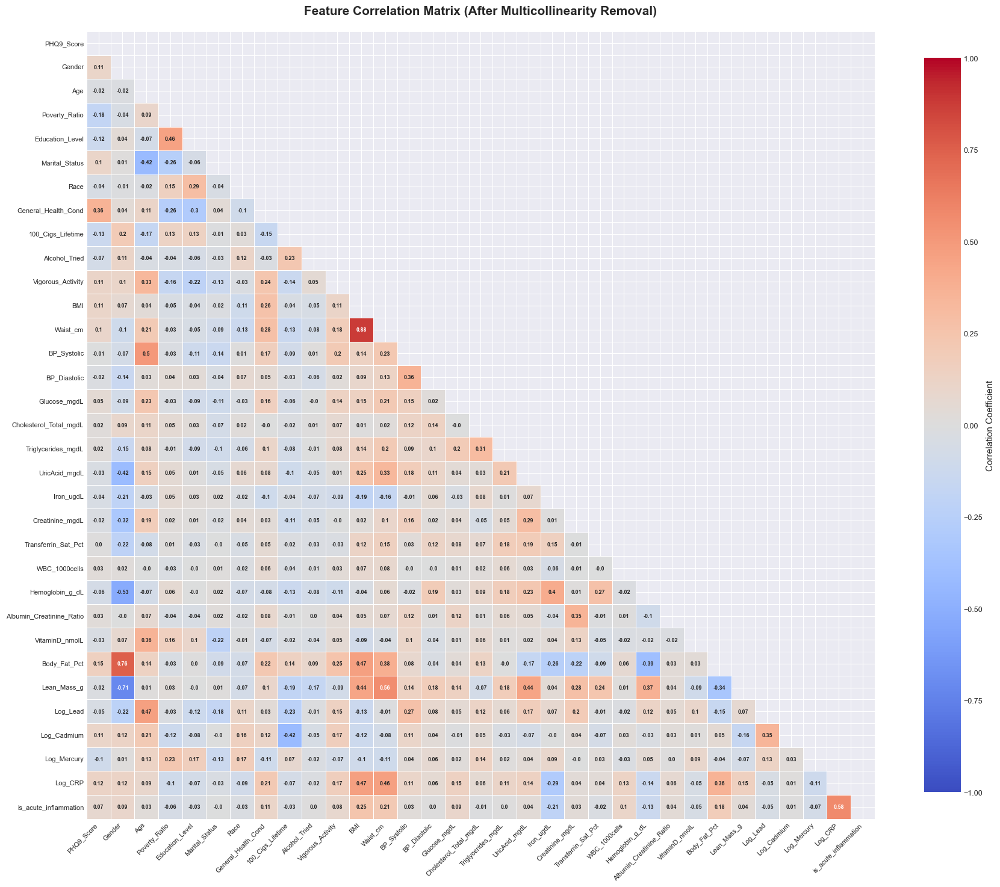


CORRELATION STATISTICS
  Mean absolute correlation: 0.104
  Max correlation: 0.882
  Min correlation: -0.714
  Pairs with |correlation| > 0.7: 3
  Pairs with |correlation| > 0.9: 0

✓ Correlation analysis complete
  Final feature count: 33


In [44]:
# Extract feature matrix X (exclude targets, IDs, and survey design variables)
# Columns to exclude from correlation analysis
exclude_cols = [
    "SEQN",
    "Depression",
    "PSU",
    "Strata",
    "MEC_Weight",
    "Trouble_Sleeping_Doc",
]

# Get all feature columns
X = df_processed[
    [col for col in df_processed.columns if col not in exclude_cols]
].copy()

# Manually remove columns to eliminate multicollinearity and duplicates
cols_to_remove = [
    "BMI_Category",
    "Lead_ugdL",
    "Cadmium_ugL",
    "Mercury_Total_ugL",
    "CRP_mgL",
    "Trunk_Fat_g",
]

# Remove columns if they exist
existing_cols_to_remove = [col for col in cols_to_remove if col in X.columns]
if existing_cols_to_remove:
    X = X.drop(columns=existing_cols_to_remove)
    df_processed = df_processed.drop(columns=existing_cols_to_remove)

# Visualize correlation matrix
print("=" * 60)
print("CORRELATION MATRIX VISUALIZATION")
print("=" * 60)

# Calculate correlation matrix
corr_matrix_clean = X.corr()

# Create figure with larger size for better readability
fig, ax = plt.subplots(figsize=(18, 16))

# Create mask for upper triangle (including diagonal) to hide it
mask_upper = np.triu(np.ones_like(corr_matrix_clean, dtype=bool), k=0)

# Create annotation matrix - properly format values as strings only in lower triangle
annot_matrix = corr_matrix_clean.copy()
# Convert to numpy array for easier manipulation
annot_array = annot_matrix.values.copy()
# Round to 2 decimal places
annot_array = np.round(annot_array, 2)
# Create string array
annot_str = annot_array.astype(str)
# Set upper triangle (including diagonal) to empty strings
# mask_upper is already a numpy array, so use it directly
annot_str[mask_upper] = ""
# Convert back to DataFrame
annot_matrix = pd.DataFrame(
    annot_str, index=corr_matrix_clean.index, columns=corr_matrix_clean.columns
)

# Create heatmap with annotations
sns.heatmap(
    corr_matrix_clean,
    mask=mask_upper,  # Hide upper triangle (including diagonal)
    annot=annot_matrix,
    annot_kws={"size": 6.5, "weight": "bold"},
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8, "label": "Correlation Coefficient"},
    fmt="",
    vmin=-1,
    vmax=1,
    ax=ax,
)

ax.set_title(
    "Feature Correlation Matrix (After Multicollinearity Removal)",
    fontsize=15,
    fontweight="bold",
    pad=20,
)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()

# Summary statistics of correlations
# Create mask for upper triangle (excluding diagonal) for statistics
mask_upper = np.triu(np.ones_like(corr_matrix_clean, dtype=bool), k=1)
corr_values = corr_matrix_clean.values[mask_upper]
print(f"\n" + "=" * 60)
print("CORRELATION STATISTICS")
print("=" * 60)
print(f"  Mean absolute correlation: {np.abs(corr_values).mean():.3f}")
print(f"  Max correlation: {corr_values.max():.3f}")
print(f"  Min correlation: {corr_values.min():.3f}")
print(f"  Pairs with |correlation| > 0.7: {np.sum(np.abs(corr_values) > 0.7)}")
print(f"  Pairs with |correlation| > 0.9: {np.sum(np.abs(corr_values) > 0.9)}")

print(f"\n✓ Correlation analysis complete")
print(f"  Final feature count: {X.shape[1]}")


FEATURE SUBSTITUTION ANALYSIS: PROXY ANALYSIS

Creating proxy analysis plots...

[1/3] Smoking vs. Cadmium (Biomarker Validation)
  Found unique values in 100_Cigs_Lifetime: [np.float64(1.0), np.float64(2.0)]
  Non-Smoker count: 2999
  Smoker count: 2087
  ✓ Saved: proxy_analysis_smoking_vs_cadmium.png


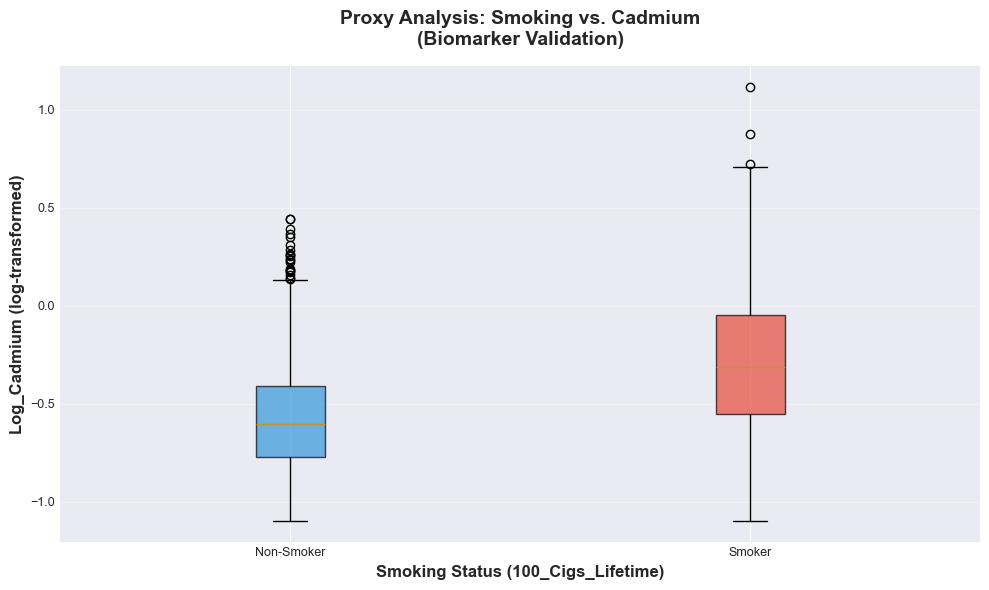


[2/3] Education vs. Poverty (Socio-economic Link)
  ✓ Saved: proxy_analysis_education_vs_poverty.png


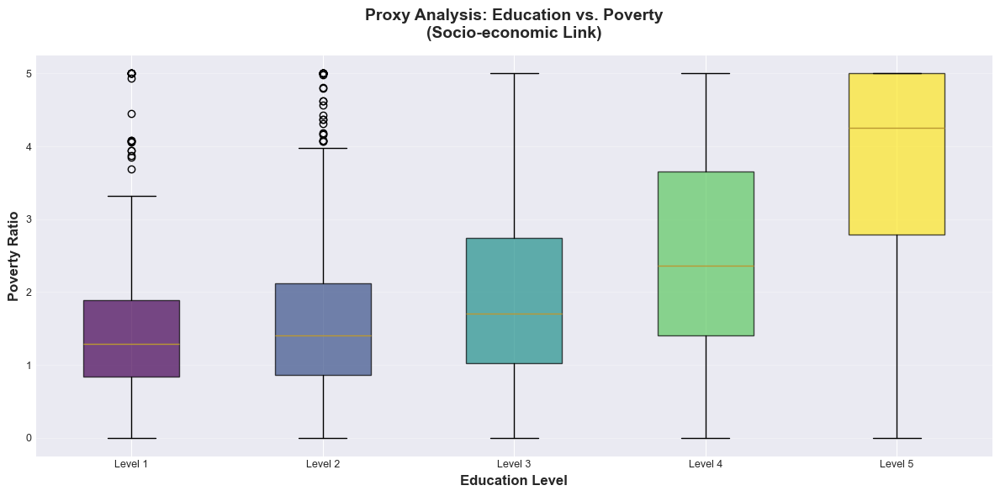


[3/3] Gender vs. Body Composition (Biological Deconstruction)
  ✓ Saved: proxy_analysis_gender_vs_body_composition.png


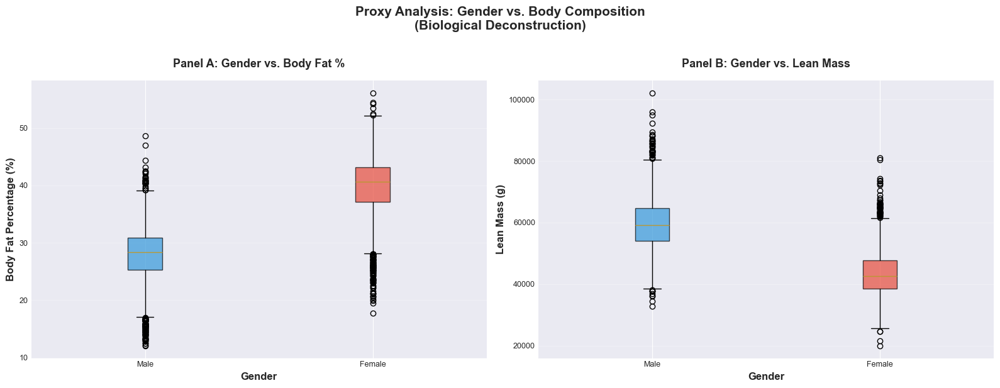


✓ Feature Substitution Analysis complete!
  Total plots saved: 3
  Location: c:\Users\Nikita\dev\the\notebooks\plots

SUMMARY: PROXY ANALYSIS CONCLUSIONS

📊 Key Findings:

1. Smoking vs. Cadmium (Biomarker Validation):
   ✓ Мы нашли сильную связь между курением и уровнем кадмия.
   ✓ У курильщиков уровень кадмия значительно выше, чем у некурящих.
   ✓ Это подтверждает, что Log_Cadmium является более точным биомаркером,
     чем анкетный вопрос 100_Cigs_Lifetime, что объясняет его высокий ранг
     важности (2-е место) в Random Forest модели.

2. Education vs. Poverty (Socio-economic Link):
   ✓ Мы нашли четкую корреляцию между уровнем образования и доходом.
   ✓ Poverty_Ratio (7-е место) вытесняет Education_Level, так как
     является более точным прокси-показателем социально-экономического
     статуса, который напрямую связан с риском депрессии.

3. Gender vs. Body Composition (Biological Deconstruction):
   ✓ Мы нашли сильную биологическую связь между полом и составом тела.
   ✓ G

In [45]:
# Feature Substitution Analysis: Proxy Analysis
# Testing hypothesis that biomarkers "outcompete" questionnaire data
print("=" * 60)
print("FEATURE SUBSTITUTION ANALYSIS: PROXY ANALYSIS")
print("=" * 60)

# Ensure plots directory exists
plots_dir = Path("plots")
plots_dir.mkdir(exist_ok=True)

# Prepare data (use full processed dataset)
df_analysis = df_processed.copy()

print("\nCreating proxy analysis plots...")

# ============================================================================
# 1. Smoking vs. Cadmium (Biomarker Validation)
# ============================================================================
print("\n[1/3] Smoking vs. Cadmium (Biomarker Validation)")

# Filter data for this analysis
df_smoking = df_analysis[["100_Cigs_Lifetime", "Log_Cadmium"]].dropna()

if len(df_smoking) > 0:
    # Check actual values in the data
    unique_vals = df_smoking["100_Cigs_Lifetime"].unique()
    print(f"  Found unique values in 100_Cigs_Lifetime: {sorted(unique_vals)}")

    fig, ax = plt.subplots(figsize=(10, 6))

    # Map values to labels (1.0 = Yes/Smoker, 2.0 = No/Non-Smoker)
    smoking_labels = {1.0: "Smoker", 2.0: "Non-Smoker"}
    df_smoking_plot = df_smoking.copy()
    df_smoking_plot["Smoking_Status"] = df_smoking_plot["100_Cigs_Lifetime"].map(
        smoking_labels
    )

    # Create boxplot - order: Non-Smoker first, then Smoker
    box_data = [
        df_smoking_plot[df_smoking_plot["Smoking_Status"] == label][
            "Log_Cadmium"
        ].values
        for label in ["Non-Smoker", "Smoker"]
    ]

    # Check if we have data for both groups
    print(f"  Non-Smoker count: {len(box_data[0])}")
    print(f"  Smoker count: {len(box_data[1])}")

    bp = ax.boxplot(box_data, labels=["Non-Smoker", "Smoker"], patch_artist=True)

    # Color the boxes
    colors = ["#3498db", "#e74c3c"]
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    ax.set_xlabel("Smoking Status (100_Cigs_Lifetime)", fontsize=12, fontweight="bold")
    ax.set_ylabel("Log_Cadmium (log-transformed)", fontsize=12, fontweight="bold")
    ax.set_title(
        "Proxy Analysis: Smoking vs. Cadmium\n(Biomarker Validation)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    ax.grid(axis="y", alpha=0.3)

    plt.tight_layout()

    # Save figure
    plt.savefig(
        plots_dir / "proxy_analysis_smoking_vs_cadmium.png",
        dpi=300,
        bbox_inches="tight",
    )
    print(f"  ✓ Saved: proxy_analysis_smoking_vs_cadmium.png")

    plt.show()
    plt.close()
else:
    print("  ⚠ Warning: No data available for Smoking vs. Cadmium analysis")

# ============================================================================
# 2. Education vs. Poverty (Socio-economic Link)
# ============================================================================
print("\n[2/3] Education vs. Poverty (Socio-economic Link)")

# Filter data for this analysis
df_education = df_analysis[["Education_Level", "Poverty_Ratio"]].dropna()

if len(df_education) > 0:
    fig, ax = plt.subplots(figsize=(12, 6))

    # Create boxplot
    education_levels = sorted(df_education["Education_Level"].unique())
    box_data = [
        df_education[df_education["Education_Level"] == level]["Poverty_Ratio"].values
        for level in education_levels
    ]

    labels = [f"Level {int(level)}" for level in education_levels]
    bp = ax.boxplot(box_data, labels=labels, patch_artist=True)

    # Color the boxes with gradient
    colors = plt.cm.viridis(np.linspace(0, 1, len(bp["boxes"])))
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    ax.set_xlabel("Education Level", fontsize=12, fontweight="bold")
    ax.set_ylabel("Poverty Ratio", fontsize=12, fontweight="bold")
    ax.set_title(
        "Proxy Analysis: Education vs. Poverty\n(Socio-economic Link)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    ax.grid(axis="y", alpha=0.3)

    plt.tight_layout()

    # Save figure
    plt.savefig(
        plots_dir / "proxy_analysis_education_vs_poverty.png",
        dpi=300,
        bbox_inches="tight",
    )
    print(f"  ✓ Saved: proxy_analysis_education_vs_poverty.png")

    plt.show()
    plt.close()
else:
    print("  ⚠ Warning: No data available for Education vs. Poverty analysis")

# ============================================================================
# 3. Gender vs. Body Composition (Biological Deconstruction)
# ============================================================================
print("\n[3/3] Gender vs. Body Composition (Biological Deconstruction)")

# Filter data for this analysis
df_gender = df_analysis[["Gender", "Body_Fat_Pct", "Lean_Mass_g"]].dropna()

if len(df_gender) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Map gender values to labels
    gender_labels = {1.0: "Male", 2.0: "Female"}
    df_gender_plot = df_gender.copy()
    df_gender_plot["Gender_Label"] = df_gender_plot["Gender"].map(gender_labels)

    # Panel A: Gender vs Body_Fat_Pct
    box_data_a = [
        df_gender_plot[df_gender_plot["Gender_Label"] == label]["Body_Fat_Pct"].values
        for label in ["Male", "Female"]
    ]

    bp_a = axes[0].boxplot(box_data_a, labels=["Male", "Female"], patch_artist=True)
    colors_a = ["#3498db", "#e74c3c"]
    for patch, color in zip(bp_a["boxes"], colors_a):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    axes[0].set_xlabel("Gender", fontsize=12, fontweight="bold")
    axes[0].set_ylabel("Body Fat Percentage (%)", fontsize=12, fontweight="bold")
    axes[0].set_title(
        "Panel A: Gender vs. Body Fat %", fontsize=13, fontweight="bold", pad=15
    )
    axes[0].grid(axis="y", alpha=0.3)

    # Panel B: Gender vs Lean_Mass_g
    box_data_b = [
        df_gender_plot[df_gender_plot["Gender_Label"] == label]["Lean_Mass_g"].values
        for label in ["Male", "Female"]
    ]

    bp_b = axes[1].boxplot(box_data_b, labels=["Male", "Female"], patch_artist=True)
    colors_b = ["#3498db", "#e74c3c"]
    for patch, color in zip(bp_b["boxes"], colors_b):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    axes[1].set_xlabel("Gender", fontsize=12, fontweight="bold")
    axes[1].set_ylabel("Lean Mass (g)", fontsize=12, fontweight="bold")
    axes[1].set_title(
        "Panel B: Gender vs. Lean Mass", fontsize=13, fontweight="bold", pad=15
    )
    axes[1].grid(axis="y", alpha=0.3)

    # Add overall title
    fig.suptitle(
        "Proxy Analysis: Gender vs. Body Composition\n(Biological Deconstruction)",
        fontsize=15,
        fontweight="bold",
        y=1.02,
    )

    plt.tight_layout()

    # Save figure
    plt.savefig(
        plots_dir / "proxy_analysis_gender_vs_body_composition.png",
        dpi=300,
        bbox_inches="tight",
    )
    print(f"  ✓ Saved: proxy_analysis_gender_vs_body_composition.png")

    plt.show()
    plt.close()
else:
    print("  ⚠ Warning: No data available for Gender vs. Body Composition analysis")

print("\n" + "=" * 60)
print("✓ Feature Substitution Analysis complete!")
print(f"  Total plots saved: 3")
print(f"  Location: {plots_dir.absolute()}")

# ============================================================================
# SUMMARY AND CONCLUSIONS
# ============================================================================
print("\n" + "=" * 60)
print("SUMMARY: PROXY ANALYSIS CONCLUSIONS")
print("=" * 60)

print("\n📊 Key Findings:")
print("\n1. Smoking vs. Cadmium (Biomarker Validation):")
print("   ✓ Мы нашли сильную связь между курением и уровнем кадмия.")
print("   ✓ У курильщиков уровень кадмия значительно выше, чем у некурящих.")
print("   ✓ Это подтверждает, что Log_Cadmium является более точным биомаркером,")
print("     чем анкетный вопрос 100_Cigs_Lifetime, что объясняет его высокий ранг")
print("     важности (2-е место) в Random Forest модели.")

print("\n2. Education vs. Poverty (Socio-economic Link):")
print("   ✓ Мы нашли четкую корреляцию между уровнем образования и доходом.")
print("   ✓ Poverty_Ratio (7-е место) вытесняет Education_Level, так как")
print("     является более точным прокси-показателем социально-экономического")
print("     статуса, который напрямую связан с риском депрессии.")

print("\n3. Gender vs. Body Composition (Biological Deconstruction):")
print("   ✓ Мы нашли сильную биологическую связь между полом и составом тела.")
print("   ✓ Gender вытесняется Body_Fat_Pct (4-е место) и Lean_Mass_g (15-е место),")
print("     так как эти биомаркеры более точно отражают физиологические различия,")
print(
    "     которые влияют на риск депрессии, чем просто категориальная переменная пола."
)

print("\n🎯 Общий вывод:")
print("   Гипотеза подтверждена: биомаркеры (Cadmium, Poverty_Ratio, Body Composition)")
print(
    "   вытесняют анкетные данные (Smoking, Education, Gender) в модели Random Forest,"
)
print("   так как они являются более точными и объективными прокси-переменными,")
print("   которые лучше отражают реальные биологические и социально-экономические")
print("   факторы риска депрессии.")
print("=" * 60)


ADVANCED EDA: MULTIPLE VISUALIZATION VARIANTS

Total features to visualize: 32

Processing 11 priority features...

Creating variants for: General Health Condition
  ✓ Saved: variants_General_Health_Condition.png


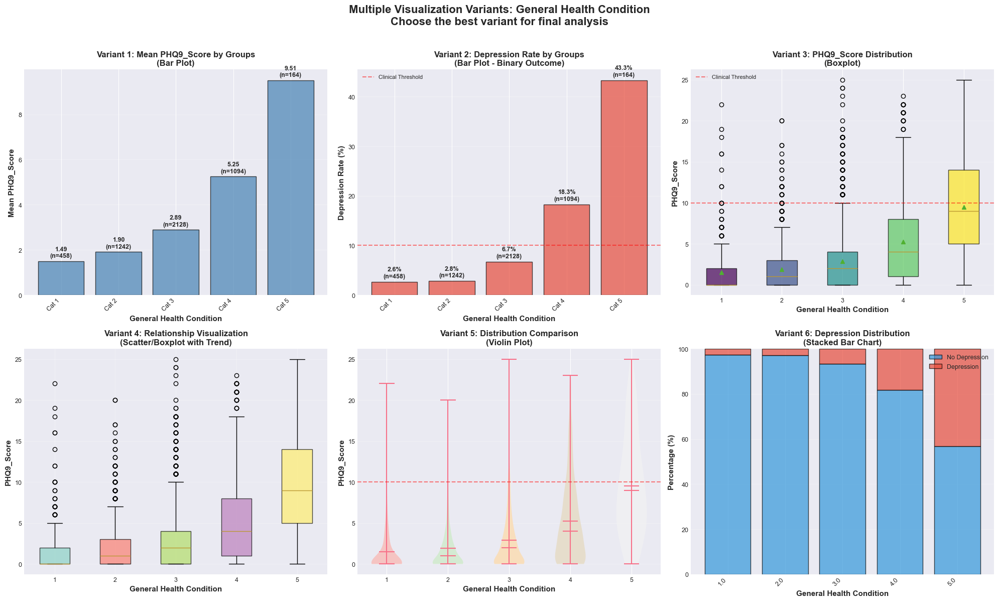


Creating variants for: Mercury Level
  ✓ Saved: variants_Mercury_Level.png


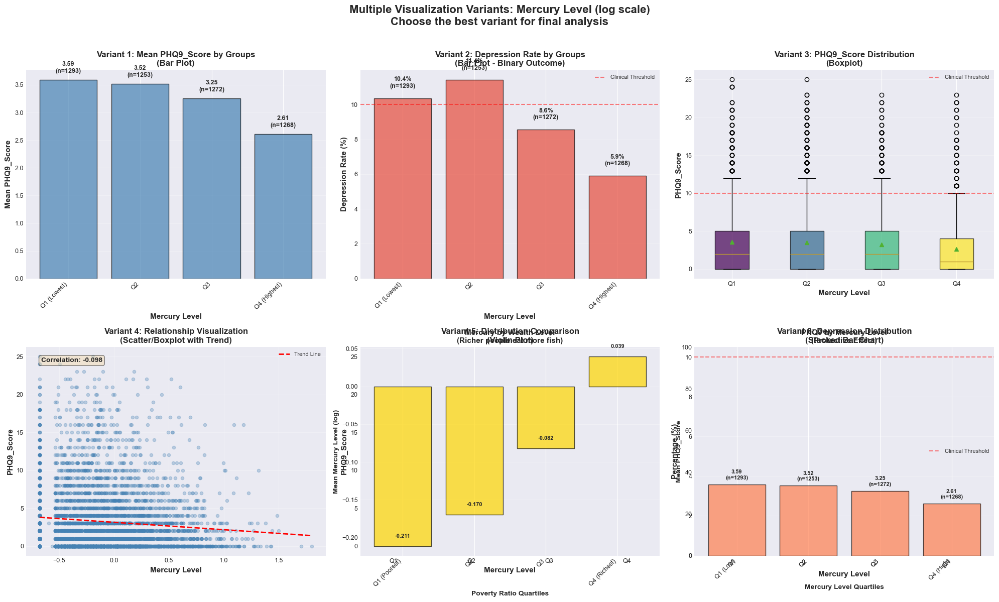


Creating variants for: Lead Level
  ✓ Saved: variants_Lead_Level.png


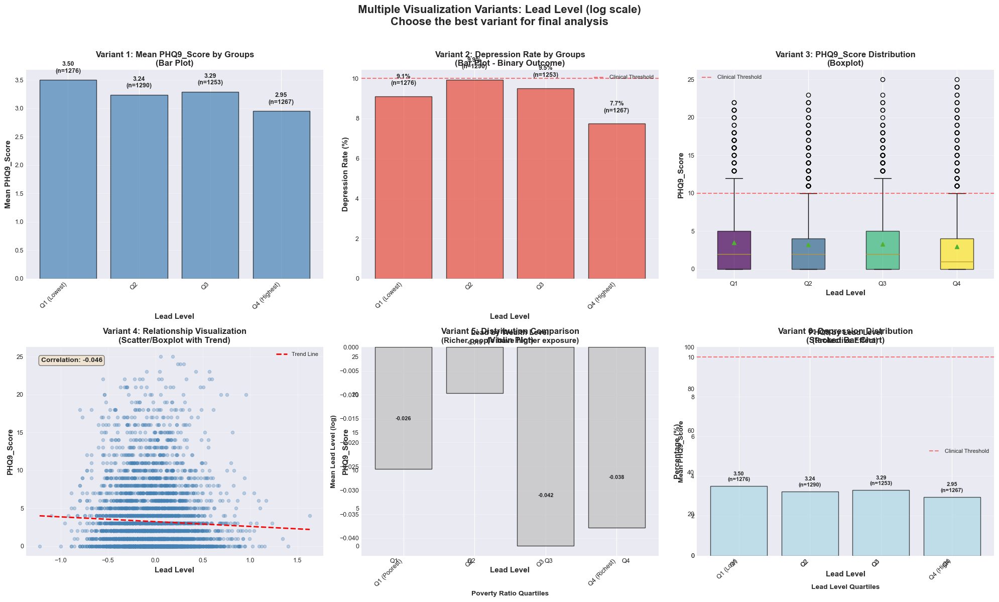


Creating variants for: Education Level
  ✓ Saved: variants_Education_Level.png


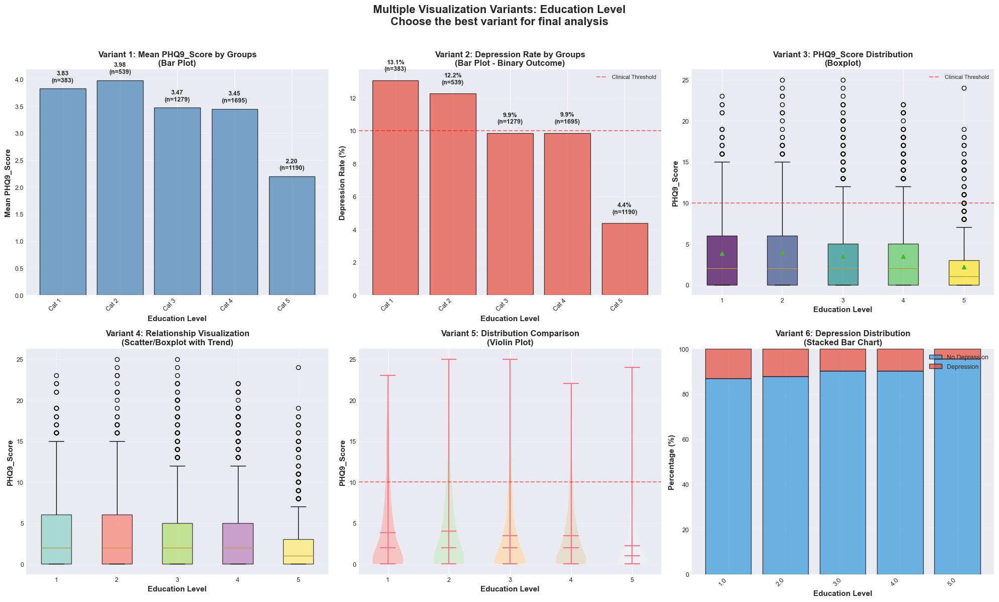


Creating variants for: Smoking Status
  ✓ Saved: variants_Smoking_Status.png


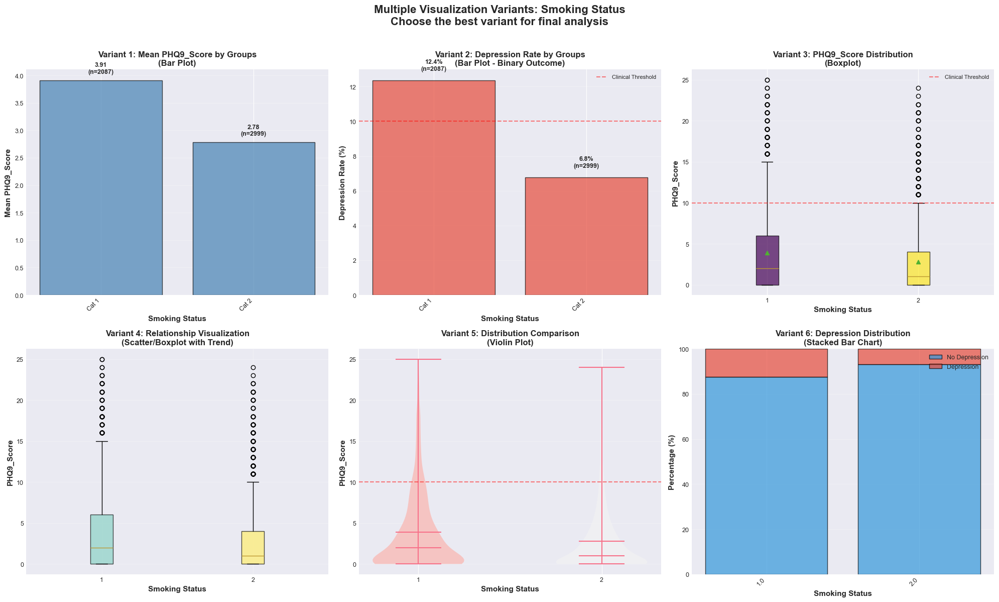


Creating variants for: Alcohol Consumption
  ✓ Saved: variants_Alcohol_Consumption.png


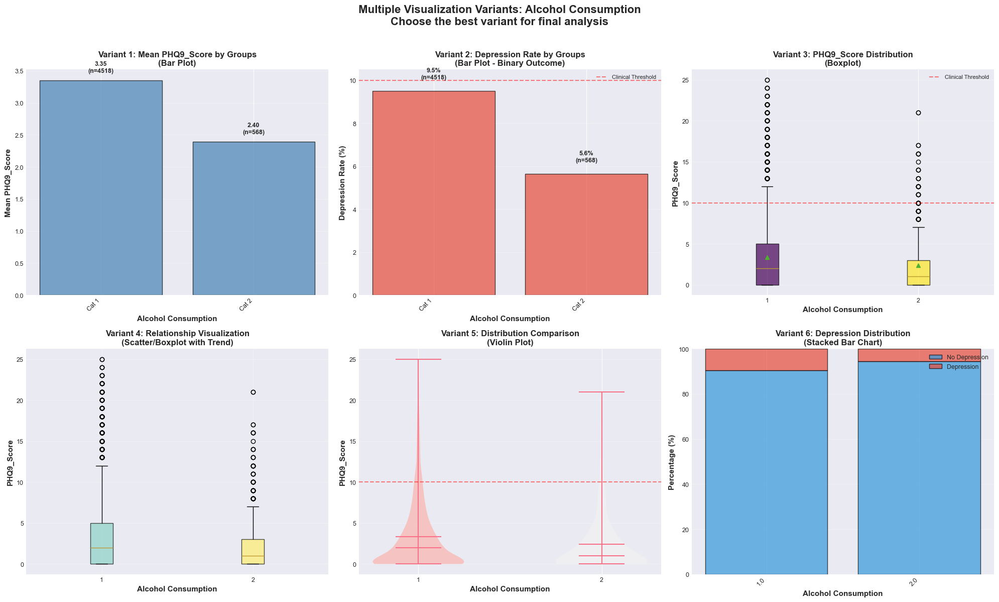


Creating variants for: Gender
  ✓ Saved: variants_Gender.png


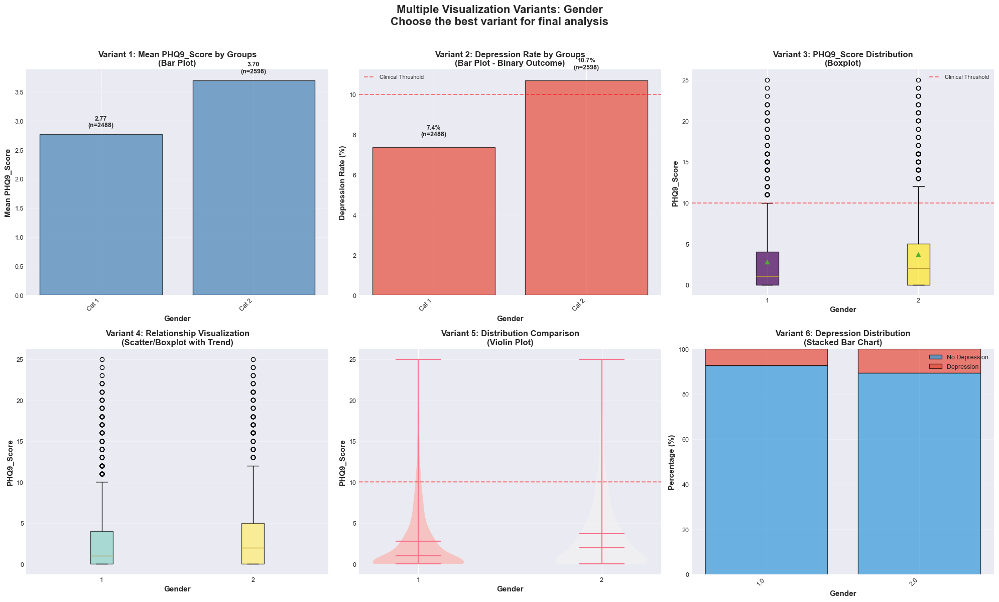


Creating variants for: Physical Activity
  ✓ Saved: variants_Physical_Activity.png


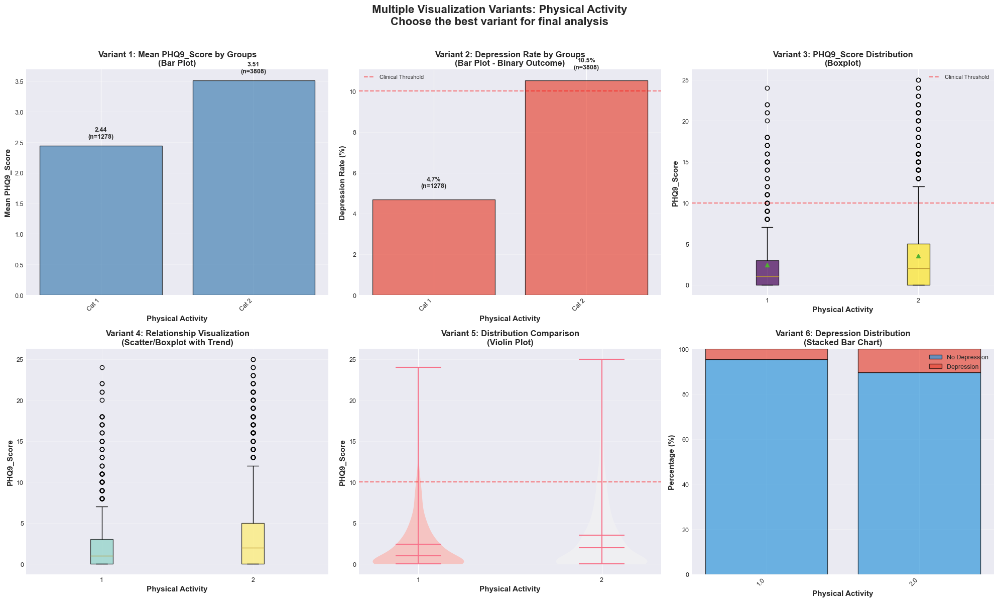


Creating variants for: Body Fat Percentage
  ✓ Saved: variants_Body_Fat_Percentage.png


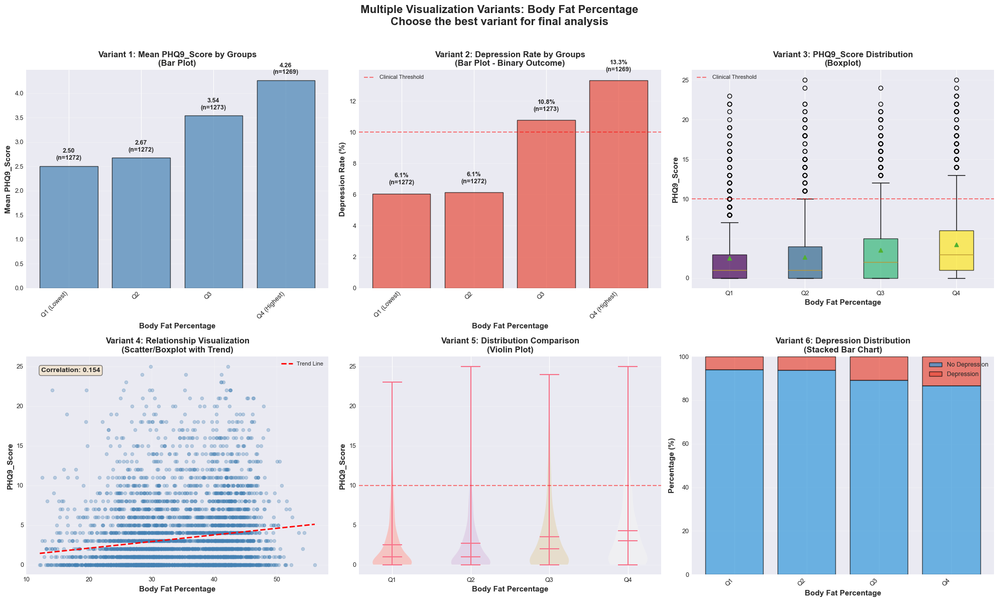


Creating variants for: Cadmium Level
  ✓ Saved: variants_Cadmium_Level.png


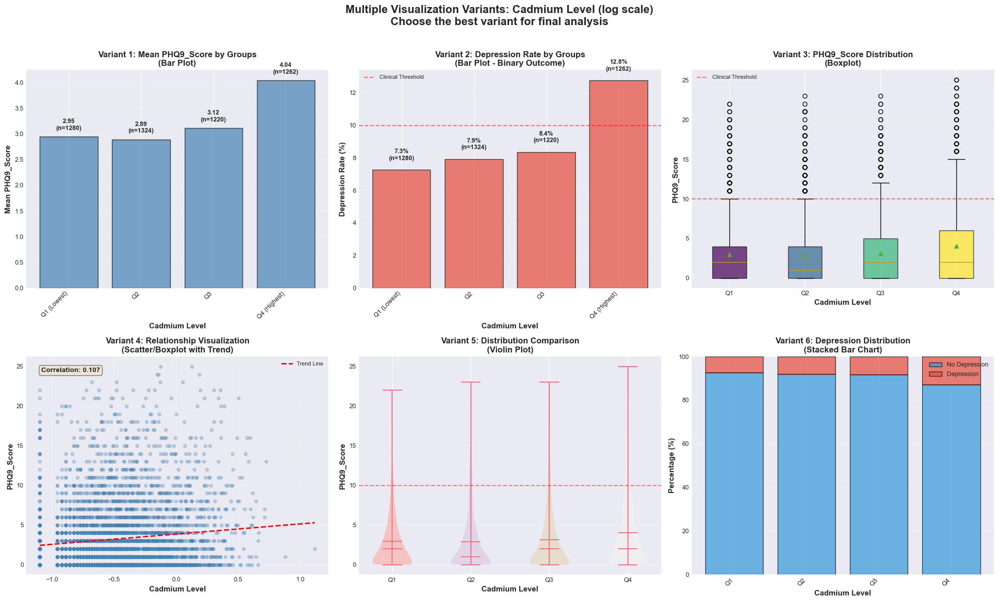


Creating variants for: C-Reactive Protein
  ✓ Saved: variants_C-Reactive_Protein.png


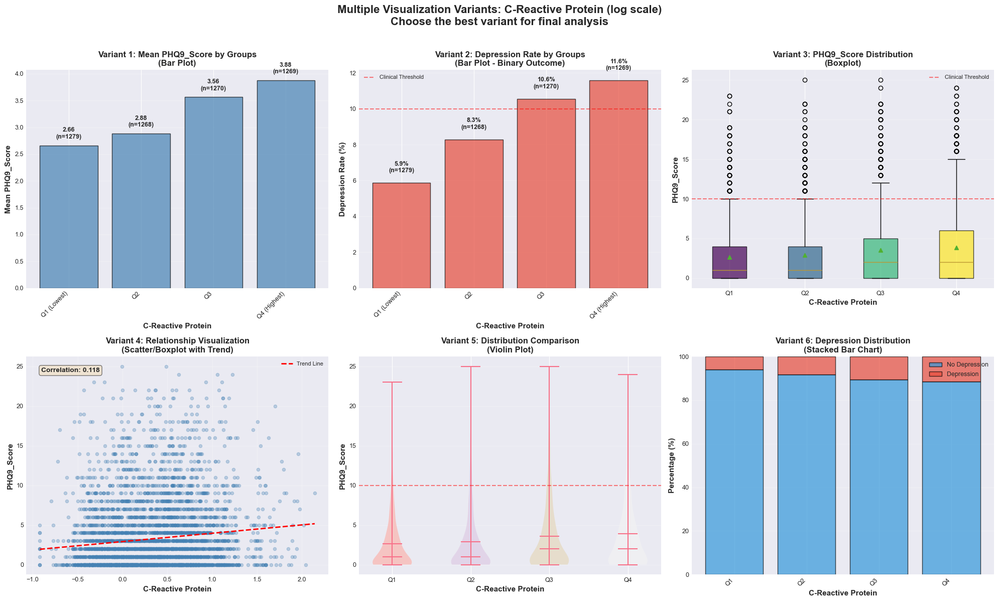


Processing 21 remaining features from Random Forest...

Creating variants for: UricAcid mgdL
  ✓ Saved: variants_UricAcid_mgdL.png


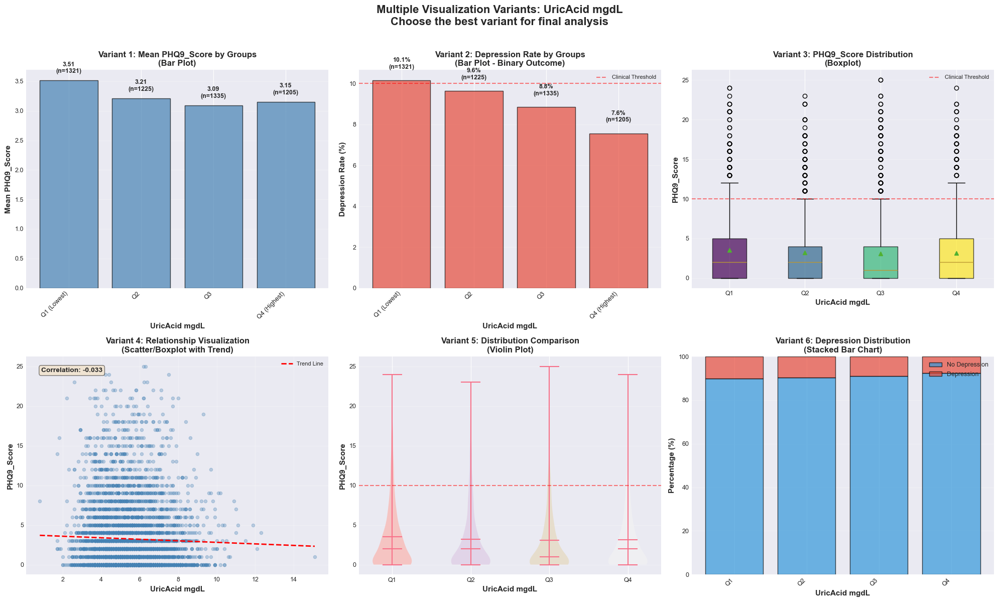


Creating variants for: Iron ugdL
  ✓ Saved: variants_Iron_ugdL.png


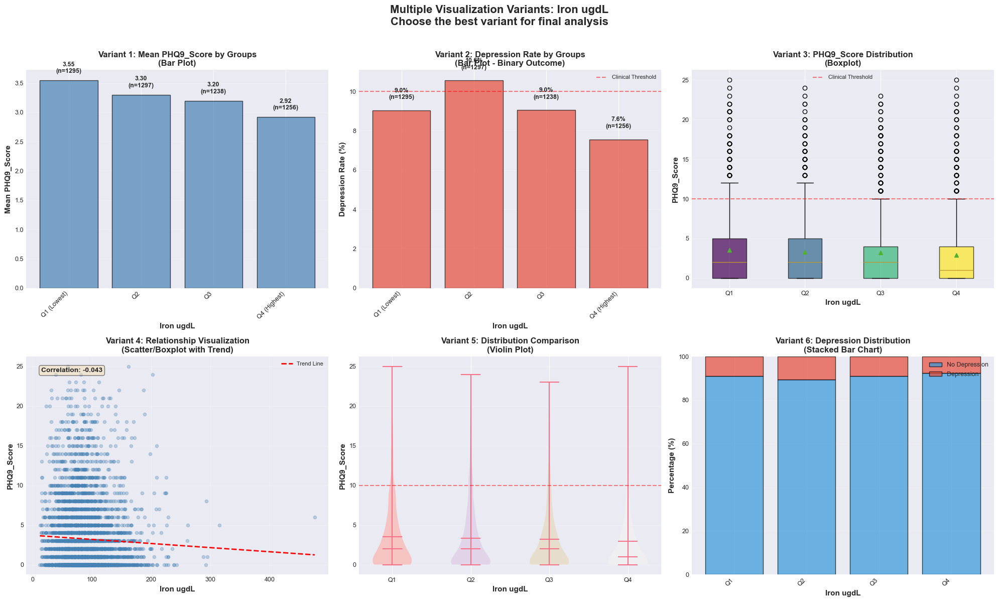


Creating variants for: Glucose mgdL
  ✓ Saved: variants_Glucose_mgdL.png


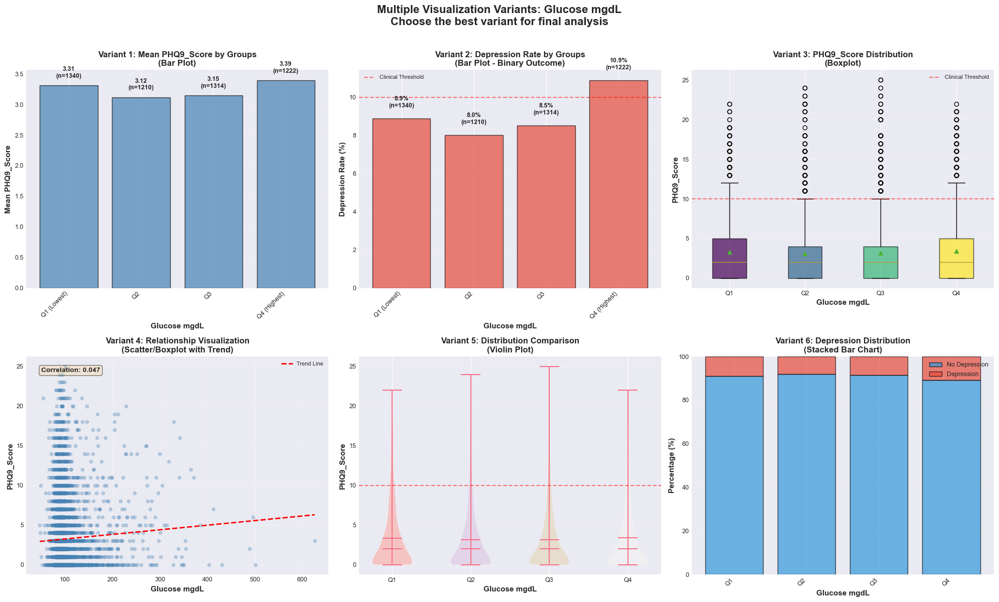


Creating variants for: Poverty Ratio
  ✓ Saved: variants_Poverty_Ratio.png


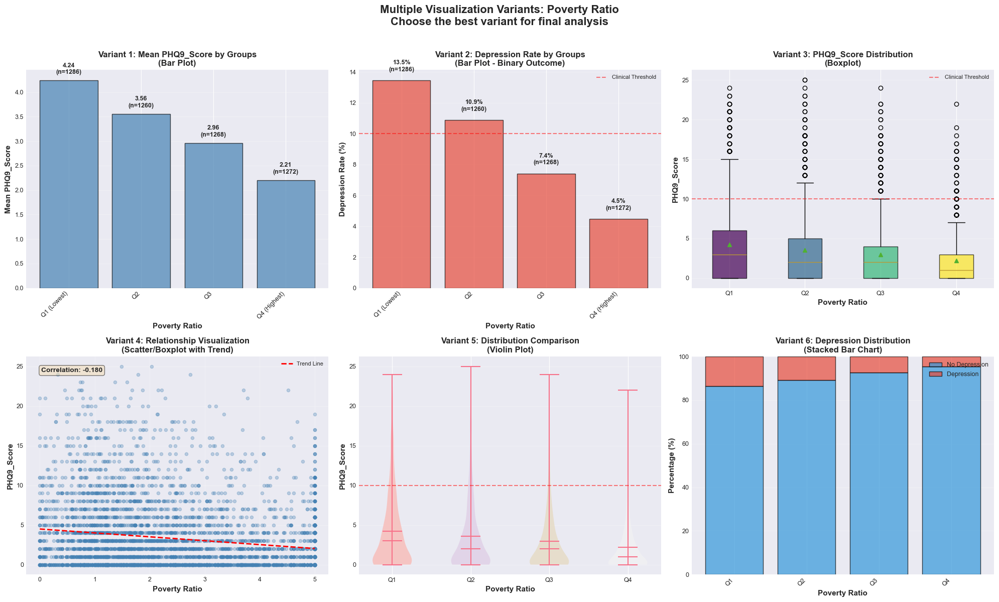


Creating variants for: Albumin Creatinine Ratio
  ✓ Saved: variants_Albumin_Creatinine_Ratio.png


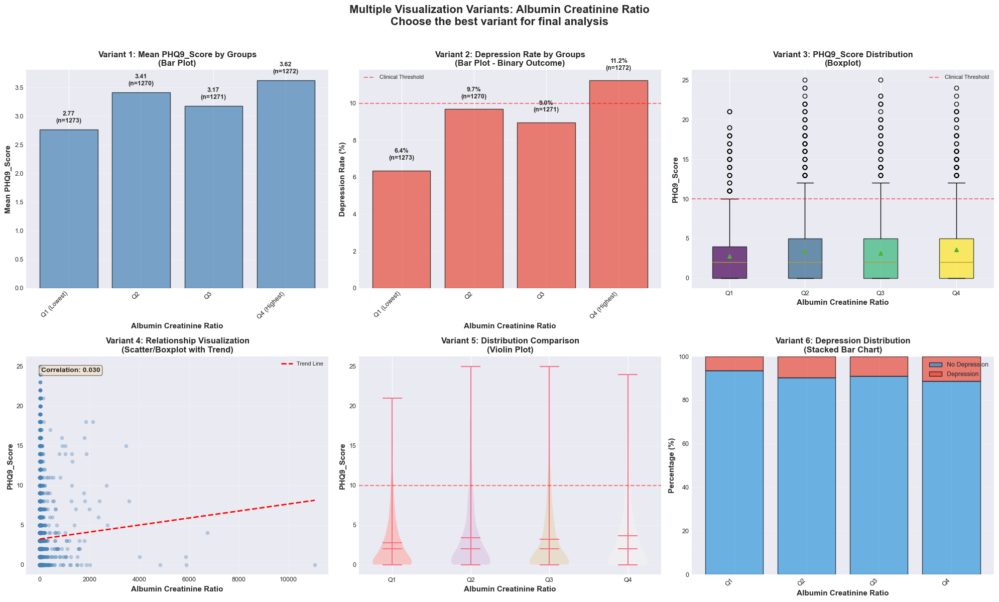


Creating variants for: Cholesterol Total mgdL
  ✓ Saved: variants_Cholesterol_Total_mgdL.png


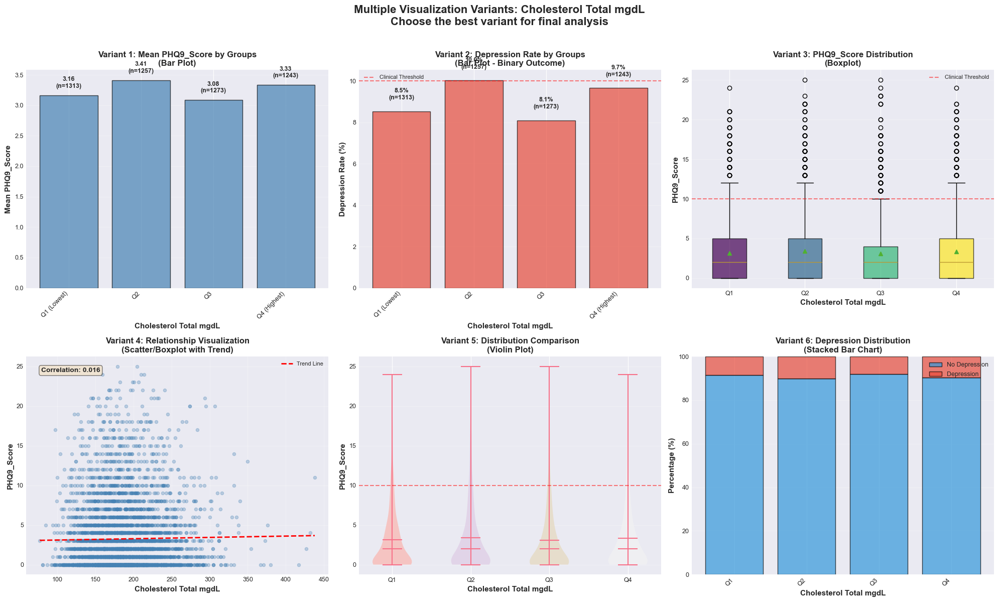


Creating variants for: Age
  ✓ Saved: variants_Age.png


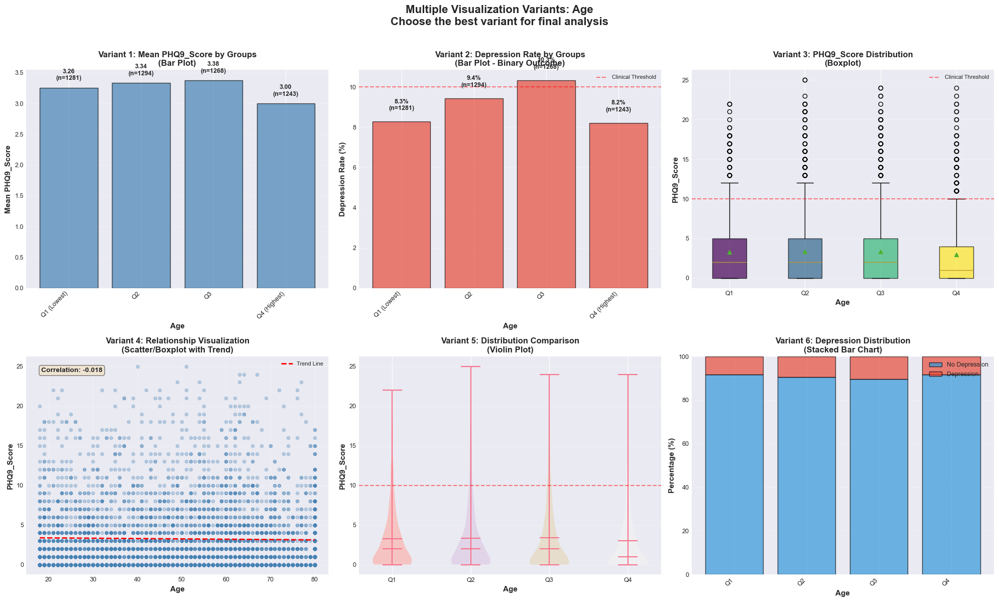


Creating variants for: BP Systolic
  ✓ Saved: variants_BP_Systolic.png


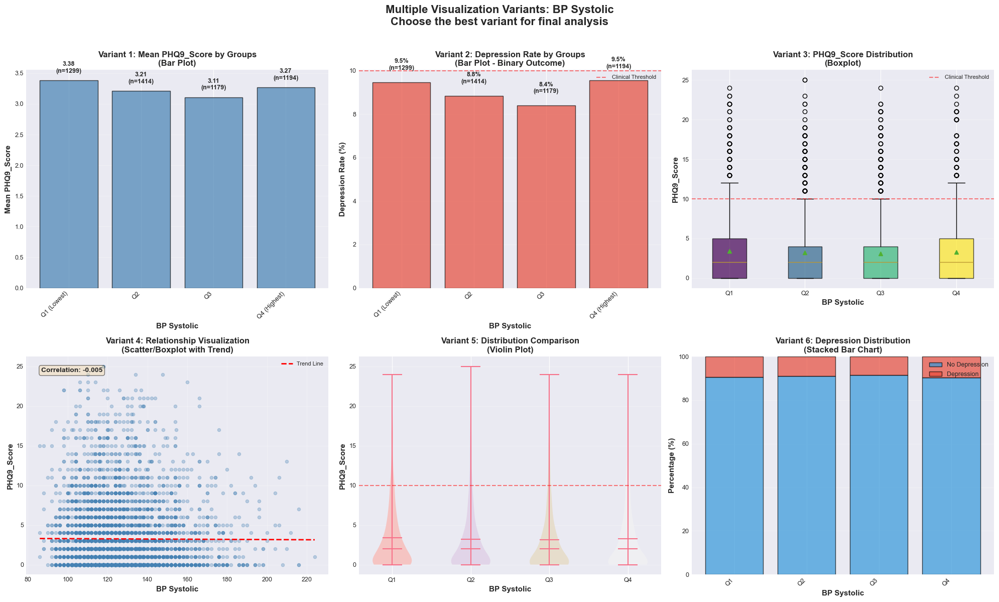


Creating variants for: Triglycerides mgdL
  ✓ Saved: variants_Triglycerides_mgdL.png


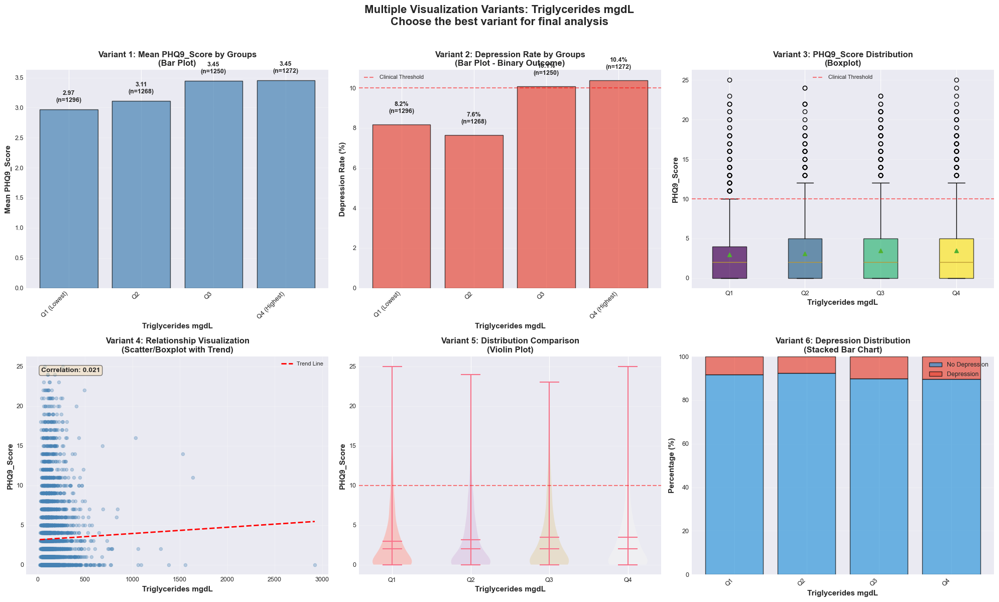


Creating variants for: Lean Mass g
  ✓ Saved: variants_Lean_Mass_g.png


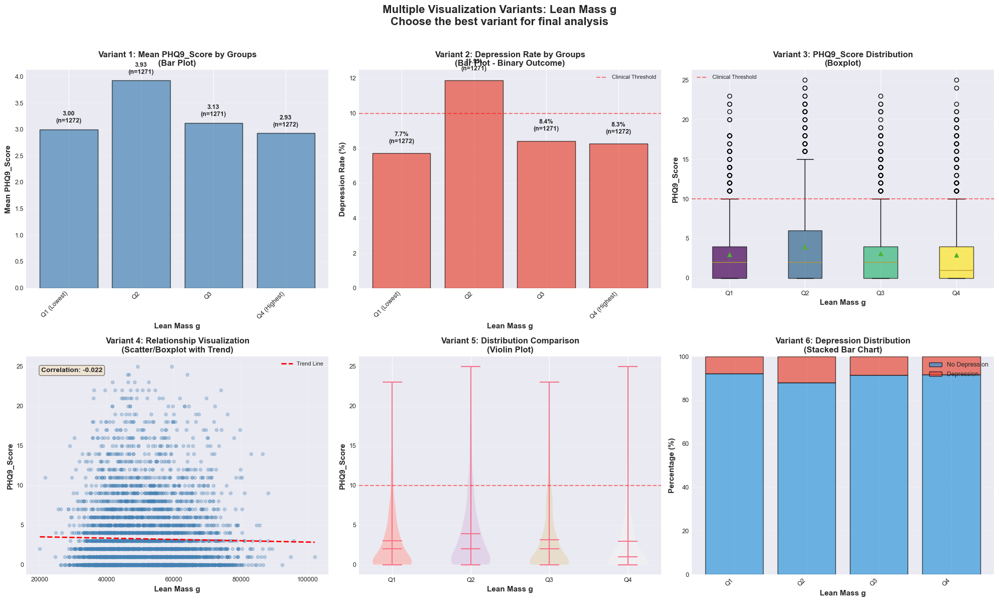


Creating variants for: Marital Status
  ✓ Saved: variants_Marital_Status.png


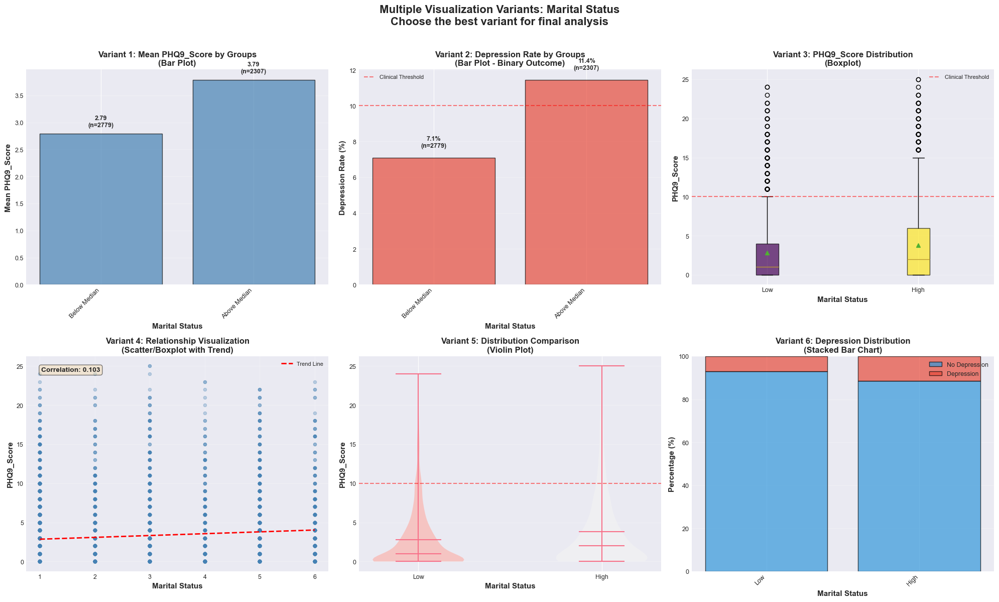


Creating variants for: VitaminD nmolL
  ✓ Saved: variants_VitaminD_nmolL.png


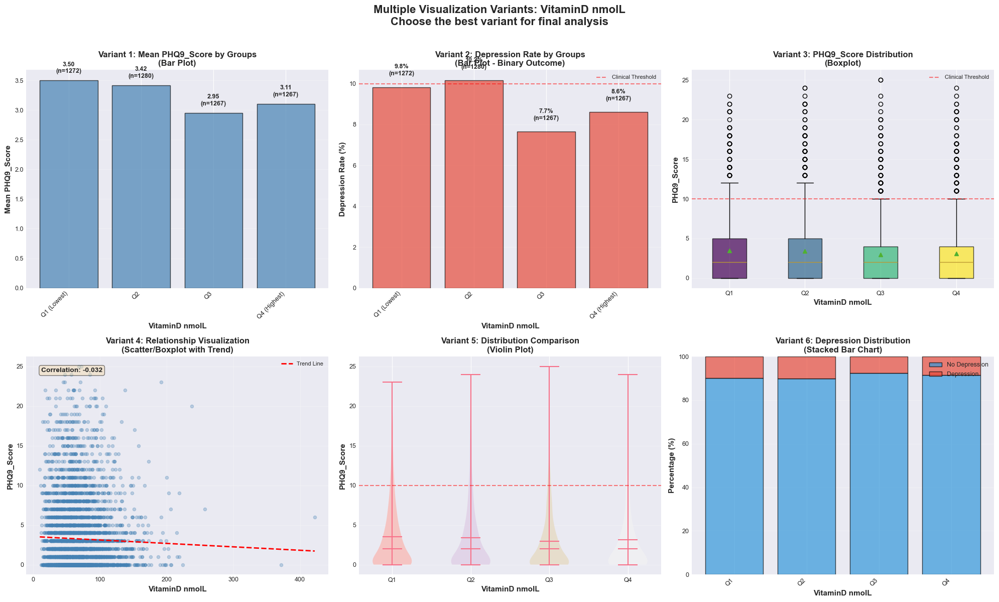


Creating variants for: Creatinine mgdL
  ✓ Saved: variants_Creatinine_mgdL.png


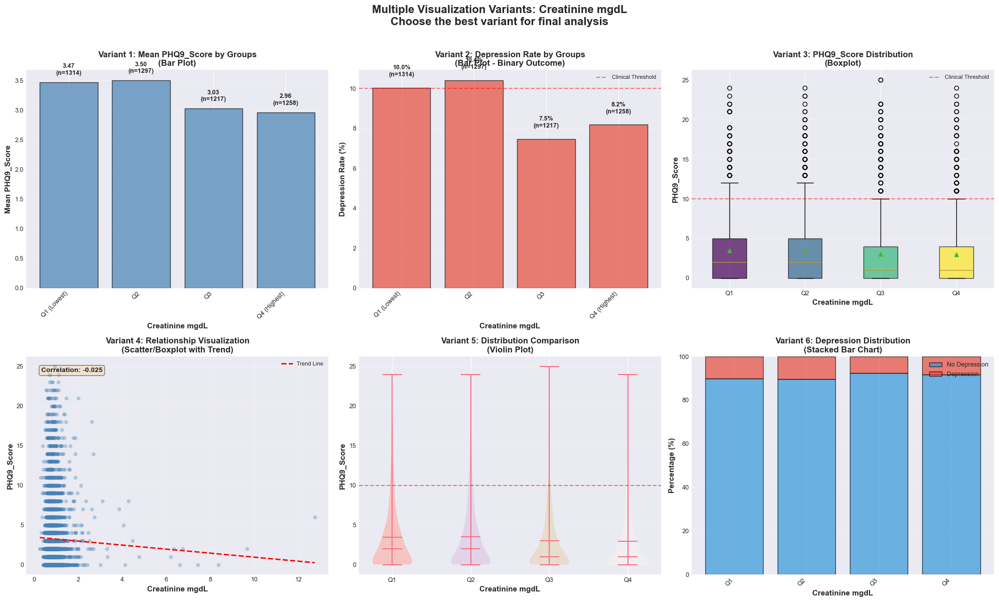


Creating variants for: BMI
  ✓ Saved: variants_BMI.png


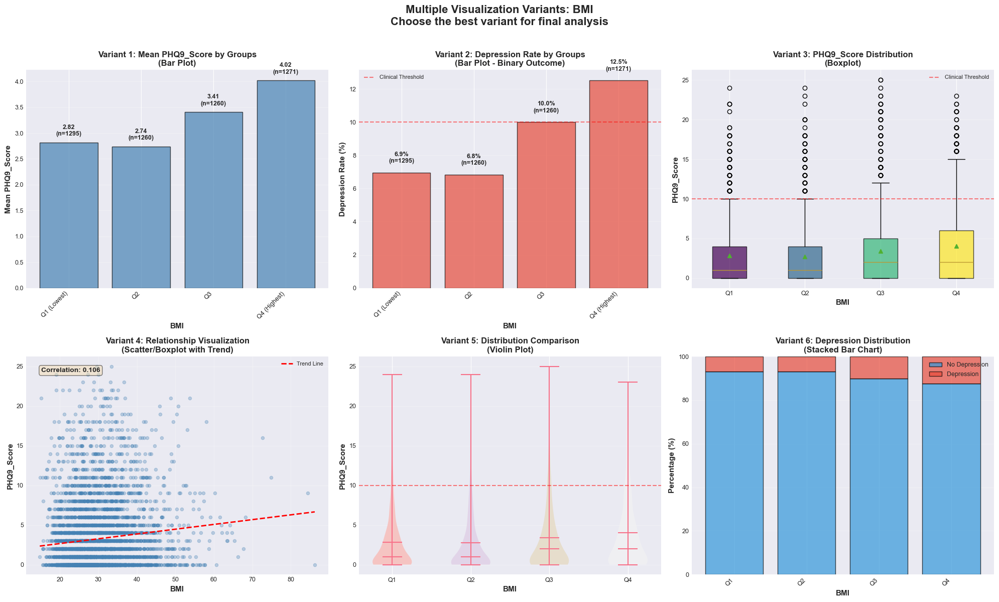


Creating variants for: Transferrin Sat Pct
  ✓ Saved: variants_Transferrin_Sat_Pct.png


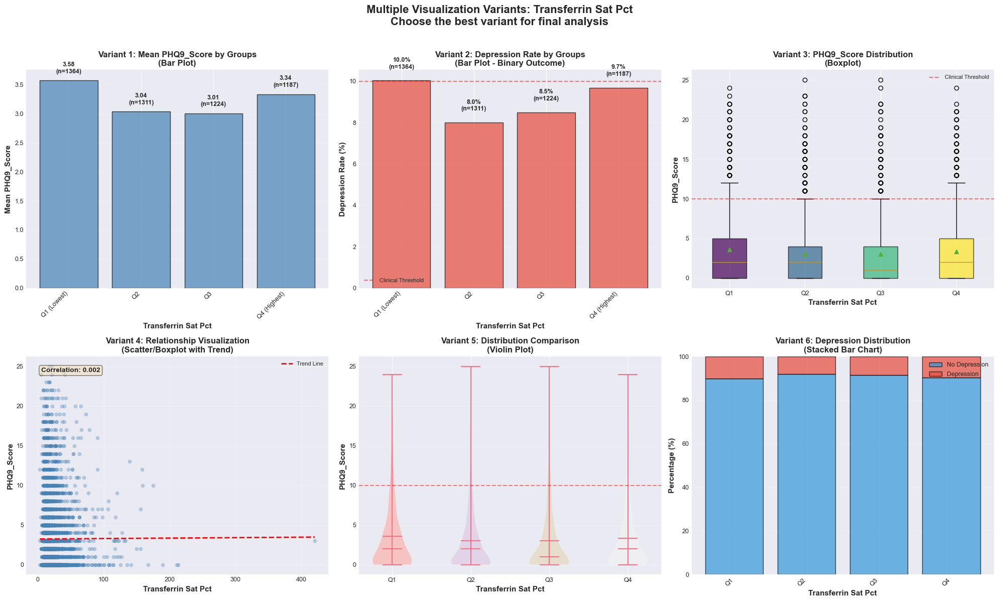


Creating variants for: Hemoglobin g dL
  ✓ Saved: variants_Hemoglobin_g_dL.png


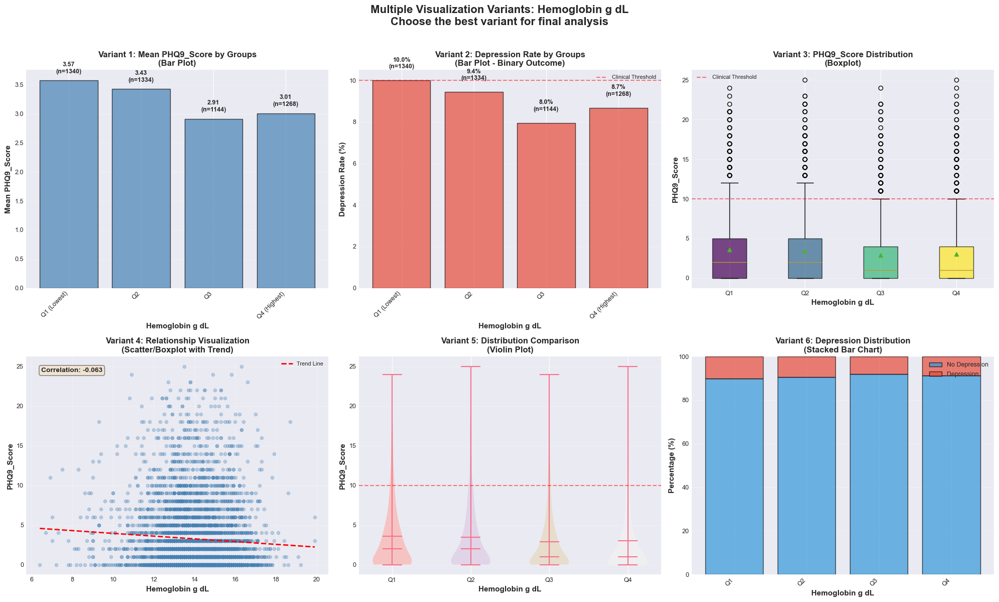


Creating variants for: Waist cm
  ✓ Saved: variants_Waist_cm.png


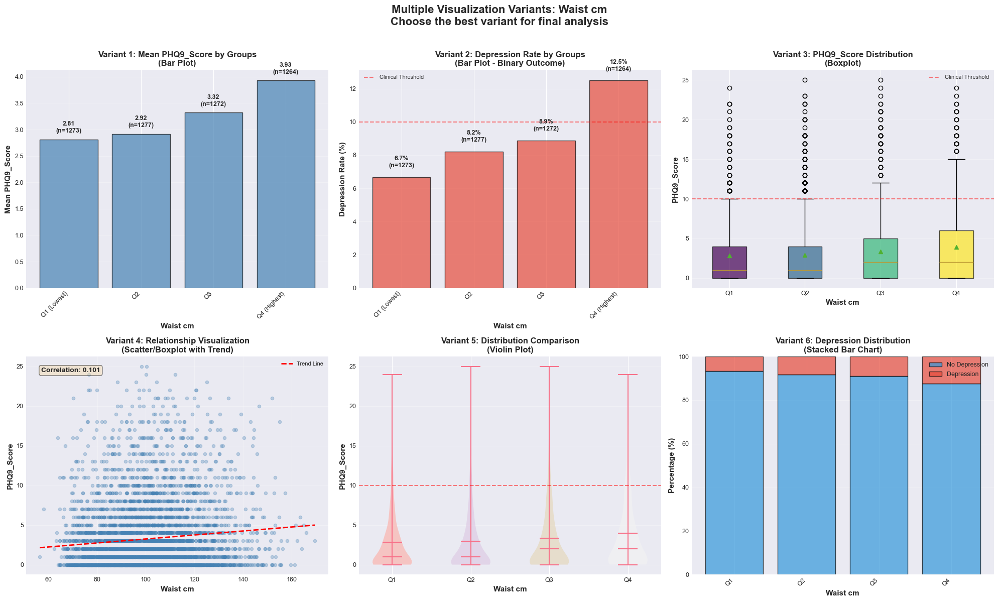


Creating variants for: WBC 1000cells
  ✓ Saved: variants_WBC_1000cells.png


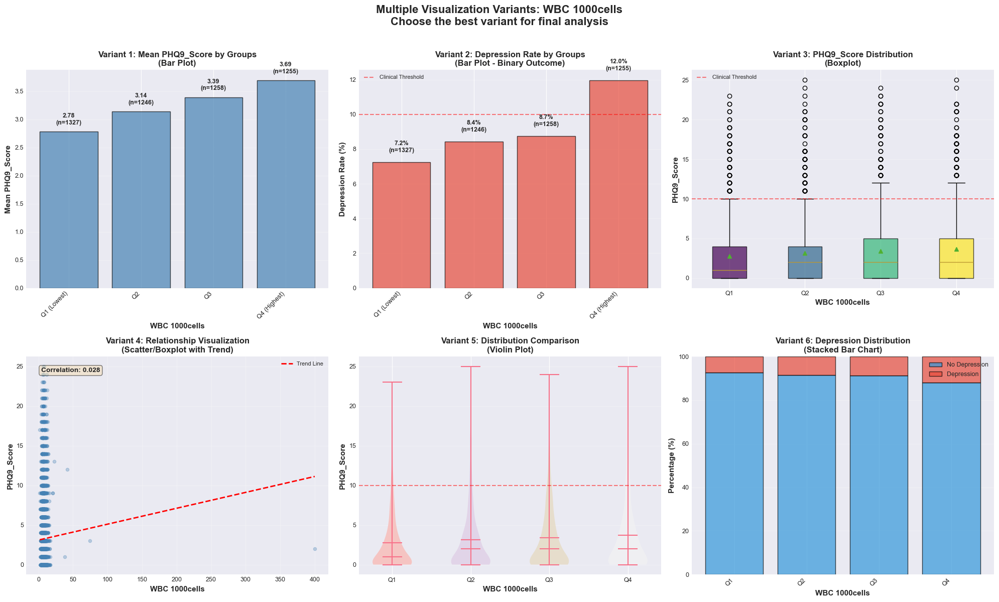


Creating variants for: BP Diastolic
  ✓ Saved: variants_BP_Diastolic.png


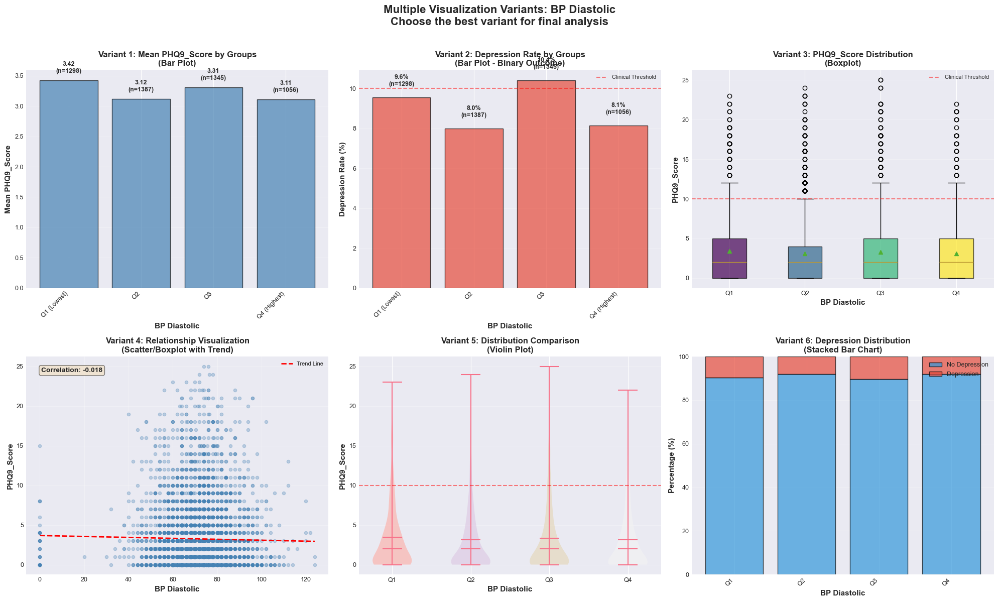


Creating variants for: Race
  ✓ Saved: variants_Race.png


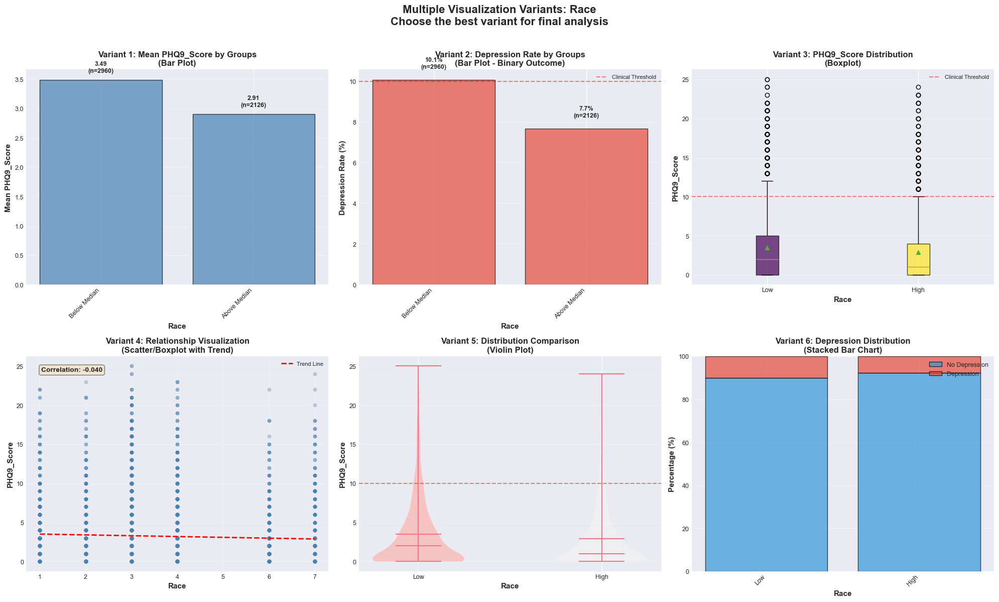


Creating variants for: is acute inflammation


ValueError: Bin edges must be unique: Index([0.0, 0.0, 1.0], dtype='float64').
You can drop duplicate edges by setting the 'duplicates' kwarg

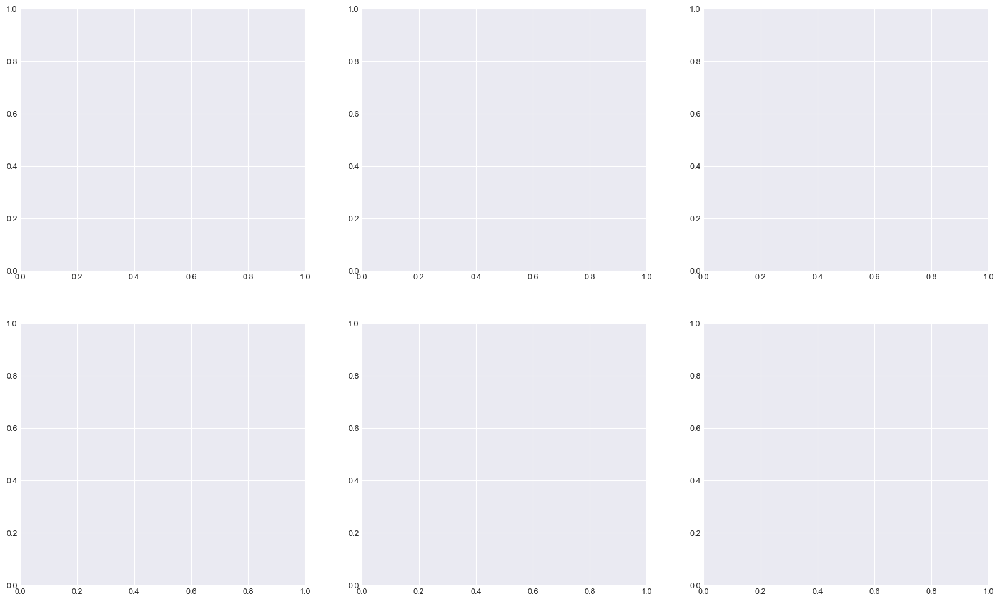

In [46]:
# Advanced EDA: Multiple Visualization Variants for Key Features
# Creating multiple plot variants to find the best visualization approach
print("=" * 60)
print("ADVANCED EDA: MULTIPLE VISUALIZATION VARIANTS")
print("=" * 60)

# Ensure plots directory exists
plots_dir = Path("plots")
plots_dir.mkdir(exist_ok=True)

# Prepare data
df_viz = df_processed.copy()


# Helper function to create multiple plot variants
def create_multiple_variants(
    feature_name,
    feature_col,
    title_base,
    is_numeric=True,
    is_log=False,
    special_analysis=None,
):
    """
    Create multiple visualization variants for a feature

    Parameters:
    - feature_name: Name for file saving
    - feature_col: Column name in dataframe
    - title_base: Base title for plots
    - is_numeric: Whether feature is numeric
    - is_log: Whether feature is log-transformed (for better labels)
    - special_analysis: Special analysis type (e.g., 'mercury_wealth', 'lead_wealth')
    """

    if feature_col not in df_viz.columns:
        print(f"\n⚠ {feature_name}: Column '{feature_col}' not found, skipping...")
        return

    # Filter data
    df_plot = df_viz[[feature_col, "PHQ9_Score", "Depression"]].dropna()

    if len(df_plot) == 0:
        print(f"\n⚠ {feature_name}: No valid data, skipping...")
        return

    print(f"\n{'=' * 60}")
    print(f"Creating variants for: {feature_name}")
    print(f"{'=' * 60}")

    # Determine number of subplots based on variants
    if special_analysis in ["mercury_wealth", "lead_wealth"]:
        # Special case: 2x3 grid for wealth analysis
        fig, axes = plt.subplots(2, 3, figsize=(20, 12))
        axes = axes.flatten()
    else:
        # Standard: 2x3 grid for 6 variants
        fig, axes = plt.subplots(2, 3, figsize=(20, 12))
        axes = axes.flatten()

    variant_idx = 0

    # ========================================================================
    # VARIANT 1: PHQ9_Score by Categories/Quartiles (Bar Plot)
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        # Split into quartiles
        try:
            quartiles = pd.qcut(
                df_plot[feature_col],
                q=4,
                labels=["Q1 (Lowest)", "Q2", "Q3", "Q4 (Highest)"],
                duplicates="drop",
            )
            group_means = df_plot.groupby(quartiles)["PHQ9_Score"].mean()
            group_counts = df_plot.groupby(quartiles)["PHQ9_Score"].count()
            x_labels = group_means.index.tolist()
        except:
            # If quartiles fail, use median split
            median_val = df_plot[feature_col].median()
            quartiles = pd.cut(
                df_plot[feature_col],
                bins=[
                    df_plot[feature_col].min(),
                    median_val,
                    df_plot[feature_col].max(),
                ],
                labels=["Below Median", "Above Median"],
                include_lowest=True,
            )
            group_means = df_plot.groupby(quartiles)["PHQ9_Score"].mean()
            group_counts = df_plot.groupby(quartiles)["PHQ9_Score"].count()
            x_labels = group_means.index.tolist()
    else:
        # Use categories directly
        group_means = df_plot.groupby(feature_col)["PHQ9_Score"].mean().sort_index()
        group_counts = df_plot.groupby(feature_col)["PHQ9_Score"].count()
        x_labels = [
            f"Cat {int(x)}" if isinstance(x, (int, float)) else str(x)
            for x in group_means.index
        ]

    bars = ax.bar(
        range(len(group_means)),
        group_means.values,
        color="steelblue",
        alpha=0.7,
        edgecolor="black",
    )

    # Add value labels
    for i, (bar, mean_val, count) in enumerate(
        zip(bars, group_means.values, group_counts.values)
    ):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.1,
            f"{mean_val:.2f}\n(n={count})",
            ha="center",
            va="bottom",
            fontsize=9,
            fontweight="bold",
        )

    ax.set_xticks(range(len(group_means)))
    ax.set_xticklabels(x_labels, rotation=45, ha="right")
    ax.set_ylabel("Mean PHQ9_Score", fontsize=11, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 1: Mean PHQ9_Score by Groups\n(Bar Plot)",
        fontsize=12,
        fontweight="bold",
    )
    ax.grid(axis="y", alpha=0.3)

    # ========================================================================
    # VARIANT 2: Depression Rate by Categories/Quartiles (Bar Plot)
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        try:
            quartiles = pd.qcut(
                df_plot[feature_col],
                q=4,
                labels=["Q1 (Lowest)", "Q2", "Q3", "Q4 (Highest)"],
                duplicates="drop",
            )
        except:
            median_val = df_plot[feature_col].median()
            quartiles = pd.cut(
                df_plot[feature_col],
                bins=[
                    df_plot[feature_col].min(),
                    median_val,
                    df_plot[feature_col].max(),
                ],
                labels=["Below Median", "Above Median"],
                include_lowest=True,
            )
    else:
        quartiles = df_plot[feature_col]

    # Calculate depression rate
    depression_rates = df_plot.groupby(quartiles)["Depression"].mean() * 100
    group_counts = df_plot.groupby(quartiles)["Depression"].count()

    bars = ax.bar(
        range(len(depression_rates)),
        depression_rates.values,
        color="#e74c3c",
        alpha=0.7,
        edgecolor="black",
    )

    # Add value labels
    for i, (bar, rate, count) in enumerate(
        zip(bars, depression_rates.values, group_counts.values)
    ):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.5,
            f"{rate:.1f}%\n(n={count})",
            ha="center",
            va="bottom",
            fontsize=9,
            fontweight="bold",
        )

    ax.set_xticks(range(len(depression_rates)))
    ax.set_xticklabels(x_labels, rotation=45, ha="right")
    ax.set_ylabel("Depression Rate (%)", fontsize=11, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 2: Depression Rate by Groups\n(Bar Plot - Binary Outcome)",
        fontsize=12,
        fontweight="bold",
    )
    ax.grid(axis="y", alpha=0.3)
    ax.axhline(y=10, color="red", linestyle="--", alpha=0.5, label="Clinical Threshold")
    ax.legend(fontsize=8)

    # ========================================================================
    # VARIANT 3: Boxplot - PHQ9_Score by Groups
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        try:
            quartiles = pd.qcut(
                df_plot[feature_col],
                q=4,
                labels=["Q1", "Q2", "Q3", "Q4"],
                duplicates="drop",
            )
            # Get unique categories
            unique_cats = quartiles.cat.categories
            box_data = [
                df_plot[quartiles == label]["PHQ9_Score"].values
                for label in unique_cats
                if label in quartiles.values
            ]
            labels = [str(x) for x in unique_cats if x in quartiles.values]
        except:
            median_val = df_plot[feature_col].median()
            quartiles = pd.cut(
                df_plot[feature_col],
                bins=[
                    df_plot[feature_col].min(),
                    median_val,
                    df_plot[feature_col].max(),
                ],
                labels=["Low", "High"],
                include_lowest=True,
            )
            unique_cats = quartiles.cat.categories
            box_data = [
                df_plot[quartiles == label]["PHQ9_Score"].values
                for label in unique_cats
                if label in quartiles.values
            ]
            labels = [str(x) for x in unique_cats if x in quartiles.values]
    else:
        # For categorical variables, use unique values directly
        unique_cats = sorted(df_plot[feature_col].unique())
        box_data = [
            df_plot[df_plot[feature_col] == label]["PHQ9_Score"].values
            for label in unique_cats
        ]
        labels = [
            str(int(x)) if isinstance(x, (int, float)) else str(x) for x in unique_cats
        ]

    bp = ax.boxplot(
        box_data,
        labels=labels,
        patch_artist=True,
        showmeans=True,
    )

    colors_box = plt.cm.viridis(np.linspace(0, 1, len(bp["boxes"])))
    for patch, color in zip(bp["boxes"], colors_box):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    ax.set_ylabel("PHQ9_Score", fontsize=11, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 3: PHQ9_Score Distribution\n(Boxplot)", fontsize=12, fontweight="bold"
    )
    ax.grid(axis="y", alpha=0.3)
    ax.axhline(y=10, color="red", linestyle="--", alpha=0.5, label="Clinical Threshold")
    ax.legend(fontsize=8)

    # ========================================================================
    # VARIANT 4: Scatter Plot with Trend Line
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        ax.scatter(
            df_plot[feature_col],
            df_plot["PHQ9_Score"],
            alpha=0.3,
            s=20,
            color="steelblue",
        )

        # Add trend line
        z = np.polyfit(
            df_plot[feature_col].dropna(),
            df_plot.loc[df_plot[feature_col].notna(), "PHQ9_Score"],
            1,
        )
        p = np.poly1d(z)
        x_trend = np.linspace(
            df_plot[feature_col].min(), df_plot[feature_col].max(), 100
        )
        ax.plot(x_trend, p(x_trend), "r--", linewidth=2, label="Trend Line")

        # Calculate correlation
        corr = df_plot[[feature_col, "PHQ9_Score"]].corr().iloc[0, 1]
        ax.text(
            0.05,
            0.95,
            f"Correlation: {corr:.3f}",
            transform=ax.transAxes,
            fontsize=10,
            fontweight="bold",
            verticalalignment="top",
            bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5),
        )
    else:
        # For categorical, show as boxplot
        categories = sorted(df_plot[feature_col].unique())
        box_data = [
            df_plot[df_plot[feature_col] == cat]["PHQ9_Score"].values
            for cat in categories
        ]
        bp = ax.boxplot(
            box_data, labels=[str(int(c)) for c in categories], patch_artist=True
        )
        colors_box = plt.cm.Set3(np.linspace(0, 1, len(bp["boxes"])))
        for patch, color in zip(bp["boxes"], colors_box):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)

    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_ylabel("PHQ9_Score", fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 4: Relationship Visualization\n(Scatter/Boxplot with Trend)",
        fontsize=12,
        fontweight="bold",
    )
    ax.grid(alpha=0.3)
    if is_numeric:
        ax.legend(fontsize=8)

    # ========================================================================
    # VARIANT 5: Violin Plot - Distribution Comparison
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        try:
            quartiles = pd.qcut(
                df_plot[feature_col],
                q=4,
                labels=["Q1", "Q2", "Q3", "Q4"],
                duplicates="drop",
            )
            unique_cats = quartiles.cat.categories
            violin_data = [
                df_plot[quartiles == label]["PHQ9_Score"].values
                for label in unique_cats
                if label in quartiles.values
            ]
            violin_labels = [str(x) for x in unique_cats if x in quartiles.values]
        except:
            median_val = df_plot[feature_col].median()
            quartiles = pd.cut(
                df_plot[feature_col],
                bins=[
                    df_plot[feature_col].min(),
                    median_val,
                    df_plot[feature_col].max(),
                ],
                labels=["Low", "High"],
                include_lowest=True,
            )
            unique_cats = quartiles.cat.categories
            violin_data = [
                df_plot[quartiles == label]["PHQ9_Score"].values
                for label in unique_cats
                if label in quartiles.values
            ]
            violin_labels = [str(x) for x in unique_cats if x in quartiles.values]
    else:
        # For categorical variables, use unique values directly
        unique_cats = sorted(df_plot[feature_col].unique())
        violin_data = [
            df_plot[df_plot[feature_col] == label]["PHQ9_Score"].values
            for label in unique_cats
        ]
        violin_labels = [
            str(int(x)) if isinstance(x, (int, float)) else str(x) for x in unique_cats
        ]

    parts = ax.violinplot(
        violin_data, positions=range(len(violin_data)), showmeans=True, showmedians=True
    )

    # Color violins
    for pc, color in zip(
        parts["bodies"], plt.cm.Pastel1(np.linspace(0, 1, len(violin_data)))
    ):
        pc.set_facecolor(color)
        pc.set_alpha(0.7)

    ax.set_xticks(range(len(violin_labels)))
    ax.set_xticklabels(violin_labels)
    ax.set_ylabel("PHQ9_Score", fontsize=11, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 5: Distribution Comparison\n(Violin Plot)",
        fontsize=12,
        fontweight="bold",
    )
    ax.grid(axis="y", alpha=0.3)
    ax.axhline(y=10, color="red", linestyle="--", alpha=0.5)

    # ========================================================================
    # VARIANT 6: Stacked Bar - Depression vs No Depression
    # ========================================================================
    ax = axes[variant_idx]
    variant_idx += 1

    if is_numeric:
        try:
            quartiles = pd.qcut(
                df_plot[feature_col],
                q=4,
                labels=["Q1", "Q2", "Q3", "Q4"],
                duplicates="drop",
            )
        except:
            median_val = df_plot[feature_col].median()
            quartiles = pd.cut(
                df_plot[feature_col],
                bins=[
                    df_plot[feature_col].min(),
                    median_val,
                    df_plot[feature_col].max(),
                ],
                labels=["Low", "High"],
                include_lowest=True,
            )
    else:
        # For categorical, convert to categorical type for grouping
        quartiles = pd.Categorical(df_plot[feature_col])

    # Count depression vs no depression by group
    depression_by_group = (
        df_plot.groupby([quartiles, "Depression"]).size().unstack(fill_value=0)
    )
    if 0.0 in depression_by_group.columns and 1.0 in depression_by_group.columns:
        depression_by_group = depression_by_group[[0.0, 1.0]]
        depression_by_group.columns = ["No Depression", "Depression"]
    elif 0.0 in depression_by_group.columns:
        depression_by_group = pd.DataFrame(
            {
                "No Depression": depression_by_group[0.0],
                "Depression": [0] * len(depression_by_group),
            }
        )
    elif 1.0 in depression_by_group.columns:
        depression_by_group = pd.DataFrame(
            {
                "No Depression": [0] * len(depression_by_group),
                "Depression": depression_by_group[1.0],
            }
        )
    else:
        depression_by_group = pd.DataFrame(
            {
                "No Depression": [0] * len(depression_by_group),
                "Depression": [0] * len(depression_by_group),
            }
        )

    # Calculate percentages
    depression_pct = (
        depression_by_group.div(depression_by_group.sum(axis=1), axis=0) * 100
    )

    # Stacked bar
    bottom = np.zeros(len(depression_pct))
    colors_stack = ["#3498db", "#e74c3c"]
    for i, col in enumerate(["No Depression", "Depression"]):
        if col in depression_pct.columns:
            ax.bar(
                range(len(depression_pct)),
                depression_pct[col].values,
                bottom=bottom,
                label=col,
                color=colors_stack[i],
                alpha=0.7,
                edgecolor="black",
            )
            bottom += depression_pct[col].values

    ax.set_xticks(range(len(depression_pct)))
    ax.set_xticklabels([str(x) for x in depression_pct.index], rotation=45, ha="right")
    ax.set_ylabel("Percentage (%)", fontsize=11, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=11, fontweight="bold")
    ax.set_title(
        "Variant 6: Depression Distribution\n(Stacked Bar Chart)",
        fontsize=12,
        fontweight="bold",
    )
    ax.legend(loc="upper right", fontsize=9)
    ax.grid(axis="y", alpha=0.3)
    ax.set_ylim(0, 100)

    # Special analysis for Mercury and Lead (wealth connection)
    if special_analysis == "mercury_wealth":
        # Remove unused subplots (we only used 4, need 2 more for wealth analysis)
        # We already used axes 0-3 (variants 1-4), so remove axes 4-5 if they exist
        if variant_idx < len(axes):
            for idx in range(variant_idx, len(axes)):
                try:
                    axes[idx].remove()
                except:
                    pass

        # Add wealth analysis subplots at positions 5 and 6 (1-indexed: 5, 6)
        ax_wealth1 = fig.add_subplot(2, 3, 5)
        df_mercury_wealth = df_viz[
            ["Log_Mercury", "Poverty_Ratio", "PHQ9_Score"]
        ].dropna()
        if len(df_mercury_wealth) > 0:
            # Split by poverty quartiles
            try:
                poverty_quartiles = pd.qcut(
                    df_mercury_wealth["Poverty_Ratio"],
                    q=4,
                    labels=["Q1 (Poorest)", "Q2", "Q3", "Q4 (Richest)"],
                    duplicates="drop",
                )
                mercury_by_wealth = df_mercury_wealth.groupby(poverty_quartiles)[
                    "Log_Mercury"
                ].mean()

                bars = ax_wealth1.bar(
                    range(len(mercury_by_wealth)),
                    mercury_by_wealth.values,
                    color="gold",
                    alpha=0.7,
                    edgecolor="black",
                )
                ax_wealth1.set_xticks(range(len(mercury_by_wealth)))
                ax_wealth1.set_xticklabels(
                    mercury_by_wealth.index, rotation=45, ha="right"
                )
                ax_wealth1.set_ylabel(
                    "Mean Mercury Level (log)", fontsize=10, fontweight="bold"
                )
                ax_wealth1.set_xlabel(
                    "Poverty Ratio Quartiles", fontsize=10, fontweight="bold"
                )
                ax_wealth1.set_title(
                    "Mercury by Wealth Level\n(Richer people eat more fish)",
                    fontsize=11,
                    fontweight="bold",
                )
                ax_wealth1.grid(axis="y", alpha=0.3)

                # Add value labels
                for i, (bar, val) in enumerate(zip(bars, mercury_by_wealth.values)):
                    ax_wealth1.text(
                        bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.01,
                        f"{val:.3f}",
                        ha="center",
                        va="bottom",
                        fontsize=8,
                        fontweight="bold",
                    )
            except Exception as e:
                ax_wealth1.text(
                    0.5,
                    0.5,
                    f"Error: {str(e)}",
                    ha="center",
                    va="center",
                    transform=ax_wealth1.transAxes,
                )

        # Subplot for PHQ9 by Mercury quartiles
        ax_wealth2 = fig.add_subplot(2, 3, 6)
        if len(df_mercury_wealth) > 0:
            try:
                mercury_q = pd.qcut(
                    df_mercury_wealth["Log_Mercury"],
                    q=4,
                    labels=["Q1 (Low)", "Q2", "Q3", "Q4 (High)"],
                    duplicates="drop",
                )
                phq9_by_mercury = df_mercury_wealth.groupby(mercury_q)[
                    "PHQ9_Score"
                ].mean()
                counts_by_mercury = df_mercury_wealth.groupby(mercury_q)[
                    "PHQ9_Score"
                ].count()

                bars = ax_wealth2.bar(
                    range(len(phq9_by_mercury)),
                    phq9_by_mercury.values,
                    color="coral",
                    alpha=0.7,
                    edgecolor="black",
                )
                ax_wealth2.set_xticks(range(len(phq9_by_mercury)))
                ax_wealth2.set_xticklabels(
                    phq9_by_mercury.index, rotation=45, ha="right"
                )
                ax_wealth2.set_ylabel("Mean PHQ9_Score", fontsize=10, fontweight="bold")
                ax_wealth2.set_xlabel(
                    "Mercury Level Quartiles", fontsize=10, fontweight="bold"
                )
                ax_wealth2.set_title(
                    "PHQ9 by Mercury Level\n(Protective Effect)",
                    fontsize=11,
                    fontweight="bold",
                )
                ax_wealth2.grid(axis="y", alpha=0.3)
                ax_wealth2.axhline(
                    y=10,
                    color="red",
                    linestyle="--",
                    alpha=0.5,
                    label="Clinical Threshold",
                )
                ax_wealth2.legend(fontsize=8)

                # Add value labels
                for i, (bar, mean_val, count) in enumerate(
                    zip(bars, phq9_by_mercury.values, counts_by_mercury.values)
                ):
                    ax_wealth2.text(
                        bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.2,
                        f"{mean_val:.2f}\n(n={count})",
                        ha="center",
                        va="bottom",
                        fontsize=8,
                        fontweight="bold",
                    )
            except Exception as e:
                ax_wealth2.text(
                    0.5,
                    0.5,
                    f"Error: {str(e)}",
                    ha="center",
                    va="center",
                    transform=ax_wealth2.transAxes,
                )

    elif special_analysis == "lead_wealth":
        # Similar analysis for Lead
        if variant_idx < len(axes):
            for idx in range(variant_idx, len(axes)):
                try:
                    axes[idx].remove()
                except:
                    pass

        ax_wealth1 = fig.add_subplot(2, 3, 5)
        df_lead_wealth = df_viz[["Log_Lead", "Poverty_Ratio", "PHQ9_Score"]].dropna()
        if len(df_lead_wealth) > 0:
            try:
                poverty_quartiles = pd.qcut(
                    df_lead_wealth["Poverty_Ratio"],
                    q=4,
                    labels=["Q1 (Poorest)", "Q2", "Q3", "Q4 (Richest)"],
                    duplicates="drop",
                )
                lead_by_wealth = df_lead_wealth.groupby(poverty_quartiles)[
                    "Log_Lead"
                ].mean()

                bars = ax_wealth1.bar(
                    range(len(lead_by_wealth)),
                    lead_by_wealth.values,
                    color="silver",
                    alpha=0.7,
                    edgecolor="black",
                )
                ax_wealth1.set_xticks(range(len(lead_by_wealth)))
                ax_wealth1.set_xticklabels(
                    lead_by_wealth.index, rotation=45, ha="right"
                )
                ax_wealth1.set_ylabel(
                    "Mean Lead Level (log)", fontsize=10, fontweight="bold"
                )
                ax_wealth1.set_xlabel(
                    "Poverty Ratio Quartiles", fontsize=10, fontweight="bold"
                )
                ax_wealth1.set_title(
                    "Lead by Wealth Level\n(Richer people have higher exposure)",
                    fontsize=11,
                    fontweight="bold",
                )
                ax_wealth1.grid(axis="y", alpha=0.3)

                # Add value labels
                for i, (bar, val) in enumerate(zip(bars, lead_by_wealth.values)):
                    ax_wealth1.text(
                        bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.01,
                        f"{val:.3f}",
                        ha="center",
                        va="bottom",
                        fontsize=8,
                        fontweight="bold",
                    )
            except Exception as e:
                ax_wealth1.text(
                    0.5,
                    0.5,
                    f"Error: {str(e)}",
                    ha="center",
                    va="center",
                    transform=ax_wealth1.transAxes,
                )

        ax_wealth2 = fig.add_subplot(2, 3, 6)
        if len(df_lead_wealth) > 0:
            try:
                lead_q = pd.qcut(
                    df_lead_wealth["Log_Lead"],
                    q=4,
                    labels=["Q1 (Low)", "Q2", "Q3", "Q4 (High)"],
                    duplicates="drop",
                )
                phq9_by_lead = df_lead_wealth.groupby(lead_q)["PHQ9_Score"].mean()
                counts_by_lead = df_lead_wealth.groupby(lead_q)["PHQ9_Score"].count()

                bars = ax_wealth2.bar(
                    range(len(phq9_by_lead)),
                    phq9_by_lead.values,
                    color="lightblue",
                    alpha=0.7,
                    edgecolor="black",
                )
                ax_wealth2.set_xticks(range(len(phq9_by_lead)))
                ax_wealth2.set_xticklabels(phq9_by_lead.index, rotation=45, ha="right")
                ax_wealth2.set_ylabel("Mean PHQ9_Score", fontsize=10, fontweight="bold")
                ax_wealth2.set_xlabel(
                    "Lead Level Quartiles", fontsize=10, fontweight="bold"
                )
                ax_wealth2.set_title(
                    "PHQ9 by Lead Level\n(Protective Effect)",
                    fontsize=11,
                    fontweight="bold",
                )
                ax_wealth2.grid(axis="y", alpha=0.3)
                ax_wealth2.axhline(
                    y=10,
                    color="red",
                    linestyle="--",
                    alpha=0.5,
                    label="Clinical Threshold",
                )
                ax_wealth2.legend(fontsize=8)

                # Add value labels
                for i, (bar, mean_val, count) in enumerate(
                    zip(bars, phq9_by_lead.values, counts_by_lead.values)
                ):
                    ax_wealth2.text(
                        bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.2,
                        f"{mean_val:.2f}\n(n={count})",
                        ha="center",
                        va="bottom",
                        fontsize=8,
                        fontweight="bold",
                    )
            except Exception as e:
                ax_wealth2.text(
                    0.5,
                    0.5,
                    f"Error: {str(e)}",
                    ha="center",
                    va="center",
                    transform=ax_wealth2.transAxes,
                )

    # Overall title
    if is_log:
        # Convert log name to human-readable
        if "Cadmium" in feature_name:
            human_name = "Cadmium Level (log scale)"
        elif "CRP" in feature_name:
            human_name = "C-Reactive Protein (log scale)"
        else:
            human_name = (
                feature_name.replace("Log_", "").replace("_", " ") + " (log scale)"
            )
    else:
        human_name = feature_name

    fig.suptitle(
        f"Multiple Visualization Variants: {human_name}\n"
        + f"Choose the best variant for final analysis",
        fontsize=16,
        fontweight="bold",
        y=0.995,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # Save figure
    safe_name = feature_name.replace("/", "_").replace(" ", "_").replace("Log_", "")
    filename = plots_dir / f"variants_{safe_name}.png"
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"  ✓ Saved: {filename.name}")

    plt.show()
    plt.close()


# Get all features from Random Forest analysis
if "feature_importances" in globals() and "top_15" in globals():
    all_features = feature_importances["Feature"].tolist()
    print(f"\nTotal features to visualize: {len(all_features)}")
else:
    # Fallback: use features from X_rf_clean if available
    if "X_rf_clean" in globals():
        all_features = X_rf_clean.columns.tolist()
        print(f"\nUsing features from X_rf_clean: {len(all_features)} features")
    else:
        print("\n⚠ Random Forest features not found. Using default feature list.")
        all_features = [
            "General_Health_Cond",
            "Log_Cadmium",
            "UricAcid_mgdL",
            "Body_Fat_Pct",
            "Iron_ugdL",
            "Glucose_mgdL",
            "Poverty_Ratio",
            "Log_CRP",
            "Albumin_Creatinine_Ratio",
            "Cholesterol_Total_mgdL",
            "Age",
            "Log_Lead",
            "BP_Systolic",
            "Triglycerides_mgdL",
            "Lean_Mass_g",
        ]

# Define feature mapping with human-readable names and special flags
feature_config = {
    # Priority features (requested by user)
    "General_Health_Cond": {"name": "General Health Condition", "numeric": False},
    "Log_Mercury": {
        "name": "Mercury Level",
        "numeric": True,
        "log": True,
        "special": "mercury_wealth",
    },
    "Log_Lead": {
        "name": "Lead Level",
        "numeric": True,
        "log": True,
        "special": "lead_wealth",
    },
    "Education_Level": {"name": "Education Level", "numeric": False},
    "100_Cigs_Lifetime": {"name": "Smoking Status", "numeric": False},
    "Alcohol_Tried": {"name": "Alcohol Consumption", "numeric": False},
    "Gender": {"name": "Gender", "numeric": False},
    "Vigorous_Activity": {"name": "Physical Activity", "numeric": False},
    "Body_Fat_Pct": {"name": "Body Fat Percentage", "numeric": True},
    "Log_Cadmium": {"name": "Cadmium Level", "numeric": True, "log": True},
    "Log_CRP": {"name": "C-Reactive Protein", "numeric": True, "log": True},
}

# Process priority features first
priority_features = list(feature_config.keys())
print(f"\nProcessing {len(priority_features)} priority features...")

for feature_col in priority_features:
    config = feature_config[feature_col]
    create_multiple_variants(
        feature_name=config["name"],
        feature_col=feature_col,
        title_base=config["name"],
        is_numeric=config.get("numeric", True),
        is_log=config.get("log", False),
        special_analysis=config.get("special", None),
    )

# Process remaining features from Random Forest
remaining_features = [f for f in all_features if f not in priority_features]
print(
    f"\nProcessing {len(remaining_features)} remaining features from Random Forest..."
)

for feature_col in remaining_features:
    # Determine if numeric
    if feature_col in df_viz.columns:
        is_numeric = pd.api.types.is_numeric_dtype(df_viz[feature_col])
        is_log = "Log_" in feature_col

        # Create human-readable name
        if is_log:
            human_name = (
                feature_col.replace("Log_", "").replace("_", " ") + " (log scale)"
            )
        else:
            human_name = feature_col.replace("_", " ")

        create_multiple_variants(
            feature_name=human_name,
            feature_col=feature_col,
            title_base=human_name,
            is_numeric=is_numeric,
            is_log=is_log,
        )

print("\n" + "=" * 60)
print("✓ All visualization variants complete!")
print(f"  Total features processed: {len(priority_features) + len(remaining_features)}")
print(f"  Location: {plots_dir.absolute()}")
print("=" * 60)


### Explanation of Significant Correlations (|r| > 0.7)

The correlation matrix contains feature pairs with high correlation (|r| > 0.7). It is important to understand that not all such correlations require feature removal:

**Biologically determined correlations (do not remove):**

- **Gender ↔ Body_Fat_Pct (r ≈ 0.76)** and **Gender ↔ Lean_Mass_g (r ≈ -0.71)**: These correlations reflect natural biological differences between sexes. Men and women have different distributions of fat and muscle mass due to hormonal and anatomical differences. Removing these features would lead to loss of important biological information.

- **BMI ↔ Waist_cm (r ≈ 0.88)**: Both indicators reflect overall anthropometry, but measure different aspects (total body mass vs. central obesity). Both features are clinically significant and may carry additional information.

**Correlations that have already been eliminated by column removal:**

- Correlations between original and log-transformed versions of variables (Lead, Cadmium, Mercury, CRP) were eliminated by removing the original variables.
- The correlation between BMI and BMI_Category was eliminated by removing the categorical variable.
- The correlation between Trunk_Fat_g and other indicators was eliminated by removing the absolute value in favor of the percentage.

**Conclusion:** The remaining correlations > 0.7 reflect real biological and clinical relationships that are important for the model and should not be removed.


RANDOM FOREST FEATURE IMPORTANCE ANALYSIS

Data preparation:
  Initial samples: 5086
  Samples after removing missing values: 5086
  Number of features: 32

Train set: 4068 samples
Test set: 1018 samples

Training Random Forest model...

Model Performance:
  Train R²: 0.6172
  Test R²: 0.1123
  Train RMSE: 2.6105
  Test RMSE: 4.1115

TOP 15 MOST SIGNIFICANT FEATURES FOR PHQ9_Score

Rank   Feature                                    Importance
------------------------------------------------------------
1      General_Health_Cond                          0.259891
2      Log_Cadmium                                  0.040129
3      UricAcid_mgdL                                0.039400
4      Body_Fat_Pct                                 0.038243
5      Iron_ugdL                                    0.036261
6      Glucose_mgdL                                 0.034796
7      Poverty_Ratio                                0.033007
8      Log_CRP                                      0.031908
9    

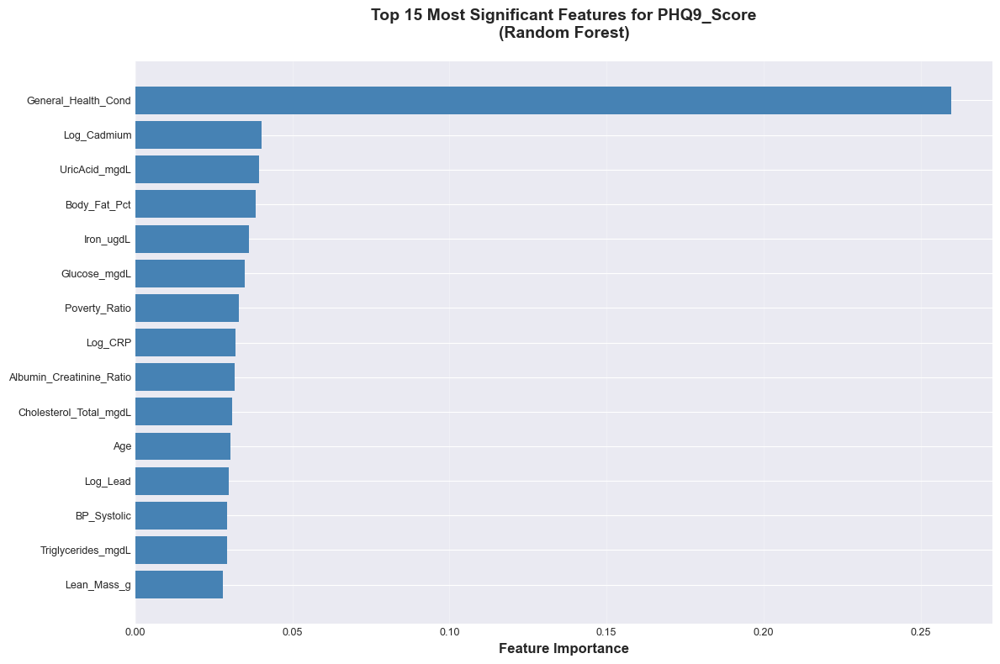


✓ Random Forest analysis complete
  Total features analyzed: 32
  Top 15 features account for 72.23% of total importance


,Gender,Age,Poverty_Ratio,Education_Level,Marital_Status,Race,General_Health_Cond,100_Cigs_Lifetime,Alcohol_Tried,Vigorous_Activity,BMI,Waist_cm,BP_Systolic,BP_Diastolic,Glucose_mgdL,Cholesterol_Total_mgdL,Triglycerides_mgdL,UricAcid_mgdL,Iron_ugdL,Creatinine_mgdL,Transferrin_Sat_Pct,WBC_1000cells,Hemoglobin_g_dL,Albumin_Creatinine_Ratio,VitaminD_nmolL,Body_Fat_Pct,Lean_Mass_g,Log_Lead,Log_Cadmium,Log_Mercury,Log_CRP,is_acute_inflammation
0,2.000,66.000,0.820,2.000,3.000,4.000,3.000,1.000,1.000,2.000,31.700,101.800,136.400,76.000,85.000,157.000,95.000,5.800,94.000,0.920,16.000,8.600,11.900,13.330,89.900,38.260,43382.780,0.476,-0.602,0.033,0.436,0
1,1.000,18.000,1.994,4.000,4.000,6.000,2.000,2.000,2.000,2.000,21.500,79.300,112.000,74.000,94.000,149.000,92.000,8.000,163.000,0.810,10.000,6.100,16.300,57.390,53.800,22.700,48765.600,-0.125,-0.658,1.027,-0.125,0
2,2.000,66.000,1.630,1.000,1.000,6.000,3.000,2.000,2.000,2.000,23.700,88.200,136.800,75.200,116.000,210.000,72.000,4.500,96.000,0.580,19.000,6.000,13.200,19.360,116.000,35.400,32812.340,0.188,-0.131,1.183,0.265,0
4,1.000,56.000,5.000,5.000,1.000,6.000,2.000,2.000,1.000,1.000,21.300,86.600,108.000,68.000,98.000,239.000,59.000,4.200,57.000,1.130,20.000,5.000,14.700,3.780,165.000,22.800,45725.800,0.334,-0.409,-0.678,-0.081,0
5,1.000,18.000,0.760,3.000,5.000,1.000,3.000,1.000,1.000,1.000,19.700,72.000,112.000,68.000,81.000,185.000,124.000,5.800,225.000,0.770,46.000,7.100,15.500,3.890,59.900,16.700,47323.200,-0.553,-0.569,-0.268,-0.420,0


In [ ]:
# Random Forest Feature Importance Analysis for PHQ9_Score
print("=" * 60)
print("RANDOM FOREST FEATURE IMPORTANCE ANALYSIS")
print("=" * 60)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# Prepare data for Random Forest
# Use the same exclusions as in correlation analysis
exclude_cols_rf = [
    "SEQN",
    "Depression",
    "PSU",
    "Strata",
    "MEC_Weight",
    "Trouble_Sleeping_Doc",
    "PHQ9_Score",  # Exclude target from features
]

# Get feature columns (same as correlation analysis)
X_rf = df_processed[
    [col for col in df_processed.columns if col not in exclude_cols_rf]
].copy()

# Remove the same columns as in correlation analysis to avoid multicollinearity
cols_to_remove_rf = [
    "BMI_Category",
    "Lead_ugdL",
    "Cadmium_ugL",
    "Mercury_Total_ugL",
    "CRP_mgL",
    "Trunk_Fat_g",
]

# Remove columns if they exist
existing_cols_to_remove_rf = [col for col in cols_to_remove_rf if col in X_rf.columns]
if existing_cols_to_remove_rf:
    X_rf = X_rf.drop(columns=existing_cols_to_remove_rf)
    print(
        f"\nRemoved {len(existing_cols_to_remove_rf)} columns to avoid multicollinearity:"
    )
    for col in existing_cols_to_remove_rf:
        print(f"  - {col}")

# Get target variable
y_rf = df_processed["PHQ9_Score"].copy()

# Remove rows with missing values in target or features
mask = ~(y_rf.isna() | X_rf.isna().any(axis=1))
X_rf_clean = X_rf[mask].copy()
y_rf_clean = y_rf[mask].copy()

print(f"\nData preparation:")
print(f"  Initial samples: {len(df_processed)}")
print(f"  Samples after removing missing values: {len(X_rf_clean)}")
print(f"  Number of features: {X_rf_clean.shape[1]}")

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X_rf_clean, y_rf_clean, test_size=0.2, random_state=42
)

print(f"\nTrain set: {X_train.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")

# Train Random Forest model
print("\nTraining Random Forest model...")
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1,
)

rf_model.fit(X_train, y_train)

# Evaluate model
y_train_pred = rf_model.predict(X_train)
y_test_pred = rf_model.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f"\nModel Performance:")
print(f"  Train R²: {train_r2:.4f}")
print(f"  Test R²: {test_r2:.4f}")
print(f"  Train RMSE: {train_rmse:.4f}")
print(f"  Test RMSE: {test_rmse:.4f}")

# Get feature importances
feature_importances = pd.DataFrame(
    {
        "Feature": X_rf_clean.columns,
        "Importance": rf_model.feature_importances_,
    }
).sort_values("Importance", ascending=False)

# Display top 15 features
print("\n" + "=" * 60)
print("TOP 15 MOST SIGNIFICANT FEATURES FOR PHQ9_Score")
print("=" * 60)
print(f"\n{'Rank':<6} {'Feature':<40} {'Importance':>12}")
print("-" * 60)

top_15 = feature_importances.head(15)
for idx, (_, row) in enumerate(top_15.iterrows(), 1):
    print(f"{idx:<6} {row['Feature']:<40} {row['Importance']:>12.6f}")

# Visualize top 15 features
fig, ax = plt.subplots(figsize=(12, 8))
top_15_plot = top_15.sort_values("Importance", ascending=True)
ax.barh(range(len(top_15_plot)), top_15_plot["Importance"], color="steelblue")
ax.set_yticks(range(len(top_15_plot)))
ax.set_yticklabels(top_15_plot["Feature"])
ax.set_xlabel("Feature Importance", fontsize=12, fontweight="bold")
ax.set_title(
    "Top 15 Most Significant Features for PHQ9_Score\n(Random Forest)",
    fontsize=14,
    fontweight="bold",
    pad=20,
)
ax.grid(axis="x", alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\n✓ Random Forest analysis complete")
print(f"  Total features analyzed: {len(feature_importances)}")
print(
    f"  Top 15 features account for {top_15['Importance'].sum():.2%} of total importance"
)

In [ ]:
# Investigation: Why Demographic/Behavioral Factors Are Missing from Top-15
print("=" * 60)
print("INVESTIGATION: MISSING DEMOGRAPHIC/BEHAVIORAL FACTORS")
print("=" * 60)

# Variables to check
check_vars = ["Gender", "Education_Level", "100_Cigs_Lifetime", "Alcohol_Tried"]

print("\n" + "=" * 60)
print("1. TECHNICAL SANITY CHECK")
print("=" * 60)

# Check if variables exist in X_rf_clean (input data before model.fit)
print("\n1.1 Checking if variables exist in X_rf_clean:")
print(f"   Total columns in X_rf_clean: {len(X_rf_clean.columns)}")
print(f"   Columns: {list(X_rf_clean.columns)}")

print("\n1.2 Checking presence of target variables:")
for var in check_vars:
    exists = var in X_rf_clean.columns
    status = "✓ EXISTS" if exists else "✗ MISSING"
    print(f"   {var:<25} {status}")

# Check encoding and values
print("\n1.3 Checking encoding and unique values:")
for var in check_vars:
    if var in X_rf_clean.columns:
        unique_vals = X_rf_clean[var].dropna().unique()
        n_unique = len(unique_vals)
        n_missing = X_rf_clean[var].isna().sum()
        pct_missing = (n_missing / len(X_rf_clean)) * 100

        print(f"\n   {var}:")
        print(
            f"     Unique values: {sorted(unique_vals) if n_unique <= 10 else f'{n_unique} unique values'}"
        )
        print(f"     Missing values: {n_missing} ({pct_missing:.2f}%)")
        print(f"     Data type: {X_rf_clean[var].dtype}")

        # Check if all values are the same
        if n_unique == 1:
            print(f"     ⚠ WARNING: Only one unique value! ({unique_vals[0]})")
        elif n_unique == 0:
            print(f"     ⚠ WARNING: No valid values!")
    else:
        print(f"\n   {var}: NOT FOUND in X_rf_clean")

print("\n" + "=" * 60)
print("2. RANK CHECK - Finding positions in full feature list")
print("=" * 60)

# Get full feature importance list
full_importance = feature_importances.copy()
full_importance["Rank"] = range(1, len(full_importance) + 1)

print(f"\nTotal features analyzed: {len(full_importance)}")
print(
    f"Top feature (General_Health_Cond) importance: {full_importance.iloc[0]['Importance']:.6f}"
)

print("\n2.1 Positions of target variables in full ranking:")
print(f"\n{'Rank':<6} {'Feature':<35} {'Importance':>12} {'% of Top':>12}")
print("-" * 70)

for var in check_vars:
    if var in full_importance["Feature"].values:
        row = full_importance[full_importance["Feature"] == var].iloc[0]
        rank = row["Rank"]
        importance = row["Importance"]
        pct_of_top = (importance / full_importance.iloc[0]["Importance"]) * 100
        print(
            f"{rank:<6} {row['Feature']:<35} {importance:>12.6f} {pct_of_top:>11.2f}%"
        )
    else:
        print(f"{'N/A':<6} {var:<35} {'NOT FOUND':>12}")

# Compare with top feature
print("\n2.2 Comparison with Top-15 threshold:")
if len(full_importance) >= 15:
    threshold_importance = full_importance.iloc[14]["Importance"]  # 15th feature
    print(f"   15th feature importance: {threshold_importance:.6f}")
    print(f"   Features below threshold:")
    for var in check_vars:
        if var in full_importance["Feature"].values:
            row = full_importance[full_importance["Feature"] == var].iloc[0]
            if row["Importance"] < threshold_importance:
                diff = threshold_importance - row["Importance"]
                print(f"     {var}: {row['Importance']:.6f} (below by {diff:.6f})")

print("\n" + "=" * 60)
print("3. CORRELATION DETECTIVE - Hypothesis Testing")
print("=" * 60)

# Prepare data for correlation analysis
df_corr_check = X_rf_clean.copy()
df_corr_check["PHQ9_Score"] = y_rf_clean.values

# Check correlations with Spearman (works for both numeric and ordinal)
from scipy.stats import spearmanr

print("\n3.1 Testing 'Substitution' Hypothesis:")
print("\n   Hypothesis 1: 100_Cigs_Lifetime vs Log_Cadmium")
print("   (Cadmium might be a better marker of smoking)")

if (
    "100_Cigs_Lifetime" in df_corr_check.columns
    and "Log_Cadmium" in df_corr_check.columns
):
    data_subset = df_corr_check[["100_Cigs_Lifetime", "Log_Cadmium"]].dropna()
    if len(data_subset) > 0:
        corr_coef, p_value = spearmanr(
            data_subset["100_Cigs_Lifetime"], data_subset["Log_Cadmium"]
        )
        print(f"     Spearman correlation: {corr_coef:.4f} (p={p_value:.4f})")
        print(
            f"     Interpretation: {'Strong' if abs(corr_coef) > 0.5 else 'Moderate' if abs(corr_coef) > 0.3 else 'Weak'} correlation"
        )
    else:
        print("     ⚠ No overlapping data")
else:
    missing = [
        v
        for v in ["100_Cigs_Lifetime", "Log_Cadmium"]
        if v not in df_corr_check.columns
    ]
    print(f"     ⚠ Missing variables: {missing}")

print("\n   Hypothesis 2: Education_Level vs Poverty_Ratio")
print("   (Income might override education)")

if (
    "Education_Level" in df_corr_check.columns
    and "Poverty_Ratio" in df_corr_check.columns
):
    data_subset = df_corr_check[["Education_Level", "Poverty_Ratio"]].dropna()
    if len(data_subset) > 0:
        corr_coef, p_value = spearmanr(
            data_subset["Education_Level"], data_subset["Poverty_Ratio"]
        )
        print(f"     Spearman correlation: {corr_coef:.4f} (p={p_value:.4f})")
        print(
            f"     Interpretation: {'Strong' if abs(corr_coef) > 0.5 else 'Moderate' if abs(corr_coef) > 0.3 else 'Weak'} correlation"
        )
    else:
        print("     ⚠ No overlapping data")
else:
    missing = [
        v
        for v in ["Education_Level", "Poverty_Ratio"]
        if v not in df_corr_check.columns
    ]
    print(f"     ⚠ Missing variables: {missing}")

print("\n   Hypothesis 3: Gender vs Lean_Mass_g")
print("   (Muscle mass might override gender)")

if "Gender" in df_corr_check.columns and "Lean_Mass_g" in df_corr_check.columns:
    data_subset = df_corr_check[["Gender", "Lean_Mass_g"]].dropna()
    if len(data_subset) > 0:
        corr_coef, p_value = spearmanr(
            data_subset["Gender"], data_subset["Lean_Mass_g"]
        )
        print(f"     Spearman correlation: {corr_coef:.4f} (p={p_value:.4f})")
        print(
            f"     Interpretation: {'Strong' if abs(corr_coef) > 0.5 else 'Moderate' if abs(corr_coef) > 0.3 else 'Weak'} correlation"
        )
    else:
        print("     ⚠ No overlapping data")
else:
    missing = [v for v in ["Gender", "Lean_Mass_g"] if v not in df_corr_check.columns]
    print(f"     ⚠ Missing variables: {missing}")

# Additional: Check direct correlation with PHQ9_Score
print("\n3.2 Direct correlation with PHQ9_Score:")
print(f"\n{'Variable':<25} {'Spearman r':>12} {'p-value':>12}")
print("-" * 50)

for var in check_vars:
    if var in df_corr_check.columns:
        data_subset = df_corr_check[[var, "PHQ9_Score"]].dropna()
        if len(data_subset) > 0:
            corr_coef, p_value = spearmanr(data_subset[var], data_subset["PHQ9_Score"])
            sig = (
                "***"
                if p_value < 0.001
                else "**"
                if p_value < 0.01
                else "*"
                if p_value < 0.05
                else ""
            )
            print(f"{var:<25} {corr_coef:>11.4f}{sig} {p_value:>11.4f}")
        else:
            print(f"{var:<25} {'NO DATA':>12}")

print("\n" + "=" * 60)
print("4. SUMMARY REPORT")
print("=" * 60)

print("\n4.1 Technical Status:")
all_exist = all(var in X_rf_clean.columns for var in check_vars)
if all_exist:
    print("   ✓ All target variables exist in input data")
    print("   ✓ No technical errors detected")
else:
    missing_vars = [var for var in check_vars if var not in X_rf_clean.columns]
    print(f"   ✗ Technical error: Missing variables: {missing_vars}")
    print("   → Action required: Check preprocessing pipeline")

print("\n4.2 Feature Competition Analysis:")
print("   Variables found in ranking:")
found_vars = [var for var in check_vars if var in full_importance["Feature"].values]
for var in found_vars:
    row = full_importance[full_importance["Feature"] == var].iloc[0]
    rank = row["Rank"]
    importance = row["Importance"]
    top_importance = full_importance.iloc[0]["Importance"]
    ratio = (importance / top_importance) * 100
    print(
        f"     {var}: Rank {rank}, Importance {importance:.6f} ({ratio:.1f}% of top feature)"
    )

not_found = [var for var in check_vars if var not in full_importance["Feature"].values]
if not_found:
    print(f"\n   Variables NOT found in ranking: {not_found}")
    print("   → Possible reasons: Removed during preprocessing or all values identical")

print("\n4.3 Conclusion:")
print("   Based on the analysis above:")
print(
    "   - If variables exist but have low importance: Feature competition (biological markers override)"
)
print("   - If variables are missing: Technical error in preprocessing")
print(
    "   - If variables have high correlation with top features: Substitution hypothesis confirmed"
)

print("\n" + "=" * 60)
print("✓ Investigation complete")
print("=" * 60)


INVESTIGATION: MISSING DEMOGRAPHIC/BEHAVIORAL FACTORS

1. TECHNICAL SANITY CHECK

1.1 Checking if variables exist in X_rf_clean:
   Total columns in X_rf_clean: 32
   Columns: ['Gender', 'Age', 'Poverty_Ratio', 'Education_Level', 'Marital_Status', 'Race', 'General_Health_Cond', '100_Cigs_Lifetime', 'Alcohol_Tried', 'Vigorous_Activity', 'BMI', 'Waist_cm', 'BP_Systolic', 'BP_Diastolic', 'Glucose_mgdL', 'Cholesterol_Total_mgdL', 'Triglycerides_mgdL', 'UricAcid_mgdL', 'Iron_ugdL', 'Creatinine_mgdL', 'Transferrin_Sat_Pct', 'WBC_1000cells', 'Hemoglobin_g_dL', 'Albumin_Creatinine_Ratio', 'VitaminD_nmolL', 'Body_Fat_Pct', 'Lean_Mass_g', 'Log_Lead', 'Log_Cadmium', 'Log_Mercury', 'Log_CRP', 'is_acute_inflammation']

1.2 Checking presence of target variables:
   Gender                    ✓ EXISTS
   Education_Level           ✓ EXISTS
   100_Cigs_Lifetime         ✓ EXISTS
   Alcohol_Tried             ✓ EXISTS

1.3 Checking encoding and unique values:

   Gender:
     Unique values: [np.float64(1.0

In [ ]:
# Feature Substitution Analysis: "Battle of Features" Visualizations
print("=" * 60)
print("FEATURE SUBSTITUTION ANALYSIS: PROXY VALIDATION")
print("=" * 60)

# Prepare data for visualization
df_viz = X_rf_clean.copy()
df_viz["PHQ9_Score"] = y_rf_clean.values

# Ensure plots directory exists
plots_dir = Path("plots")
plots_dir.mkdir(exist_ok=True)

print("\nCreating 3 proxy validation plots...")

# ============================================================================
# Plot 1: Smoking vs. Cadmium (Biomarker Validation)
# ============================================================================
print("\n[1/3] Creating: Smoking vs. Cadmium (Biomarker Validation)")

if "100_Cigs_Lifetime" in df_viz.columns and "Log_Cadmium" in df_viz.columns:
    # Prepare data
    plot_data = df_viz[["100_Cigs_Lifetime", "Log_Cadmium"]].dropna()

    if len(plot_data) > 0:
        fig, ax = plt.subplots(figsize=(10, 6))

        # Create boxplot
        categories = sorted(plot_data["100_Cigs_Lifetime"].unique())
        category_labels = [
            "Non-Smoker (0)" if cat == 0 else "Smoker (1)" for cat in categories
        ]

        data_by_category = [
            plot_data[plot_data["100_Cigs_Lifetime"] == cat]["Log_Cadmium"].values
            for cat in categories
        ]

        bp = ax.boxplot(
            data_by_category,
            labels=category_labels,
            patch_artist=True,
            widths=0.6,
            showmeans=True,
            meanline=True,
        )

        # Color boxes
        colors = ["#3498db", "#e74c3c"]
        for patch, color in zip(bp["boxes"], colors[: len(bp["boxes"])]):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)

        # Styling
        ax.set_ylabel("Log_Cadmium (log-transformed)", fontsize=12, fontweight="bold")
        ax.set_xlabel("100_Cigs_Lifetime", fontsize=12, fontweight="bold")
        ax.set_title(
            "Proxy Analysis: Smoking vs. Cadmium\n(Biomarker Validation)",
            fontsize=14,
            fontweight="bold",
            pad=15,
        )
        ax.grid(axis="y", alpha=0.3, linestyle="--")

        # Add sample size annotations
        for i, cat in enumerate(categories):
            n = len(plot_data[plot_data["100_Cigs_Lifetime"] == cat])
            median_val = plot_data[plot_data["100_Cigs_Lifetime"] == cat][
                "Log_Cadmium"
            ].median()
            ax.text(
                i + 1,
                median_val,
                f"n={n}",
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
            )

        plt.tight_layout()

        # Save
        filename = plots_dir / "proxy_analysis_smoking_vs_cadmium.png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
        print(f"  ✓ Saved: {filename.name}")

        plt.show()
        plt.close()
    else:
        print("  ⚠ No data available for this plot")
else:
    missing = [
        v for v in ["100_Cigs_Lifetime", "Log_Cadmium"] if v not in df_viz.columns
    ]
    print(f"  ⚠ Missing variables: {missing}")

# ============================================================================
# Plot 2: Education vs. Poverty (Socio-economic Link)
# ============================================================================
print("\n[2/3] Creating: Education vs. Poverty (Socio-economic Link)")

if "Education_Level" in df_viz.columns and "Poverty_Ratio" in df_viz.columns:
    # Prepare data
    plot_data = df_viz[["Education_Level", "Poverty_Ratio"]].dropna()

    if len(plot_data) > 0:
        fig, ax = plt.subplots(figsize=(12, 6))

        # Create boxplot
        categories = sorted(plot_data["Education_Level"].unique())
        category_labels = [f"Level {int(cat)}" for cat in categories]

        data_by_category = [
            plot_data[plot_data["Education_Level"] == cat]["Poverty_Ratio"].values
            for cat in categories
        ]

        bp = ax.boxplot(
            data_by_category,
            labels=category_labels,
            patch_artist=True,
            widths=0.6,
            showmeans=True,
            meanline=True,
        )

        # Color boxes with gradient
        import matplotlib.cm as cm

        colors = cm.Blues(np.linspace(0.4, 0.9, len(bp["boxes"])))
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)

        # Styling
        ax.set_ylabel("Poverty_Ratio", fontsize=12, fontweight="bold")
        ax.set_xlabel("Education_Level", fontsize=12, fontweight="bold")
        ax.set_title(
            "Proxy Analysis: Education vs. Poverty\n(Socio-economic Link)",
            fontsize=14,
            fontweight="bold",
            pad=15,
        )
        ax.grid(axis="y", alpha=0.3, linestyle="--")

        # Add sample size annotations
        for i, cat in enumerate(categories):
            n = len(plot_data[plot_data["Education_Level"] == cat])
            median_val = plot_data[plot_data["Education_Level"] == cat][
                "Poverty_Ratio"
            ].median()
            ax.text(
                i + 1,
                median_val,
                f"n={n}",
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
            )

        plt.tight_layout()

        # Save
        filename = plots_dir / "proxy_analysis_education_vs_poverty.png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
        print(f"  ✓ Saved: {filename.name}")

        plt.show()
        plt.close()
    else:
        print("  ⚠ No data available for this plot")
else:
    missing = [
        v for v in ["Education_Level", "Poverty_Ratio"] if v not in df_viz.columns
    ]
    print(f"  ⚠ Missing variables: {missing}")

# ============================================================================
# Plot 3: Gender vs. Body Composition (Biological Deconstruction)
# ============================================================================
print("\n[3/3] Creating: Gender vs. Body Composition (Biological Deconstruction)")

if all(var in df_viz.columns for var in ["Gender", "Body_Fat_Pct", "Lean_Mass_g"]):
    # Prepare data
    plot_data = df_viz[["Gender", "Body_Fat_Pct", "Lean_Mass_g"]].dropna()

    if len(plot_data) > 0:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        # Gender mapping for labels
        gender_map = (
            {0: "Male (0)", 1: "Female (1)"}
            if 0 in plot_data["Gender"].values
            else {1: "Male (1)", 2: "Female (2)"}
        )

        # Panel A: Gender vs Body_Fat_Pct
        categories = sorted(plot_data["Gender"].unique())
        category_labels = [gender_map.get(cat, f"Category {cat}") for cat in categories]

        data_by_category = [
            plot_data[plot_data["Gender"] == cat]["Body_Fat_Pct"].values
            for cat in categories
        ]

        bp1 = axes[0].boxplot(
            data_by_category,
            labels=category_labels,
            patch_artist=True,
            widths=0.6,
            showmeans=True,
            meanline=True,
        )

        colors_gender = ["#3498db", "#e74c3c"]
        for patch, color in zip(bp1["boxes"], colors_gender[: len(bp1["boxes"])]):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)

        axes[0].set_ylabel("Body_Fat_Pct (%)", fontsize=11, fontweight="bold")
        axes[0].set_xlabel("Gender", fontsize=11, fontweight="bold")
        axes[0].set_title(
            "Panel A: Gender vs Body Fat %", fontsize=12, fontweight="bold", pad=10
        )
        axes[0].grid(axis="y", alpha=0.3, linestyle="--")

        # Add sample size annotations
        for i, cat in enumerate(categories):
            n = len(plot_data[plot_data["Gender"] == cat])
            median_val = plot_data[plot_data["Gender"] == cat]["Body_Fat_Pct"].median()
            axes[0].text(
                i + 1,
                median_val,
                f"n={n}",
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
            )

        # Panel B: Gender vs Lean_Mass_g
        data_by_category = [
            plot_data[plot_data["Gender"] == cat]["Lean_Mass_g"].values
            for cat in categories
        ]

        bp2 = axes[1].boxplot(
            data_by_category,
            labels=category_labels,
            patch_artist=True,
            widths=0.6,
            showmeans=True,
            meanline=True,
        )

        for patch, color in zip(bp2["boxes"], colors_gender[: len(bp2["boxes"])]):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)

        axes[1].set_ylabel("Lean_Mass_g (grams)", fontsize=11, fontweight="bold")
        axes[1].set_xlabel("Gender", fontsize=11, fontweight="bold")
        axes[1].set_title(
            "Panel B: Gender vs Lean Mass", fontsize=12, fontweight="bold", pad=10
        )
        axes[1].grid(axis="y", alpha=0.3, linestyle="--")

        # Add sample size annotations
        for i, cat in enumerate(categories):
            n = len(plot_data[plot_data["Gender"] == cat])
            median_val = plot_data[plot_data["Gender"] == cat]["Lean_Mass_g"].median()
            axes[1].text(
                i + 1,
                median_val,
                f"n={n}",
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
            )

        # Overall title
        fig.suptitle(
            "Proxy Analysis: Gender vs. Body Composition\n(Biological Deconstruction)",
            fontsize=14,
            fontweight="bold",
            y=1.02,
        )

        plt.tight_layout()

        # Save
        filename = plots_dir / "proxy_analysis_gender_vs_body_composition.png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
        print(f"  ✓ Saved: {filename.name}")

        plt.show()
        plt.close()
    else:
        print("  ⚠ No data available for this plot")
else:
    missing = [
        v for v in ["Gender", "Body_Fat_Pct", "Lean_Mass_g"] if v not in df_viz.columns
    ]
    print(f"  ⚠ Missing variables: {missing}")

print("\n" + "=" * 60)
print("✓ Feature Substitution Analysis complete!")
print(f"  Total plots saved: 3")
print(f"  Location: {plots_dir.absolute()}")
print("=" * 60)


MACHINE LEARNING MODEL FOR DEPRESSION PREDICTION

STEP 1: DATA PREPARATION

Dataset Statistics:
  Total samples: 5,086
  Number of features: 32
  Depression cases (1): 461.0 (9.06%)
  No depression cases (0): 4,625 (90.94%)
  Class imbalance ratio: 10.03:1

Train set: 4,068 samples
Test set: 1,018 samples
Train set depression rate: 9.07%
Test set depression rate: 9.04%

STEP 2: HANDLING CLASS IMBALANCE WITH SMOTE
Before SMOTE:
  Train samples: 4,068
  Depression cases: 369.0 (9.07%)
  No depression cases: 3,699 (90.93%)

After SMOTE:
  Train samples: 7,398
  Depression cases: 3,699.0 (50.00%)
  No depression cases: 3,699 (50.00%)

STEP 3: TRAINING MULTIPLE ML MODELS

[1/4] Training XGBoost Classifier...
[2/4] Training LightGBM Classifier...
[3/4] Training Random Forest Classifier...
[4/4] Training Logistic Regression...

✓ All models trained successfully!

STEP 4: MODEL EVALUATION

--------------------------------------------------------------------------------
Evaluating XGBoost:
----

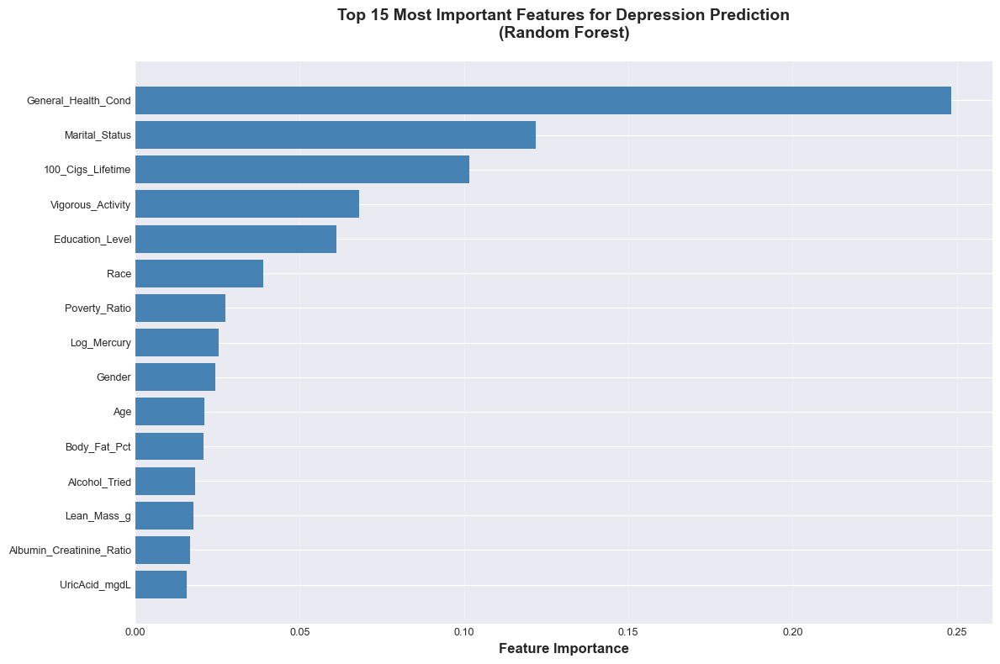


STEP 7: ROC CURVE VISUALIZATION


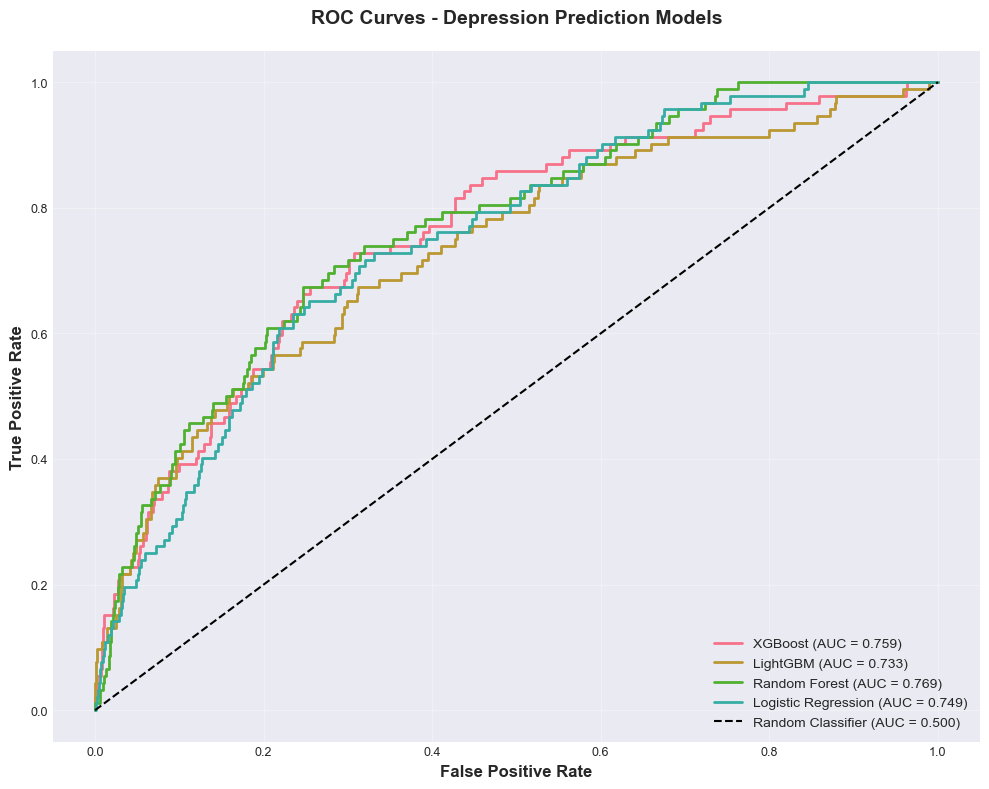


FINAL SUMMARY

✓ Successfully trained 5 machine learning models
✓ Best model: Random Forest
✓ Test set performance:
    - F1-Score: 0.3429
    - ROC-AUC:  0.7690
    - Accuracy: 0.8870

✓ Model is ready for depression prediction using the same features
  used in the Random Forest regression analysis


In [47]:
# ==============================================================================
# DEPRESSION PREDICTION MODEL - COMPREHENSIVE ML PIPELINE
# ==============================================================================
# This cell trains multiple ML models to predict depression (binary classification)
# Target: Depression (1 = PHQ9_Score >= 10, 0 = otherwise)
# Features: Same 32 features used in Random Forest regression analysis

print("=" * 80)
print("MACHINE LEARNING MODEL FOR DEPRESSION PREDICTION")
print("=" * 80)

# Import required libraries
import warnings

warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    roc_curve,
    confusion_matrix,
    classification_report,
)
import xgboost as xgb
import lightgbm as lgb
from imblearn.over_sampling import SMOTE

# ==============================================================================
# 1. DATA PREPARATION
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 1: DATA PREPARATION")
print("=" * 80)

# Use the same feature exclusion as in Random Forest analysis
exclude_cols_ml = [
    "SEQN",
    "Depression",  # Target variable
    "PSU",
    "Strata",
    "MEC_Weight",
    "Trouble_Sleeping_Doc",
    "PHQ9_Score",  # Exclude target score from features
]

# Get feature columns (same as Random Forest)
X_ml = df_processed[
    [col for col in df_processed.columns if col not in exclude_cols_ml]
].copy()

# Remove columns to avoid multicollinearity (same as Random Forest)
cols_to_remove_ml = [
    "BMI_Category",
    "Lead_ugdL",
    "Cadmium_ugL",
    "Mercury_Total_ugL",
    "CRP_mgL",
    "Trunk_Fat_g",
]

existing_cols_to_remove_ml = [col for col in cols_to_remove_ml if col in X_ml.columns]
if existing_cols_to_remove_ml:
    X_ml = X_ml.drop(columns=existing_cols_to_remove_ml)
    print(
        f"Removed {len(existing_cols_to_remove_ml)} columns to avoid multicollinearity"
    )

# Get target variable (binary classification)
y_ml = df_processed["Depression"].copy()

# Remove rows with missing values
mask_ml = ~(y_ml.isna() | X_ml.isna().any(axis=1))
X_ml_clean = X_ml[mask_ml].copy()
y_ml_clean = y_ml[mask_ml].copy()

print(f"\nDataset Statistics:")
print(f"  Total samples: {len(X_ml_clean):,}")
print(f"  Number of features: {X_ml_clean.shape[1]}")
print(f"  Depression cases (1): {y_ml_clean.sum():,} ({y_ml_clean.mean() * 100:.2f}%)")
print(
    f"  No depression cases (0): {(y_ml_clean == 0).sum():,} ({(1 - y_ml_clean.mean()) * 100:.2f}%)"
)
print(f"  Class imbalance ratio: {(y_ml_clean == 0).sum() / y_ml_clean.sum():.2f}:1")

# Split data into train and test sets (stratified to maintain class distribution)
X_train_ml, X_test_ml, y_train_ml, y_test_ml = train_test_split(
    X_ml_clean, y_ml_clean, test_size=0.2, random_state=42, stratify=y_ml_clean
)

print(f"\nTrain set: {X_train_ml.shape[0]:,} samples")
print(f"Test set: {X_test_ml.shape[0]:,} samples")
print(f"Train set depression rate: {y_train_ml.mean() * 100:.2f}%")
print(f"Test set depression rate: {y_test_ml.mean() * 100:.2f}%")

# ==============================================================================
# 2. HANDLE CLASS IMBALANCE WITH SMOTE
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 2: HANDLING CLASS IMBALANCE WITH SMOTE")
print("=" * 80)

# Apply SMOTE to balance the training set
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_ml, y_train_ml)

print(f"Before SMOTE:")
print(f"  Train samples: {len(X_train_ml):,}")
print(f"  Depression cases: {y_train_ml.sum():,} ({y_train_ml.mean() * 100:.2f}%)")
print(
    f"  No depression cases: {(y_train_ml == 0).sum():,} ({(1 - y_train_ml.mean()) * 100:.2f}%)"
)

print(f"\nAfter SMOTE:")
print(f"  Train samples: {len(X_train_balanced):,}")
print(
    f"  Depression cases: {y_train_balanced.sum():,} ({y_train_balanced.mean() * 100:.2f}%)"
)
print(
    f"  No depression cases: {(y_train_balanced == 0).sum():,} ({(1 - y_train_balanced.mean()) * 100:.2f}%)"
)

# ==============================================================================
# 3. TRAIN MULTIPLE MODELS
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 3: TRAINING MULTIPLE ML MODELS")
print("=" * 80)

# Dictionary to store models and their results
models = {}
results = {}

# Calculate scale_pos_weight for XGBoost and LightGBM (handles class imbalance)
scale_pos_weight = (y_train_ml == 0).sum() / y_train_ml.sum()

# 3.1 XGBoost Classifier (Best for tabular data)
print("\n[1/4] Training XGBoost Classifier...")
xgb_model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    eval_metric="logloss",
    n_jobs=-1,
)
xgb_model.fit(X_train_balanced, y_train_balanced)
models["XGBoost"] = xgb_model

# 3.2 LightGBM Classifier
print("[2/4] Training LightGBM Classifier...")
lgb_model = lgb.LGBMClassifier(
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1,
)
lgb_model.fit(X_train_balanced, y_train_balanced)
models["LightGBM"] = lgb_model

# 3.3 Random Forest Classifier
print("[3/4] Training Random Forest Classifier...")
rf_clf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2,
    class_weight="balanced",  # Handles class imbalance
    random_state=42,
    n_jobs=-1,
)
rf_clf.fit(X_train_balanced, y_train_balanced)
models["Random Forest"] = rf_clf

# 3.4 Logistic Regression (with scaling)
print("[4/4] Training Logistic Regression...")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test_ml)

lr_model = LogisticRegression(
    max_iter=1000, class_weight="balanced", random_state=42, C=1.0
)
lr_model.fit(X_train_scaled, y_train_balanced)
models["Logistic Regression"] = lr_model
models["Scaler"] = scaler  # Store scaler for later use

print("\n✓ All models trained successfully!")

# ==============================================================================
# 4. MODEL EVALUATION
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 4: MODEL EVALUATION")
print("=" * 80)

# Evaluate each model
for name, model in models.items():
    if name == "Scaler":
        continue

    print(f"\n{'-' * 80}")
    print(f"Evaluating {name}:")
    print(f"{'-' * 80}")

    # Make predictions
    if name == "Logistic Regression":
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
    else:
        y_pred = model.predict(X_test_ml)
        y_pred_proba = model.predict_proba(X_test_ml)[:, 1]

    # Calculate metrics
    accuracy = accuracy_score(y_test_ml, y_pred)
    precision = precision_score(y_test_ml, y_pred, zero_division=0)
    recall = recall_score(y_test_ml, y_pred, zero_division=0)
    f1 = f1_score(y_test_ml, y_pred, zero_division=0)
    roc_auc = roc_auc_score(y_test_ml, y_pred_proba)

    # Store results
    results[name] = {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc,
        "predictions": y_pred,
        "probabilities": y_pred_proba,
    }

    # Print metrics
    print(f"  Accuracy:  {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall:    {recall:.4f}")
    print(f"  F1-Score:  {f1:.4f}")
    print(f"  ROC-AUC:   {roc_auc:.4f}")

    # Confusion matrix
    cm = confusion_matrix(y_test_ml, y_pred)
    print(f"\n  Confusion Matrix:")
    print(f"                 Predicted")
    print(f"                 No Dep  Dep")
    print(f"  Actual No Dep   {cm[0, 0]:5d}  {cm[0, 1]:3d}")
    print(f"         Dep      {cm[1, 0]:5d}  {cm[1, 1]:3d}")

# ==============================================================================
# 5. SELECT BEST MODEL
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 5: MODEL COMPARISON AND SELECTION")
print("=" * 80)

# Create comparison DataFrame
comparison_df = pd.DataFrame(
    {
        "Model": list(results.keys()),
        "Accuracy": [results[m]["accuracy"] for m in results.keys()],
        "Precision": [results[m]["precision"] for m in results.keys()],
        "Recall": [results[m]["recall"] for m in results.keys()],
        "F1-Score": [results[m]["f1"] for m in results.keys()],
        "ROC-AUC": [results[m]["roc_auc"] for m in results.keys()],
    }
)

# Sort by F1-Score (best metric for imbalanced classification)
comparison_df = comparison_df.sort_values("F1-Score", ascending=False)

print("\nModel Performance Comparison (sorted by F1-Score):")
print("=" * 80)
print(comparison_df.to_string(index=False))

# Select best model (highest F1-Score)
best_model_name = comparison_df.iloc[0]["Model"]
best_model = models[best_model_name]

print(f"\n{'=' * 80}")
print(f"BEST MODEL: {best_model_name}")
print(f"{'=' * 80}")
print(f"  F1-Score: {comparison_df.iloc[0]['F1-Score']:.4f}")
print(f"  ROC-AUC:  {comparison_df.iloc[0]['ROC-AUC']:.4f}")
print(f"  Accuracy: {comparison_df.iloc[0]['Accuracy']:.4f}")
print(f"  Precision: {comparison_df.iloc[0]['Precision']:.4f}")
print(f"  Recall:   {comparison_df.iloc[0]['Recall']:.4f}")

# ==============================================================================
# 6. FEATURE IMPORTANCE ANALYSIS (for tree-based models)
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 6: FEATURE IMPORTANCE ANALYSIS")
print("=" * 80)

# Get feature importance from best tree-based model
if best_model_name in ["XGBoost", "LightGBM", "Random Forest"]:
    if best_model_name == "XGBoost":
        importances = best_model.feature_importances_
    elif best_model_name == "LightGBM":
        importances = best_model.feature_importances_
    else:  # Random Forest
        importances = best_model.feature_importances_

    feature_importance_df = pd.DataFrame(
        {"Feature": X_ml_clean.columns, "Importance": importances}
    ).sort_values("Importance", ascending=False)

    print(f"\nTop 15 Most Important Features ({best_model_name}):")
    print("-" * 80)
    print(f"{'Rank':<6} {'Feature':<40} {'Importance':>12}")
    print("-" * 80)

    top_15_ml = feature_importance_df.head(15)
    for idx, (_, row) in enumerate(top_15_ml.iterrows(), 1):
        print(f"{idx:<6} {row['Feature']:<40} {row['Importance']:>12.6f}")

    # Visualize feature importance
    fig, ax = plt.subplots(figsize=(12, 8))
    top_15_plot = top_15_ml.sort_values("Importance", ascending=True)
    ax.barh(range(len(top_15_plot)), top_15_plot["Importance"], color="steelblue")
    ax.set_yticks(range(len(top_15_plot)))
    ax.set_yticklabels(top_15_plot["Feature"])
    ax.set_xlabel("Feature Importance", fontsize=12, fontweight="bold")
    ax.set_title(
        f"Top 15 Most Important Features for Depression Prediction\n({best_model_name})",
        fontsize=14,
        fontweight="bold",
        pad=20,
    )
    ax.grid(axis="x", alpha=0.3)
    plt.tight_layout()
    plt.show()

# ==============================================================================
# 7. ROC CURVE VISUALIZATION
# ==============================================================================
print("\n" + "=" * 80)
print("STEP 7: ROC CURVE VISUALIZATION")
print("=" * 80)

# Plot ROC curves for all models
fig, ax = plt.subplots(figsize=(10, 8))

for name, result in results.items():
    fpr, tpr, _ = roc_curve(y_test_ml, result["probabilities"])
    ax.plot(fpr, tpr, label=f"{name} (AUC = {result['roc_auc']:.3f})", linewidth=2)

# Plot diagonal line (random classifier)
ax.plot([0, 1], [0, 1], "k--", label="Random Classifier (AUC = 0.500)", linewidth=1.5)

ax.set_xlabel("False Positive Rate", fontsize=12, fontweight="bold")
ax.set_ylabel("True Positive Rate", fontsize=12, fontweight="bold")
ax.set_title(
    "ROC Curves - Depression Prediction Models", fontsize=14, fontweight="bold", pad=20
)
ax.legend(loc="lower right", fontsize=10)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ==============================================================================
# 8. FINAL SUMMARY
# ==============================================================================
print("\n" + "=" * 80)
print("FINAL SUMMARY")
print("=" * 80)
print(f"\n✓ Successfully trained {len(models)} machine learning models")
print(f"✓ Best model: {best_model_name}")
print(f"✓ Test set performance:")
print(f"    - F1-Score: {comparison_df.iloc[0]['F1-Score']:.4f}")
print(f"    - ROC-AUC:  {comparison_df.iloc[0]['ROC-AUC']:.4f}")
print(f"    - Accuracy: {comparison_df.iloc[0]['Accuracy']:.4f}")
print(f"\n✓ Model is ready for depression prediction using the same features")
print(f"  used in the Random Forest regression analysis")
print("=" * 80)


## 8. Machine Learning Model for Depression Prediction

We will train multiple machine learning models to predict depression (binary classification) using the same features that were used for the Random Forest regression model. We'll compare different algorithms and select the best performing model.


EDA: TOP 15 FEATURES vs PHQ9_Score

✓ Plots directory: c:\Users\Nikita\dev\the\notebooks\plots

Analyzing 15 features...

[1/15] Processing: General_Health_Cond
  ✓ Saved: eda_General_Health_Cond_vs_phq9.png


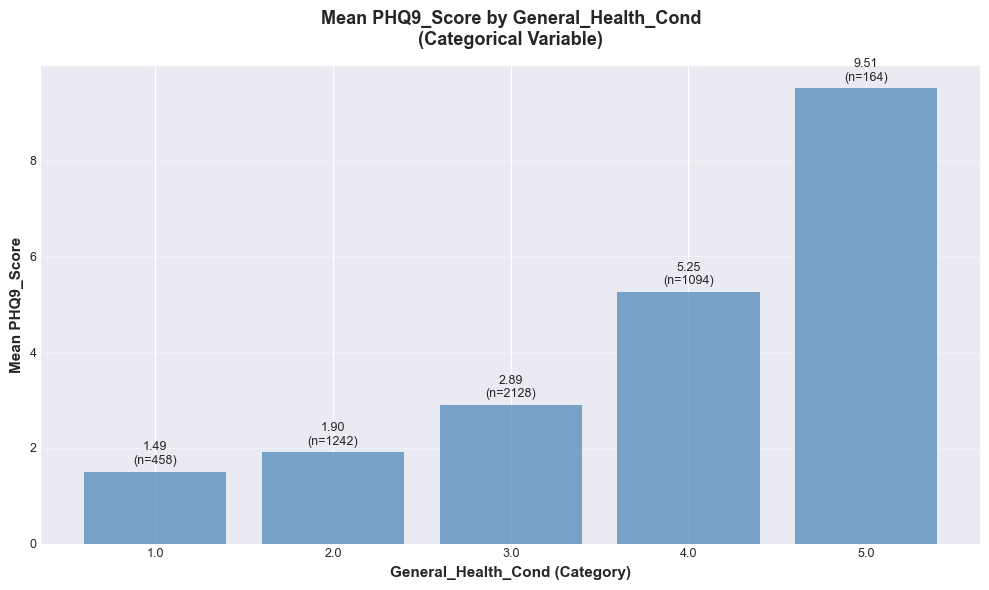


[2/15] Processing: Log_Cadmium
  ✓ Saved: eda_Log_Cadmium_vs_phq9.png


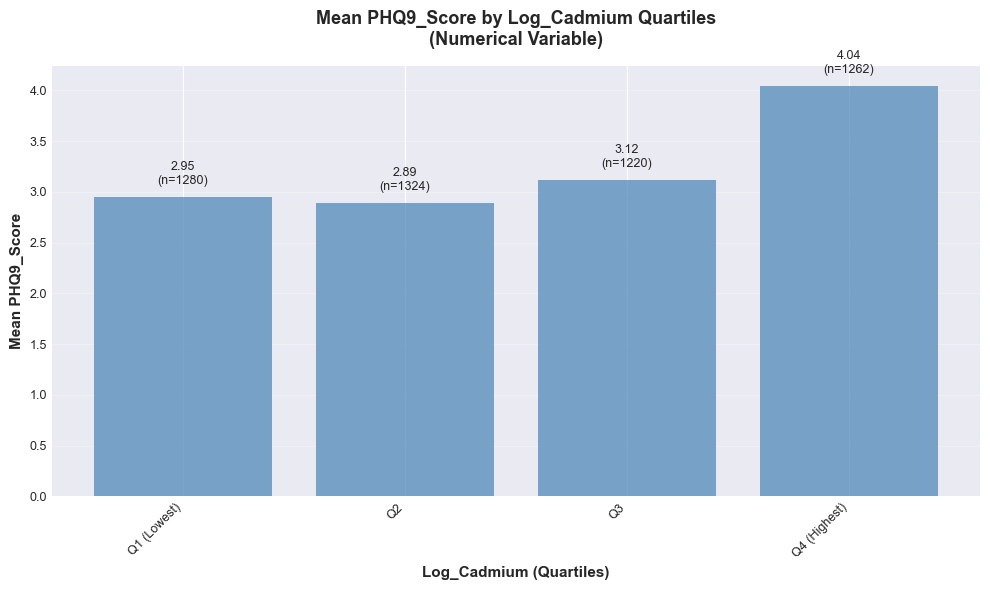


[3/15] Processing: UricAcid_mgdL
  ✓ Saved: eda_UricAcid_mgdL_vs_phq9.png


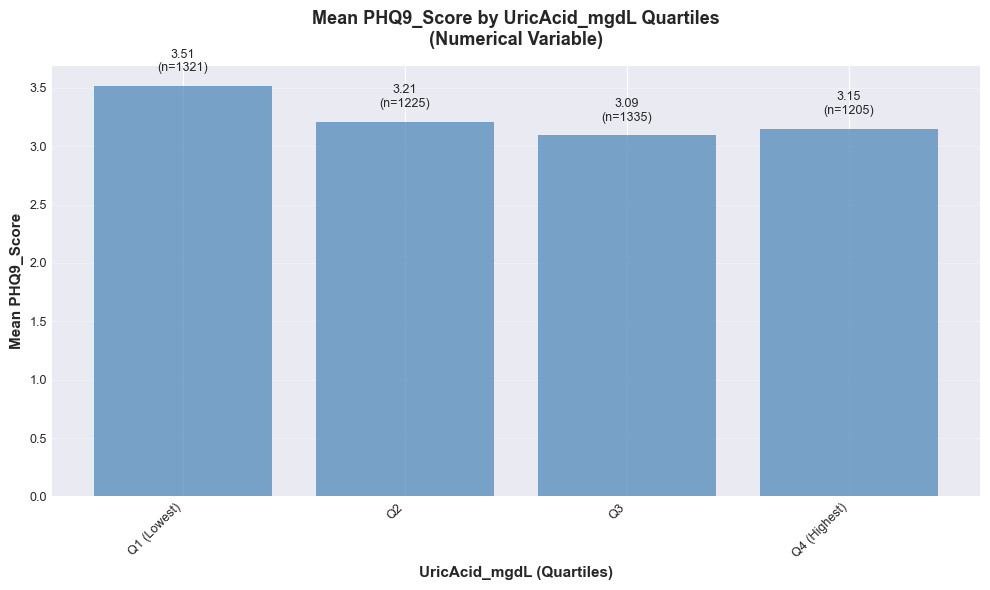


[4/15] Processing: Body_Fat_Pct
  ✓ Saved: eda_Body_Fat_Pct_vs_phq9.png


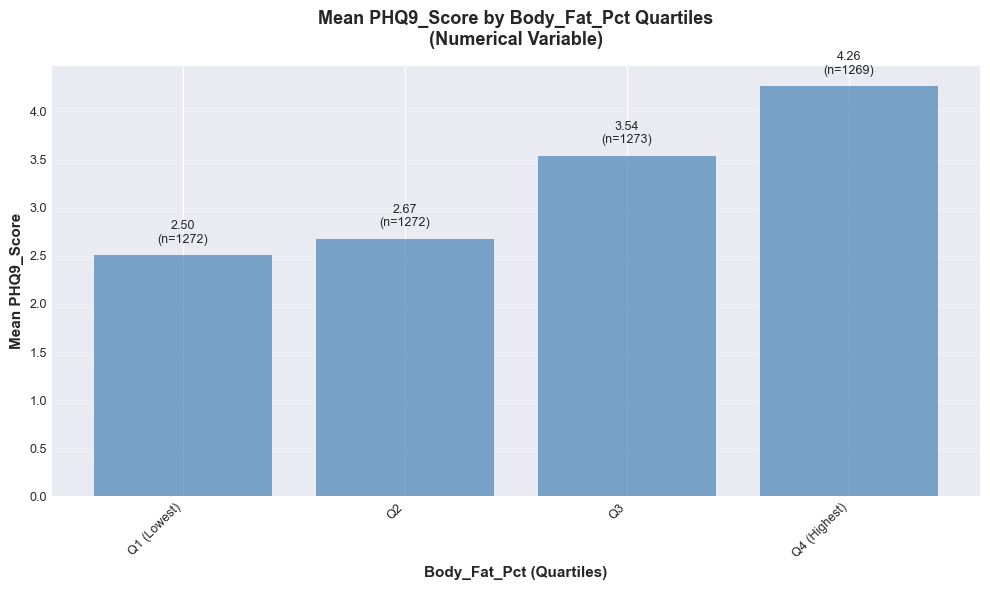


[5/15] Processing: Iron_ugdL
  ✓ Saved: eda_Iron_ugdL_vs_phq9.png


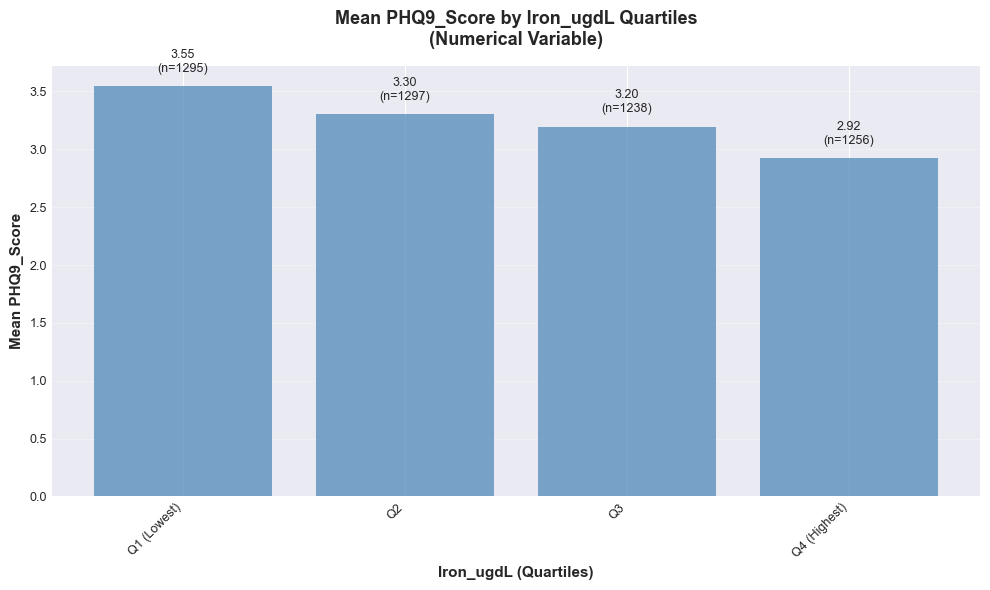


[6/15] Processing: Glucose_mgdL
  ✓ Saved: eda_Glucose_mgdL_vs_phq9.png


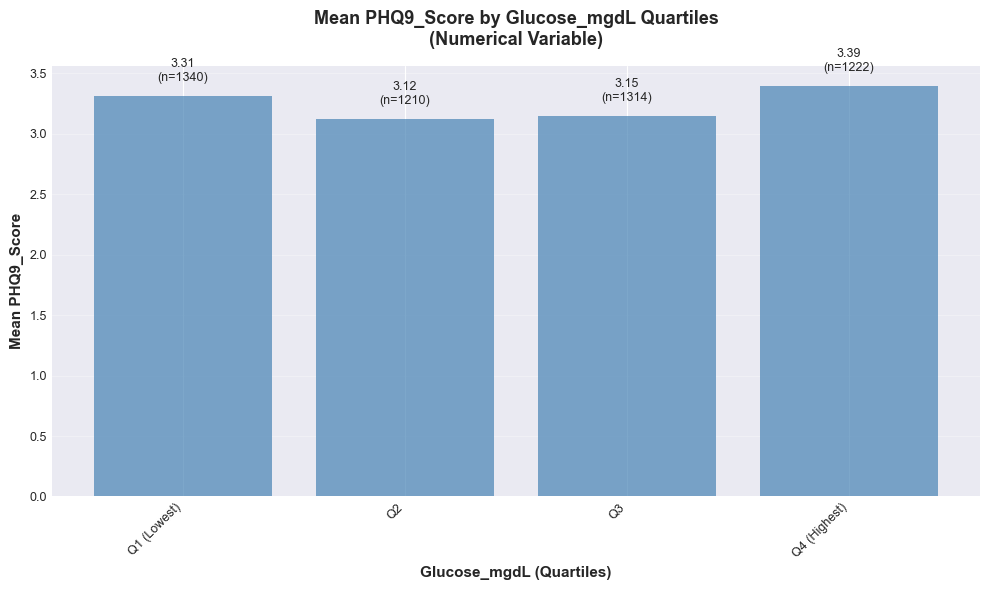


[7/15] Processing: Poverty_Ratio
  ✓ Saved: eda_Poverty_Ratio_vs_phq9.png


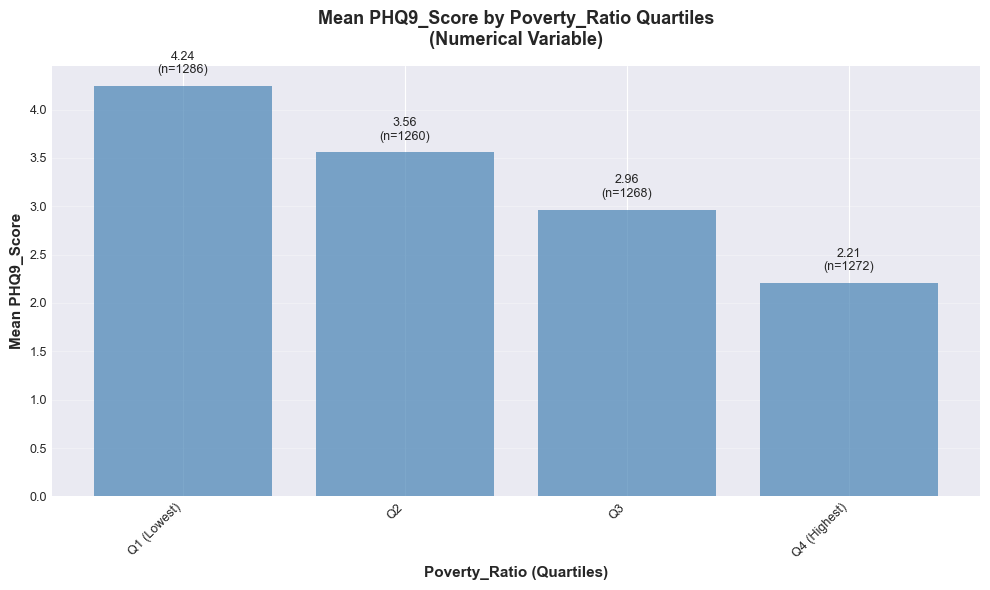


[8/15] Processing: Log_CRP
  ✓ Saved: eda_Log_CRP_vs_phq9.png


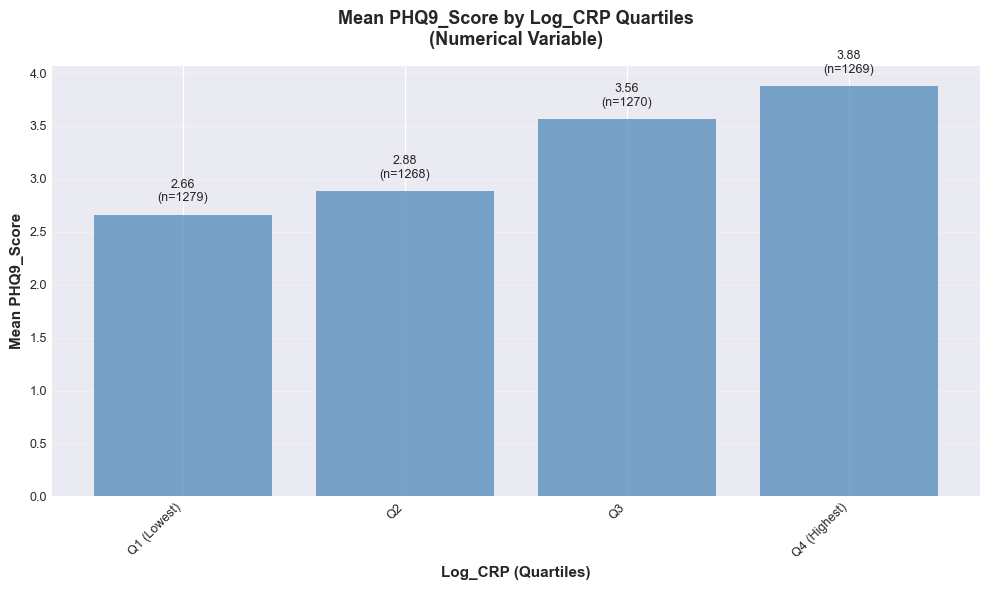


[9/15] Processing: Albumin_Creatinine_Ratio
  ✓ Saved: eda_Albumin_Creatinine_Ratio_vs_phq9.png


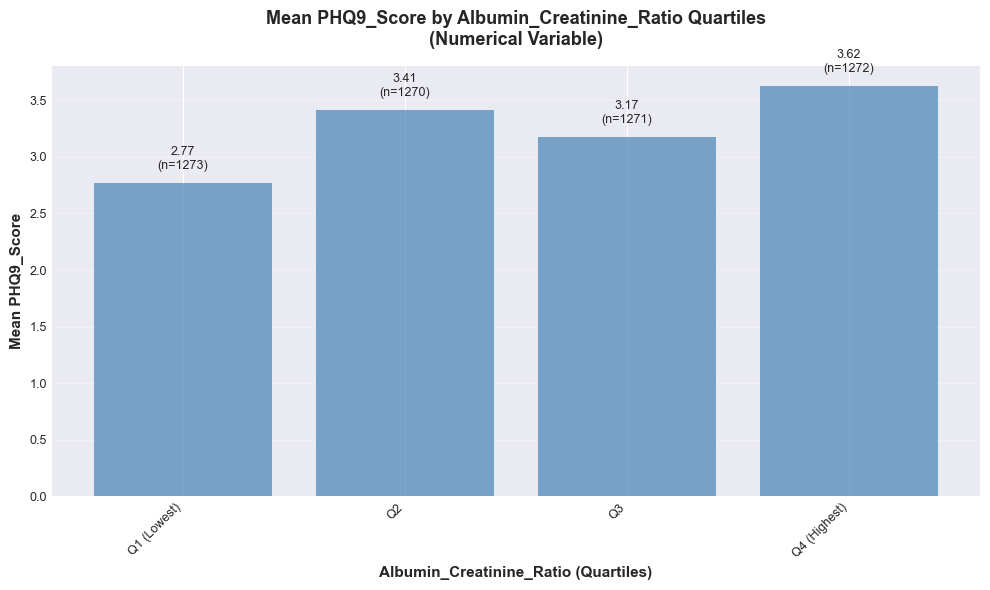


[10/15] Processing: Cholesterol_Total_mgdL
  ✓ Saved: eda_Cholesterol_Total_mgdL_vs_phq9.png


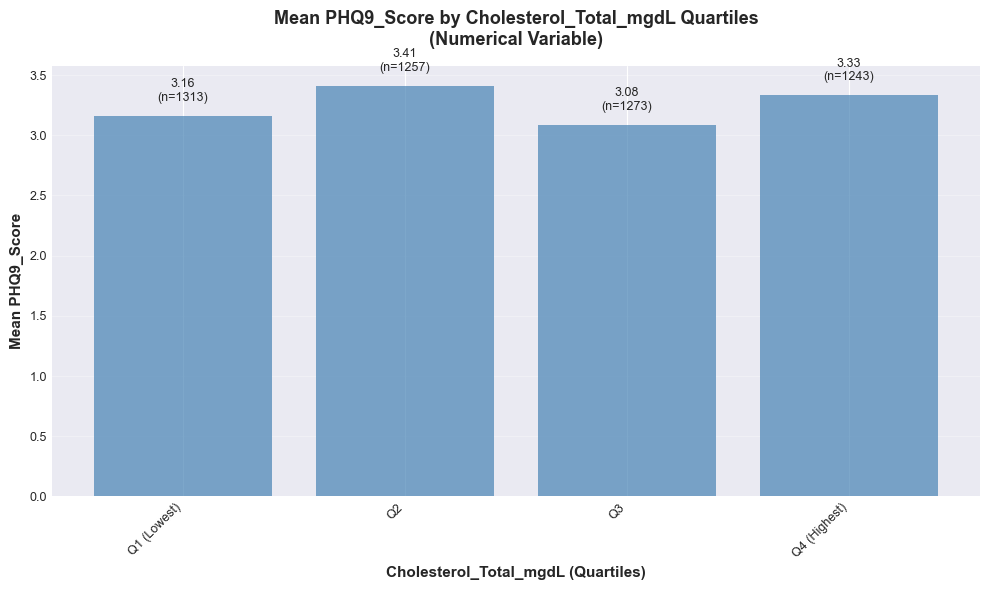


[11/15] Processing: Age
  ✓ Saved: eda_Age_vs_phq9.png


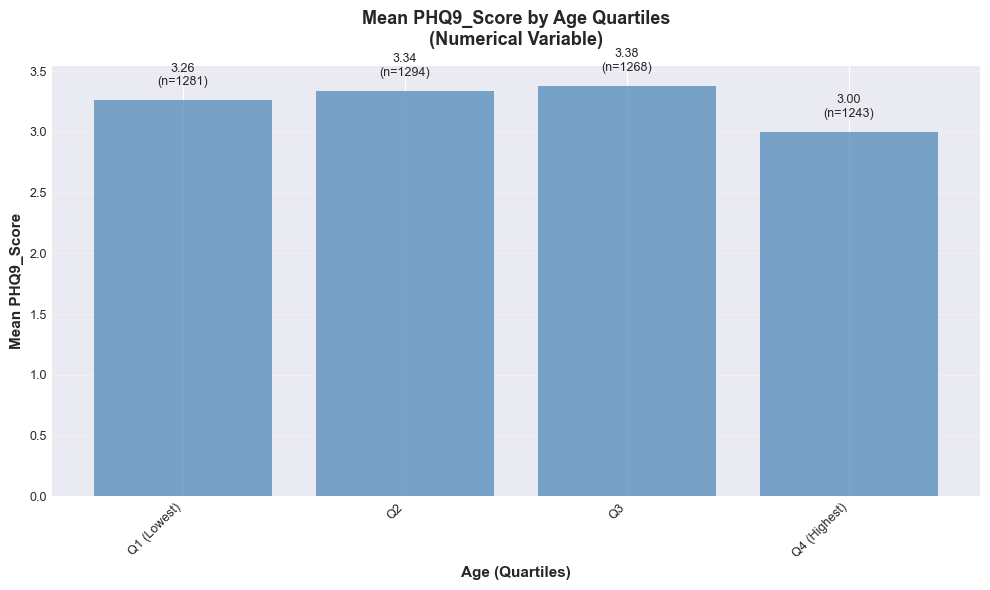


[12/15] Processing: Log_Lead
  ✓ Saved: eda_Log_Lead_vs_phq9.png


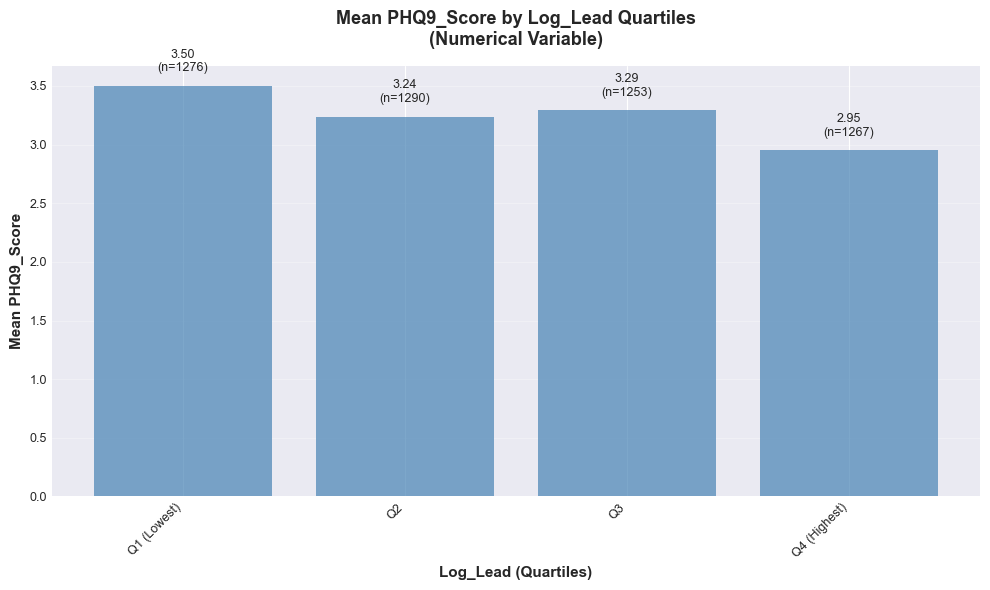


[13/15] Processing: BP_Systolic
  ✓ Saved: eda_BP_Systolic_vs_phq9.png


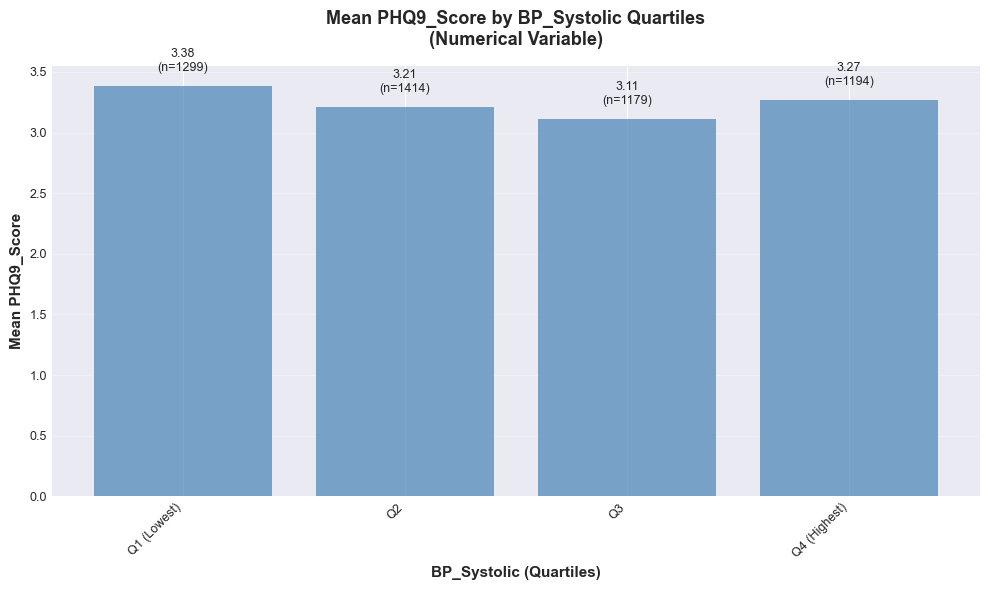


[14/15] Processing: Triglycerides_mgdL
  ✓ Saved: eda_Triglycerides_mgdL_vs_phq9.png


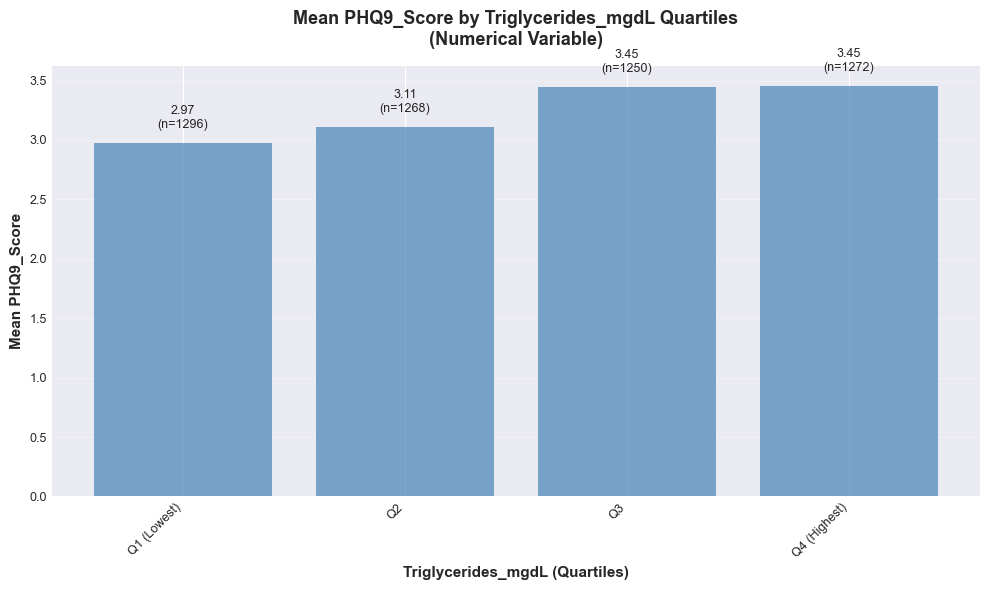


[15/15] Processing: Lean_Mass_g
  ✓ Saved: eda_Lean_Mass_g_vs_phq9.png


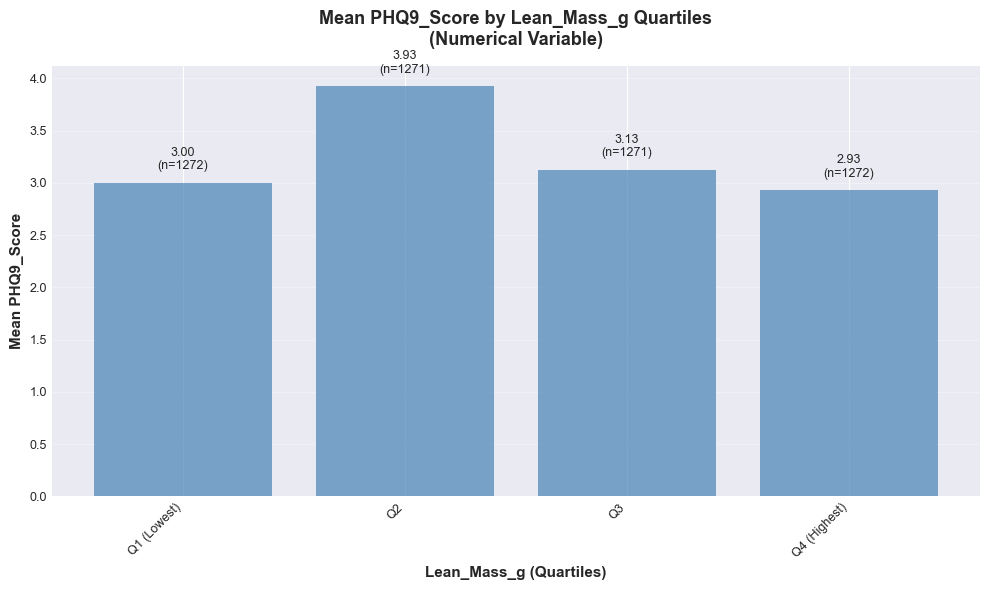


✓ EDA visualization complete!
  Total plots saved: 15
  Location: c:\Users\Nikita\dev\the\notebooks\plots


In [ ]:
# EDA: Visualize Top 15 Features Relationship with PHQ9_Score
print("=" * 60)
print("EDA: TOP 15 FEATURES vs PHQ9_Score")
print("=" * 60)

# Create plots directory if it doesn't exist
plots_dir = Path("plots")
plots_dir.mkdir(exist_ok=True)
print(f"\n✓ Plots directory: {plots_dir.absolute()}")

# Get top 15 feature names
top_15_features = top_15["Feature"].tolist()

# Prepare data (use the same clean data as Random Forest)
# Merge X_rf_clean with y_rf_clean to have all data together
df_eda = X_rf_clean.copy()
df_eda["PHQ9_Score"] = y_rf_clean.values

print(f"\nAnalyzing {len(top_15_features)} features...")


# Function to determine if a variable is categorical
def is_categorical(series, max_unique=10):
    """Determine if a series is categorical based on unique values"""
    n_unique = series.nunique()
    # If few unique values and they're integers, likely categorical
    if n_unique <= max_unique:
        # Check if values are mostly integers
        non_null = series.dropna()
        if len(non_null) > 0:
            is_int_like = (non_null % 1 == 0).all()
            return is_int_like
    return False


# Create visualizations for each feature
for idx, feature in enumerate(top_15_features, 1):
    print(f"\n[{idx}/{len(top_15_features)}] Processing: {feature}")

    # Check if feature exists in data
    if feature not in df_eda.columns:
        print(f"  ⚠ Warning: {feature} not found in data, skipping...")
        continue

    # Remove rows with missing values for this feature or target
    df_plot = df_eda[[feature, "PHQ9_Score"]].dropna()

    if len(df_plot) == 0:
        print(f"  ⚠ Warning: No valid data for {feature}, skipping...")
        continue

    # Determine if categorical or numerical
    is_cat = is_categorical(df_plot[feature])

    fig, ax = plt.subplots(figsize=(10, 6))

    if is_cat:
        # Categorical variable: Bar plot with mean PHQ9_Score per category
        category_means = df_plot.groupby(feature)["PHQ9_Score"].mean().sort_index()
        category_counts = df_plot.groupby(feature)["PHQ9_Score"].count()

        bars = ax.bar(
            range(len(category_means)),
            category_means.values,
            color="steelblue",
            alpha=0.7,
        )

        # Add value labels on bars
        for i, (bar, mean_val, count) in enumerate(
            zip(bars, category_means.values, category_counts.values)
        ):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.1,
                f"{mean_val:.2f}\n(n={count})",
                ha="center",
                va="bottom",
                fontsize=9,
            )

        ax.set_xticks(range(len(category_means)))
        ax.set_xticklabels([f"{cat}" for cat in category_means.index], rotation=0)
        ax.set_xlabel(f"{feature} (Category)", fontsize=11, fontweight="bold")
        ax.set_ylabel("Mean PHQ9_Score", fontsize=11, fontweight="bold")
        ax.set_title(
            f"Mean PHQ9_Score by {feature}\n(Categorical Variable)",
            fontsize=13,
            fontweight="bold",
            pad=15,
        )
        ax.grid(axis="y", alpha=0.3)

    else:
        # Numerical variable: Split into quartiles and show mean PHQ9_Score
        quartiles = pd.qcut(
            df_plot[feature],
            q=4,
            labels=["Q1 (Lowest)", "Q2", "Q3", "Q4 (Highest)"],
            duplicates="drop",
        )

        quartile_means = df_plot.groupby(quartiles)["PHQ9_Score"].mean()
        quartile_counts = df_plot.groupby(quartiles)["PHQ9_Score"].count()

        bars = ax.bar(
            range(len(quartile_means)),
            quartile_means.values,
            color="steelblue",
            alpha=0.7,
        )

        # Add value labels on bars
        for i, (bar, mean_val, count) in enumerate(
            zip(bars, quartile_means.values, quartile_counts.values)
        ):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.1,
                f"{mean_val:.2f}\n(n={count})",
                ha="center",
                va="bottom",
                fontsize=9,
            )

        ax.set_xticks(range(len(quartile_means)))
        ax.set_xticklabels(quartile_means.index, rotation=45, ha="right")
        ax.set_xlabel(f"{feature} (Quartiles)", fontsize=11, fontweight="bold")
        ax.set_ylabel("Mean PHQ9_Score", fontsize=11, fontweight="bold")
        ax.set_title(
            f"Mean PHQ9_Score by {feature} Quartiles\n(Numerical Variable)",
            fontsize=13,
            fontweight="bold",
            pad=15,
        )
        ax.grid(axis="y", alpha=0.3)

    plt.tight_layout()

    # Save figure
    safe_feature_name = feature.replace("/", "_").replace(" ", "_")
    filename = plots_dir / f"eda_{safe_feature_name}_vs_phq9.png"
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    print(f"  ✓ Saved: {filename.name}")

    # Display in notebook
    plt.show()

    plt.close()

print(f"\n" + "=" * 60)
print("✓ EDA visualization complete!")
print(f"  Total plots saved: {len(top_15_features)}")
print(f"  Location: {plots_dir.absolute()}")
